In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

import warnings
warnings.filterwarnings('ignore')  #Suppress filter warnings

In [3]:
range_of_cols = 'A:CC'
HSC_data = pd.read_excel('HSC_CHW_Data_20190101-20191231.xlsx',sheet_name='FullData',usecols=range_of_cols,
                        skiprows=3)
HSC_data.head()

,Time_range,Day_of_week,Occupancy,month,Tdb,Twb,CHLR_LCHWT1,CHLR_LCWT1,CHLR_RCHWT1,CHLR_RCWT1,...,CW Pump2,CW Pump3,CW Pump4,CHW Bypass flow,CHW loop Return Temp,CHW loop Supply Temp,CHW make up flow,CHW make up flow total,Secondary CHW flow,sec_load
0,2019-01-01 00:00:00,2,Unoccupied,1,46.940,44.930620,44.950,54.825,48.775,56.575,...,0.0,0.13,22.000,0.000,48.370,45.675,0.14,27764.05,601.403,67.532545
1,2019-01-01 01:00:00,2,Unoccupied,1,46.604,44.656086,44.700,54.650,48.650,56.375,...,0.0,0.13,21.775,-0.013,48.225,45.505,0.14,27764.05,597.935,67.765967
2,2019-01-01 02:00:00,2,Unoccupied,1,44.060,42.622744,44.900,54.875,48.550,56.500,...,0.0,0.13,19.475,0.013,48.218,45.590,0.14,27764.05,623.810,68.307195
3,2019-01-01 03:00:00,2,Unoccupied,1,43.934,43.015251,44.975,54.875,48.700,56.450,...,0.0,0.13,19.775,0.000,48.307,45.745,0.14,27764.05,615.000,65.651250
4,2019-01-01 04:00:00,2,Unoccupied,1,42.875,42.421400,45.000,54.925,48.600,56.650,...,0.0,0.13,19.225,-0.025,48.305,45.673,0.14,27764.05,623.715,68.400745


In [4]:
HSC_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 81 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8760 non-null   datetime64[ns]
 1   Day_of_week             8760 non-null   int64         
 2   Occupancy               8760 non-null   object        
 3   month                   8760 non-null   int64         
 4   Tdb                     8760 non-null   float64       
 5   Twb                     8760 non-null   float64       
 6   CHLR_LCHWT1             8668 non-null   float64       
 7   CHLR_LCWT1              8668 non-null   float64       
 8   CHLR_RCHWT1             8668 non-null   float64       
 9   CHLR_RCWT1              8586 non-null   float64       
 10  CHW flow1               8603 non-null   float64       
 11  CHWET1                  8603 non-null   float64       
 12  CHWLT1                  8603 non-null   float64 

**Number of Operating Chillers**

In [5]:
HSC_data['chillers_no'] = HSC_data['CHLR_ON1']+HSC_data['CHLR_ON2']+HSC_data['CHLR_ON3']+HSC_data['CHLR_ON4']

In [6]:
HSC_data['chillers_no'].unique()

array([1, 2, 3, 0, 4], dtype=int64)

In [7]:
HSC_data = HSC_data[HSC_data['chillers_no']>0]

In [8]:
HSC_data.info()
HSC_data['chillers_no'].unique()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8581 entries, 0 to 8759
Data columns (total 82 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8581 non-null   datetime64[ns]
 1   Day_of_week             8581 non-null   int64         
 2   Occupancy               8581 non-null   object        
 3   month                   8581 non-null   int64         
 4   Tdb                     8581 non-null   float64       
 5   Twb                     8581 non-null   float64       
 6   CHLR_LCHWT1             8581 non-null   float64       
 7   CHLR_LCWT1              8581 non-null   float64       
 8   CHLR_RCHWT1             8581 non-null   float64       
 9   CHLR_RCWT1              8581 non-null   float64       
 10  CHW flow1               8580 non-null   float64       
 11  CHWET1                  8580 non-null   float64       
 12  CHWLT1                  8580 non-null   float64 

array([1, 2, 3, 4], dtype=int64)

# Remove Data with zero Secondary Load Data

In [9]:
HSC_data = HSC_data[HSC_data['sec_load'] != 0]
len(HSC_data)

8580

# Total of individual chiller loads

In [10]:
chiller_capacity = 600
HSC_data['load_total'] = (HSC_data['PLR1'] + HSC_data['PLR2'] + HSC_data['PLR3'] + HSC_data['PLR4'])*chiller_capacity

# Plot of Sec Load Vs Sum of Individual Chiller Loads

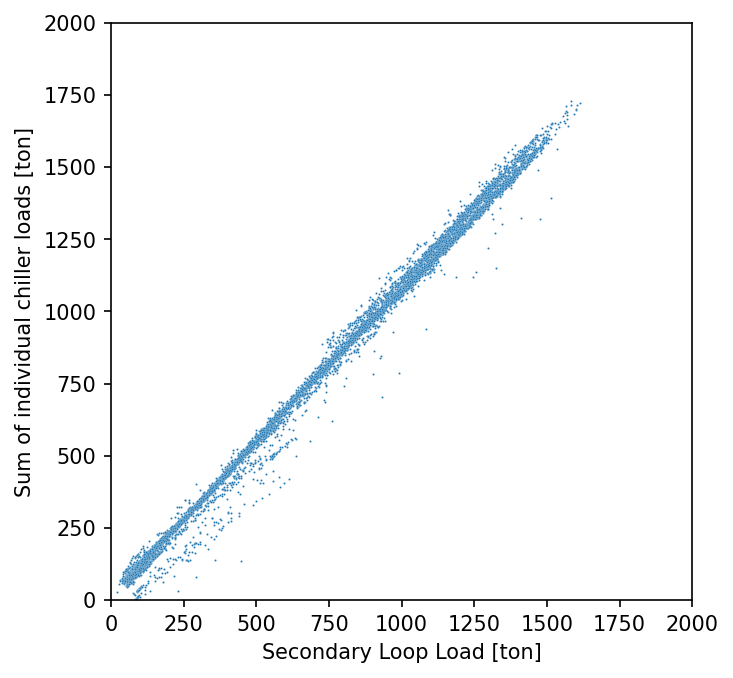

In [11]:
plt.figure(figsize=(5,5),dpi=150)

sns.scatterplot(data=HSC_data,x='sec_load',y='load_total',s=1)
plt.xlim(0,2000)
plt.ylim(0,2000)
plt.xlabel('Secondary Loop Load [ton]')
plt.ylabel('Sum of individual chiller loads [ton]');

In [12]:
HSC_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8580 entries, 0 to 8759
Data columns (total 83 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8580 non-null   datetime64[ns]
 1   Day_of_week             8580 non-null   int64         
 2   Occupancy               8580 non-null   object        
 3   month                   8580 non-null   int64         
 4   Tdb                     8580 non-null   float64       
 5   Twb                     8580 non-null   float64       
 6   CHLR_LCHWT1             8580 non-null   float64       
 7   CHLR_LCWT1              8580 non-null   float64       
 8   CHLR_RCHWT1             8580 non-null   float64       
 9   CHLR_RCWT1              8580 non-null   float64       
 10  CHW flow1               8580 non-null   float64       
 11  CHWET1                  8580 non-null   float64       
 12  CHWLT1                  8580 non-null   float64 

# Condenser Flows

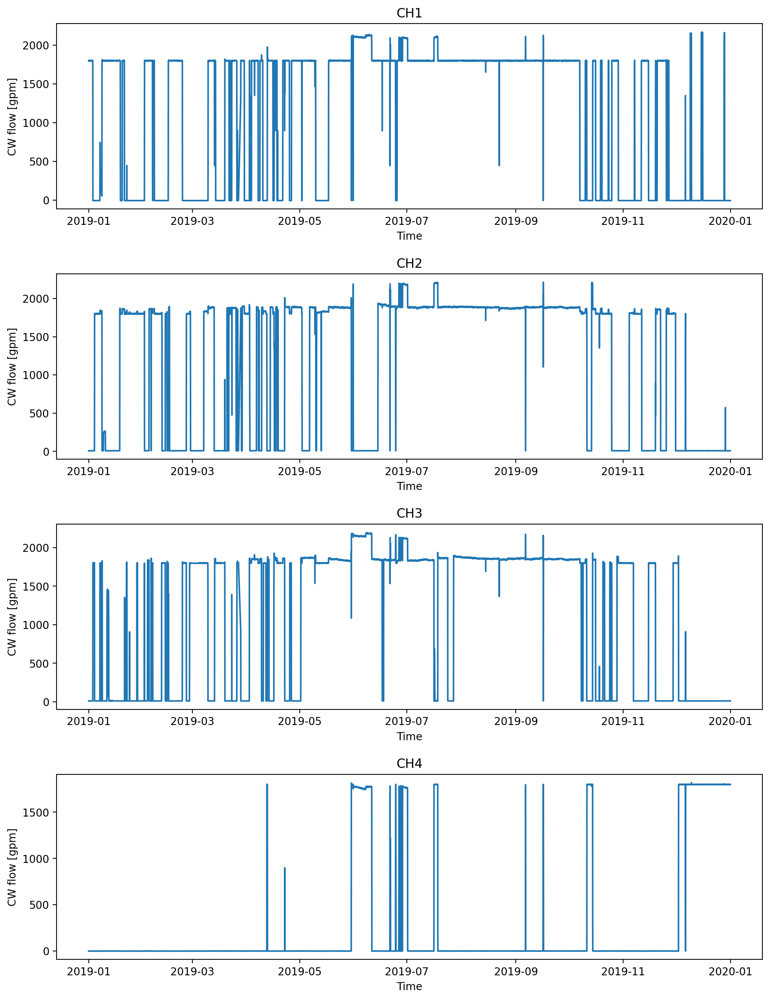

In [13]:
fig,ax = plt.subplots(4,1, figsize=(12,16),dpi=200)

for i in range(4):
    sns.lineplot(data=HSC_data,x='Time_range',y='CW flow{n}'.format(n=str(i+1)),ax=ax[i])
    ax[i].set_xlabel('Time',fontsize=10)
    ax[i].set_ylabel('CW flow [gpm]',fontsize=10)
    ax[i].set_title('CH{n}'.format(n=str(i+1)))
    #ax[i].set_xlim(datetime(2019, 1, 1, 0, 0, 0), datetime(2020, 1, 1, 0, 0, 0))

fig.subplots_adjust(hspace=0.35)

# PLR w.r.t Secondary Load

* The PLR_sec is sometimes > 1.0. This required further investigation!

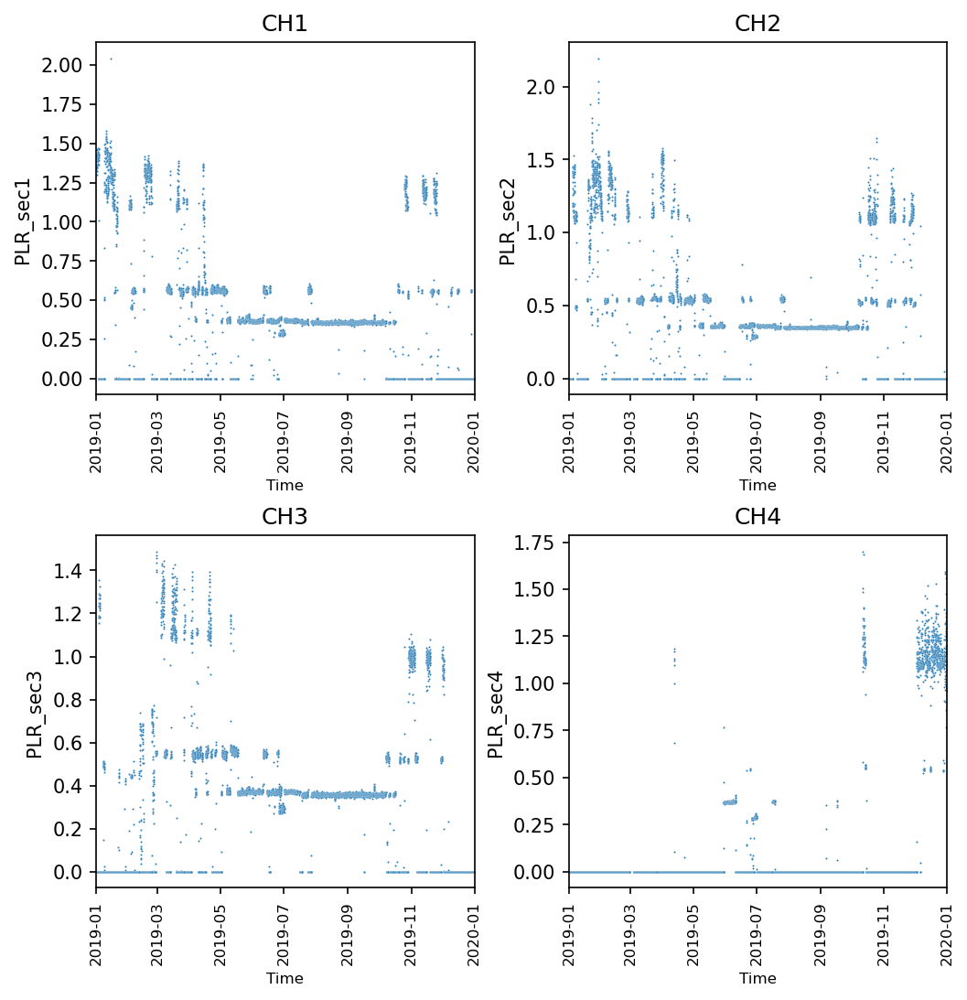

In [14]:
fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

for i in range(4):
    if i < 2:
        sns.scatterplot(data=HSC_data,x='Time_range',y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Time',fontsize=8)
        #ax[0][i].set_ylabel('Total individual load/Secondary load',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(datetime(2019, 1, 1, 0, 0, 0), datetime(2020,1, 1, 0, 0, 0))
        ax[0][i].tick_params(axis='x',rotation=90,labelsize=8)
    else:
        sns.scatterplot(data=HSC_data,x='Time_range',y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Time',fontsize=8)
        #ax[0][i].set_ylabel('Total individual load/Secondary load',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(datetime(2019, 1, 1, 0, 0, 0), datetime(2020,1, 1, 0, 0, 0))
        ax[1][i-2].tick_params(axis='x',rotation=90,labelsize=8)

fig.subplots_adjust(hspace=0.4,wspace=0.25)

# Average individual chiller DT Vs Loop DT

In [15]:
#Average individual chiller CHWST
HSC_data['LCHWT_avg'] = (HSC_data['CHLR_LCHWT1']*HSC_data['CHW flow1']+
                         HSC_data['CHLR_LCHWT2']*HSC_data['CHW flow2']+
                         HSC_data['CHLR_LCHWT3']*HSC_data['CHW flow3']+
                         HSC_data['CHLR_LCHWT4']*HSC_data['CHW flow4'])/(HSC_data['CHW flow1']+HSC_data['CHW flow2']+
                                                                         HSC_data['CHW flow3']+ HSC_data['CHW flow4'])  
HSC_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8580 entries, 0 to 8759
Data columns (total 84 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8580 non-null   datetime64[ns]
 1   Day_of_week             8580 non-null   int64         
 2   Occupancy               8580 non-null   object        
 3   month                   8580 non-null   int64         
 4   Tdb                     8580 non-null   float64       
 5   Twb                     8580 non-null   float64       
 6   CHLR_LCHWT1             8580 non-null   float64       
 7   CHLR_LCWT1              8580 non-null   float64       
 8   CHLR_RCHWT1             8580 non-null   float64       
 9   CHLR_RCWT1              8580 non-null   float64       
 10  CHW flow1               8580 non-null   float64       
 11  CHWET1                  8580 non-null   float64       
 12  CHWLT1                  8580 non-null   float64 

**Average chiller CHWRT & Adjusted loop return temperature**

In [16]:
HSC_data['RCHWT_avg'] = (HSC_data['CHLR_RCHWT1']*HSC_data['CHW flow1']+
                         HSC_data['CHLR_RCHWT2']*HSC_data['CHW flow2']+
                         HSC_data['CHLR_RCHWT3']*HSC_data['CHW flow3']+
                         HSC_data['CHLR_RCHWT4']*HSC_data['CHW flow4'])/(HSC_data['CHW flow1']+HSC_data['CHW flow2']+
                                                                         HSC_data['CHW flow3']+HSC_data['CHW flow4'])
HSC_data['Adj Loop CHWRT'] = (HSC_data['CHW loop Return Temp']*HSC_data['Secondary CHW flow']+
                             HSC_data['LCHWT_avg']*HSC_data['CHW Bypass flow'])/(HSC_data['Secondary CHW flow']+
                                                                                HSC_data['CHW Bypass flow'])

HSC_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8580 entries, 0 to 8759
Data columns (total 86 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8580 non-null   datetime64[ns]
 1   Day_of_week             8580 non-null   int64         
 2   Occupancy               8580 non-null   object        
 3   month                   8580 non-null   int64         
 4   Tdb                     8580 non-null   float64       
 5   Twb                     8580 non-null   float64       
 6   CHLR_LCHWT1             8580 non-null   float64       
 7   CHLR_LCWT1              8580 non-null   float64       
 8   CHLR_RCHWT1             8580 non-null   float64       
 9   CHLR_RCWT1              8580 non-null   float64       
 10  CHW flow1               8580 non-null   float64       
 11  CHWET1                  8580 non-null   float64       
 12  CHWLT1                  8580 non-null   float64 

**Average chiller DT and Loop DT**

In [17]:
HSC_data['DT_avg'] = HSC_data['RCHWT_avg'] - HSC_data['LCHWT_avg']
HSC_data['CHW loop DT'] = HSC_data['CHW loop Return Temp'] - HSC_data['CHW loop Supply Temp']
HSC_data['Adj CHW loop DT'] = HSC_data['Adj Loop CHWRT'] - HSC_data['CHW loop Supply Temp']
HSC_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8580 entries, 0 to 8759
Data columns (total 89 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8580 non-null   datetime64[ns]
 1   Day_of_week             8580 non-null   int64         
 2   Occupancy               8580 non-null   object        
 3   month                   8580 non-null   int64         
 4   Tdb                     8580 non-null   float64       
 5   Twb                     8580 non-null   float64       
 6   CHLR_LCHWT1             8580 non-null   float64       
 7   CHLR_LCWT1              8580 non-null   float64       
 8   CHLR_RCHWT1             8580 non-null   float64       
 9   CHLR_RCWT1              8580 non-null   float64       
 10  CHW flow1               8580 non-null   float64       
 11  CHWET1                  8580 non-null   float64       
 12  CHWLT1                  8580 non-null   float64 

# Are there moments with positive CHW flow to offline chillers?

**Chiller 1**

In [18]:
HSC_data1 = HSC_data.copy() 
CH1_off = HSC_data1[HSC_data1['PLR1']==0]

CH1_off[CH1_off['CHW flow1']>0][['Time_range','CHLR_RCHWT1','CHLR_LCHWT1','CHW flow1','CHLR_ON1']]

#Drop data points with flow >> 0 and chiller off!
HSC_data1 = HSC_data1[~((HSC_data1['PLR1']==0) & (HSC_data1['CHW flow1']>0))]

len(HSC_data1)

8569

**Chiller 2**

In [19]:
CH2_off = HSC_data1[HSC_data1['PLR2']==0]

CH2_off[CH2_off['CHW flow2']>0][['Time_range','CHLR_RCHWT2','CHLR_LCHWT2','CHW flow2','CHLR_ON2']]

#Drop data points with flow >> 0 and chilles off!
HSC_data1 = HSC_data1[~((HSC_data1['PLR2']==0) & (HSC_data1['CHW flow2']>0))]

len(HSC_data1)

8559

**Chiller 3**

In [20]:
CH3_off = HSC_data1[HSC_data1['PLR3']==0]

CH3_off[CH3_off['CHW flow3']>10][['Time_range','CHLR_RCHWT3','CHLR_LCHWT3','CHW flow3','CHLR_ON3']]

#Drop data points with flow >> 0 and chilles off!
HSC_data1 = HSC_data1[~((HSC_data1['PLR3']==0) & (HSC_data1['CHW flow3']>10))]

len(HSC_data1)

8553

**Chiller 4** 

In [21]:
CH4_off = HSC_data1[HSC_data1['PLR4']==0]

CH4_off[CH4_off['CHW flow4']>5][['Time_range','CHLR_RCHWT4','CHLR_LCHWT4','CHW flow4']]

#Drop data points with flow >> 0 and chilles off!
HSC_data1 = HSC_data1[~((HSC_data1['PLR4']==0) & (HSC_data1['CHW flow4']>5))]

len(HSC_data1)

8547

# Loop DT Vs Chiller DT

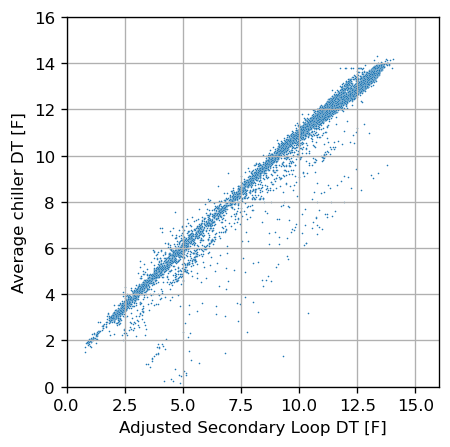

In [22]:
plt.figure(figsize=(4,4),dpi=120)

sns.scatterplot(data=HSC_data1,x='Adj CHW loop DT',y='DT_avg',s=1)
plt.xlim(0,16)
plt.ylim(0,16)
plt.xlabel('Adjusted Secondary Loop DT [F]')
plt.ylabel('Average chiller DT [F]');
plt.grid()

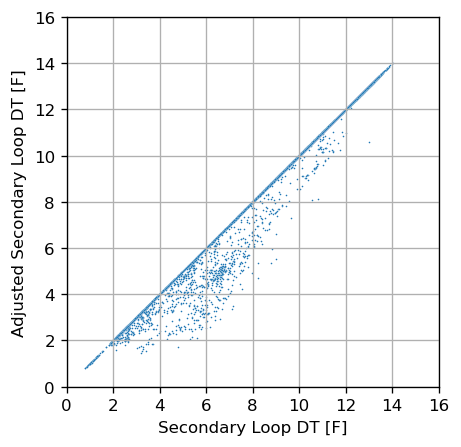

In [23]:
#Bypass flow-adjusted loop CHWRT vs unadjusted CHWRT
plt.figure(figsize=(4,4),dpi=120)

sns.scatterplot(data=HSC_data1,x='CHW loop DT',y='Adj CHW loop DT',s=1)
plt.xlim(0,16)
plt.ylim(0,16)
plt.xlabel('Secondary Loop DT [F]')
plt.ylabel('Adjusted Secondary Loop DT [F]');
plt.xticks(np.linspace(0,16,9))
plt.grid()

# Secondary LOOP CHWST Vs Average chiller CHWST

* The secondary loop CHWST does not vary linearly cleanly with the average chiller CHWST
* The loop CHWRT linearly varries with the average chiller CHWRT, as expected

* The problem is very likely on at least one of the CHWST sensors

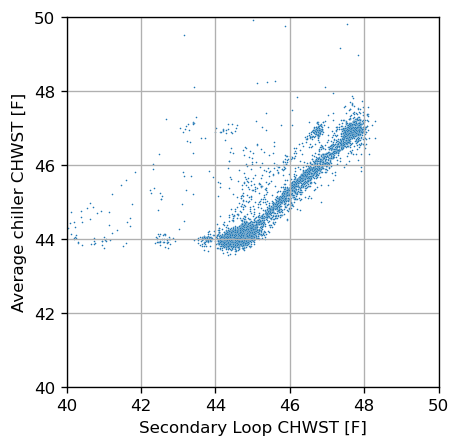

In [24]:
plt.figure(figsize=(4,4),dpi=120)

sns.scatterplot(data=HSC_data1,x='CHW loop Supply Temp',y='LCHWT_avg',s=1)
plt.xlim(40,50)
plt.ylim(40,50)
plt.xlabel('Secondary Loop CHWST [F]')
plt.ylabel('Average chiller CHWST [F]')
plt.grid();

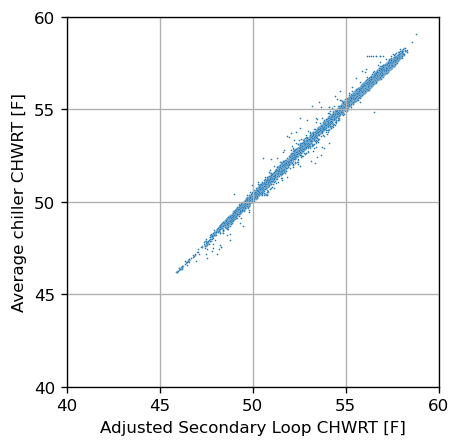

In [25]:
plt.figure(figsize=(4,4),dpi=120)

sns.scatterplot(data=HSC_data1,x='Adj Loop CHWRT',y='RCHWT_avg',s=1)
plt.xlim(40,60)
plt.ylim(40,60)
plt.xlabel('Adjusted Secondary Loop CHWRT [F]')
plt.ylabel('Average chiller CHWRT [F]')
plt.yticks(np.linspace(40,60,5));
plt.grid()

# Elimination of bad data based on CHWRT outliers

* Outliers = Data points with CHWRT values that are more than 3 SDs from the linear relation between the chiller and sec. loop CHWRT

In [26]:
from sklearn.linear_model import LinearRegression
linear_model = LinearRegression(fit_intercept=False)  #Linear model with zero intercept
linear_interc_model = LinearRegression(fit_intercept=True) #Linear model with constant intercept

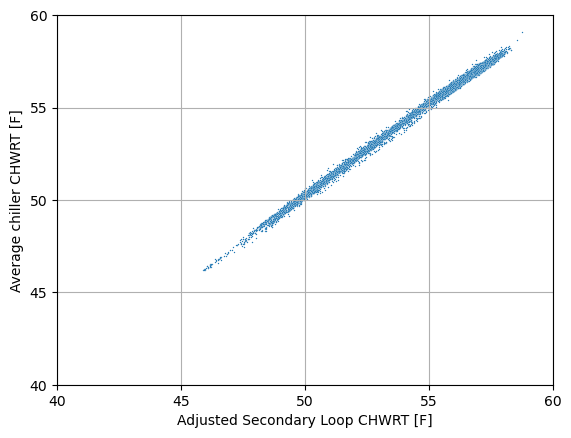

In [27]:
X = np.array(HSC_data1['Adj Loop CHWRT']).reshape(-1,1)
y = HSC_data1['RCHWT_avg']

linear_interc_model.fit(X,y)

#Residuals
HSC_data1['RCHWT_avg_pred'] = linear_interc_model.predict(X)
HSC_data1['RCHWT_residuals'] = HSC_data1['RCHWT_avg_pred'] - HSC_data1['RCHWT_avg']

outlier_threshold = 3
outliers = np.abs(HSC_data1['RCHWT_residuals']-
                  np.mean(HSC_data1['RCHWT_residuals'])) > outlier_threshold * np.std(HSC_data1['RCHWT_residuals'])

#New DataFrame without outlier points
new_data = HSC_data1[~outliers].copy()

sns.scatterplot(data=new_data,x='Adj Loop CHWRT',y='RCHWT_avg',s=1)
plt.xlim(40,60)
plt.ylim(40,60)
plt.xticks(np.linspace(40,60,5))
plt.yticks(np.linspace(40,60,5))
plt.xlabel('Adjusted Secondary Loop CHWRT [F]')
plt.ylabel('Average chiller CHWRT [F]');
plt.grid()

**Comparison of the individual chiller CHWST**

* The problem is with at least one of the CHWST sensors --> Either on individual chillers or secondary loop

**Before removing CHWST bad data**

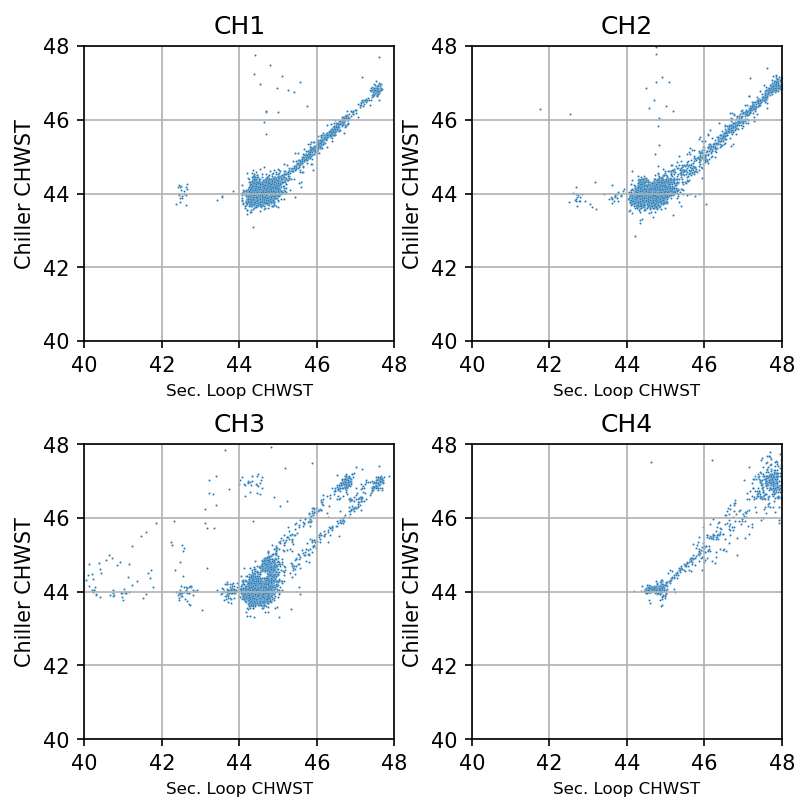

In [28]:
fig,ax = plt.subplots(2,2, figsize=(6,6),dpi=150)

for i in range(4):
    if i < 2:
        data = new_data[new_data['PLR{n}'.format(n=str(i+1))]>0]
        sns.scatterplot(data=data,x='CHW loop Supply Temp',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Sec. Loop CHWST',fontsize=8)
        ax[0][i].set_ylabel('Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(40,48)
        ax[0][i].set_xticks(np.linspace(40,48,5))
        ax[0][i].set_ylim(40,48)
        ax[0][i].set_yticks(np.linspace(40,48,5))
        ax[0][i].grid(visible=True,)
    else:
        data = new_data[new_data['PLR{n}'.format(n=str(i+1))]>0]
        sns.scatterplot(data=data,x='CHW loop Supply Temp',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Sec. Loop CHWST',fontsize=8)
        ax[1][i-2].set_ylabel('Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(40,48)
        ax[1][i-2].set_xticks(np.linspace(40,48,5))
        ax[1][i-2].set_ylim(40,48)
        ax[1][i-2].set_yticks(np.linspace(40,48,5))
        ax[1][i-2].grid(visible=True,)

fig.subplots_adjust(hspace=0.35,wspace=0.25)

**Remove CHWST >48 or <43**

In [29]:
#Remove CHWST >48.0 or <43.0

CH1 = new_data[['Time_range','CHLR_LCHWT1', 'CHLR_LCWT1', 'CHLR_RCHWT1', 'CHLR_RCWT1', 'CHW flow1',
                'CHWET1', 'CHWLT1', 'CW flow1', 'CWET1', 'CWLT1', 'ELE1', 'CHLR_ON1','PLR1', 'PLR_sec1',]]

CH2 = new_data[['Time_range','CHLR_LCHWT2', 'CHLR_LCWT2', 'CHLR_RCHWT2', 'CHLR_RCWT2', 'CHW flow2',
                'CHWET2', 'CHWLT2', 'CW flow2', 'CWET2', 'CWLT2', 'ELE2', 'CHLR_ON2','PLR2', 'PLR_sec2',]]

CH3 = new_data[['Time_range','CHLR_LCHWT3', 'CHLR_LCWT3', 'CHLR_RCHWT3', 'CHLR_RCWT3', 'CHW flow3',
                'CHWET3', 'CHWLT3', 'CW flow3', 'CWET3', 'CWLT3', 'ELE3', 'CHLR_ON3','PLR3', 'PLR_sec3',]]

CH4 = new_data[['Time_range', 'CHLR_LCHWT4', 'CHLR_LCWT4', 'CHLR_RCHWT4', 'CHLR_RCWT4', 'CHW flow4',
                'CHWET4', 'CHWLT4', 'CW flow4', 'CWET4', 'CWLT4', 'ELE4', 'CHLR_ON4','PLR4', 'PLR_sec4',]]

secondary = new_data[['Time_range', 'Day_of_week', 'Occupancy', 'month', 'Tdb', 'Twb','CHW Pump1', 
              'CHW Pump2', 'CHW Pump3','CHW Pump4', 'CT Fan1', 'CT Fan2', 'CT Fan3', 'CT Fan4',
              'CW Pump1','CW Pump2', 'CW Pump3', 'CW Pump4', 'CHW Bypass flow','CHW loop Return Temp',
              'CHW loop Supply Temp', 'CHW make up flow','CHW make up flow total', 'Secondary CHW flow',
              'sec_load','chillers_no', 'load_total', 'LCHWT_avg', 'RCHWT_avg', 'Adj Loop CHWRT','DT_avg',
              'CHW loop DT', 'Adj CHW loop DT', 'RCHWT_avg_pred','RCHWT_residuals']]

chiller_datasets = {'CH1':CH1,'CH2':CH2,'CH3':CH3,'CH4':CH4}

for i,chiller in enumerate(chiller_datasets):
    data = chiller_datasets[chiller][chiller_datasets[chiller]['PLR{n}'.format(n=str(i+1))]>0]
    outlier_CHWST = (abs(data['CHLR_LCHWT{n}'.format(n=str(i+1))]-45.5)>2.5)
    chiller_datasets[chiller] = data[~outlier_CHWST]
    print(len(chiller_datasets[chiller]))
    
#Combined the dfs back into one df
new_data2 = pd.merge(chiller_datasets['CH1'],chiller_datasets['CH2'],on='Time_range',how='outer')
new_data2 = pd.merge(new_data2,chiller_datasets['CH3'],on='Time_range',how='outer')
new_data2 = pd.merge(new_data2,chiller_datasets['CH4'],on='Time_range',how='outer')
new_data2 = pd.merge(new_data2,secondary,on='Time_range',how='outer')

#Replace NaNs with zeros
new_data2 = new_data2.fillna(value=0)

#Recompute the number of online chillers after eliminating bad CHWST
#new_data2['chillers_no'] = new_data2['CHLR_ON1']+new_data2['CHLR_ON2']+new_data2['CHLR_ON3']+new_data2['CHLR_ON4']

new_data2.info()

5395
5448
5009
1181
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8456 entries, 0 to 8455
Data columns (total 91 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8456 non-null   datetime64[ns]
 1   CHLR_LCHWT1             8456 non-null   float64       
 2   CHLR_LCWT1              8456 non-null   float64       
 3   CHLR_RCHWT1             8456 non-null   float64       
 4   CHLR_RCWT1              8456 non-null   float64       
 5   CHW flow1               8456 non-null   float64       
 6   CHWET1                  8456 non-null   float64       
 7   CHWLT1                  8456 non-null   float64       
 8   CW flow1                8456 non-null   float64       
 9   CWET1                   8456 non-null   float64       
 10  CWLT1                   8456 non-null   float64       
 11  ELE1                    8456 non-null   float64       
 12  CHLR_ON1                8456

**After removing bad CHWRT data**

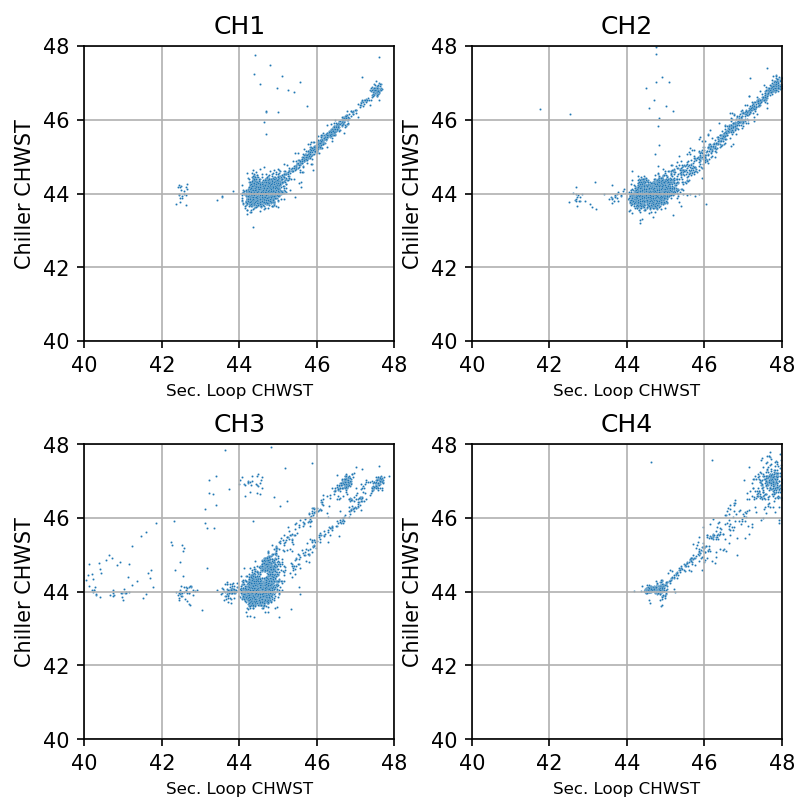

In [30]:
fig,ax = plt.subplots(2,2, figsize=(6,6),dpi=150)

for i in range(4):
    data = new_data2[new_data2['PLR{n}'.format(n=str(i+1))]>0]
    if i < 2:
        sns.scatterplot(data=data,x='CHW loop Supply Temp',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Sec. Loop CHWST',fontsize=8)
        ax[0][i].set_ylabel('Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(40,48)
        ax[0][i].set_xticks(np.linspace(40,48,5))
        ax[0][i].set_ylim(40,48)
        ax[0][i].set_yticks(np.linspace(40,48,5))
        ax[0][i].grid(visible=True,)
    else:
        sns.scatterplot(data=data,x='CHW loop Supply Temp',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Sec. Loop CHWST',fontsize=8)
        ax[1][i-2].set_ylabel('Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(40,48)
        ax[1][i-2].set_xticks(np.linspace(40,48,5))
        ax[1][i-2].set_ylim(40,48)
        ax[1][i-2].set_yticks(np.linspace(40,48,5))
        ax[1][i-2].grid(visible=True,)

fig.subplots_adjust(hspace=0.35,wspace=0.25)

**Distribution of Chiller CHWST: After removing <43 and >48**

Percentage of data more than 1F from 44F
10.361445783132531
11.417033773861968
9.622679177480535
36.07112616426757


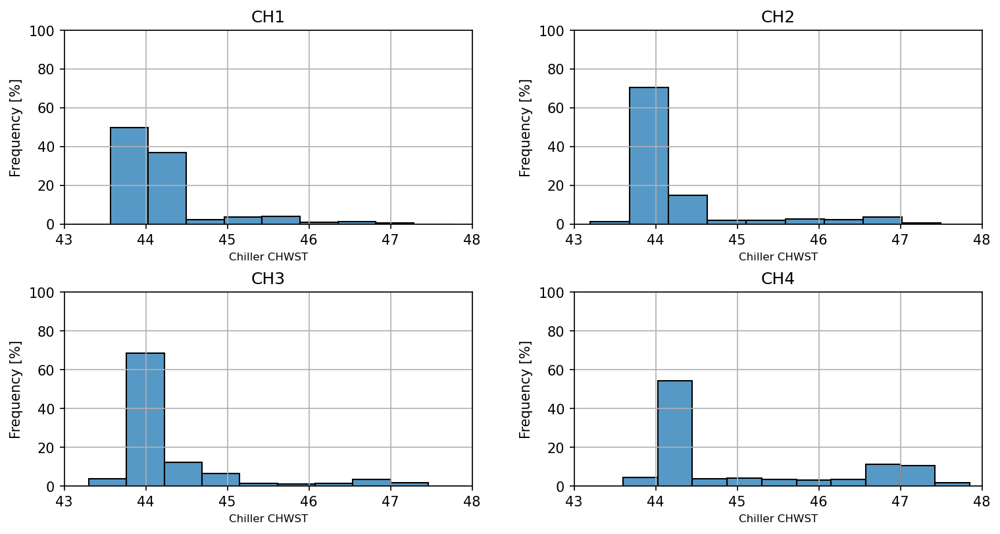

In [31]:
fig,ax = plt.subplots(2,2, figsize=(12,6),dpi=150)

print("Percentage of data more than 1F from 44F")
for i in range(4):
    data = new_data2[new_data2['PLR{n}'.format(n=str(i+1))]>0]
    if i < 2:
        sns.histplot(data=data,x='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],bins=10,stat='percent')
        ax[0][i].set_xlabel('Chiller CHWST',fontsize=8)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_ylabel('Frequency [%]',fontsize=10)
        ax[0][i].grid(visible=True,)
        ax[0][i].set_xlim(43,48)
        ax[0][i].set_ylim(0,100)
        print(len(data[abs(data['CHLR_LCHWT{n}'.format(n=str(i+1))])-44>1])/len(data)*100)
    else:
        sns.histplot(data=data,x='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],bins=10,stat='percent')
        ax[1][i-2].set_xlabel('Chiller CHWST',fontsize=8)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_ylabel('Frequency [%]',fontsize=10)
        ax[1][i-2].grid(visible=True,)
        ax[1][i-2].set_xlim(43,48)
        ax[1][i-2].set_ylim(0,100)
        print(len(data[abs(data['CHLR_LCHWT{n}'.format(n=str(i+1))])-44>1])/len(data)*100)

fig.subplots_adjust(hspace=0.35,wspace=0.25)

**Chiller CHWST versus Tdb: Is there a reset schedule?**

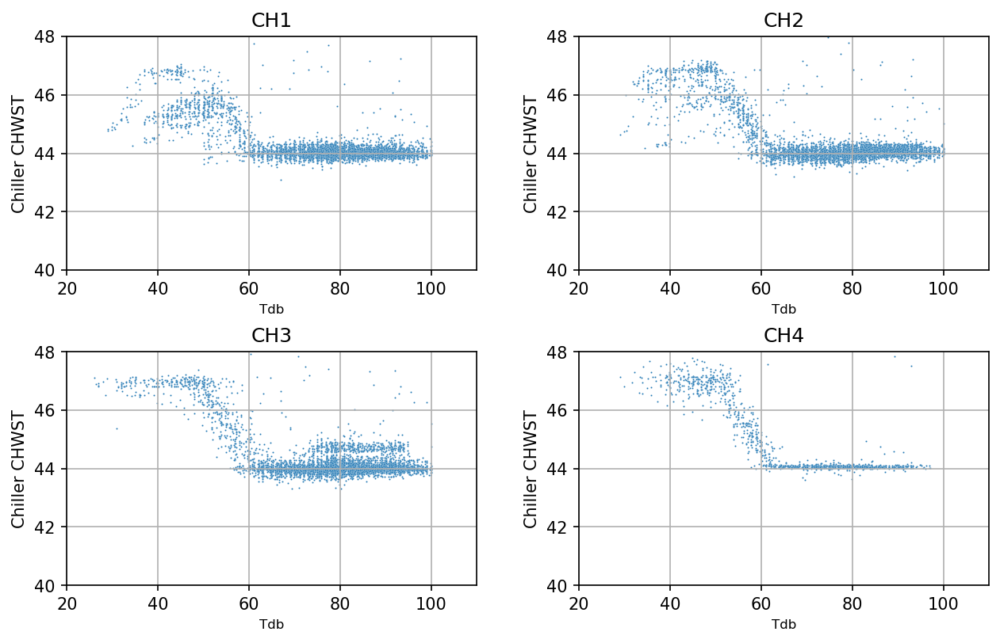

In [32]:
fig,ax = plt.subplots(2,2, figsize=(10,6),dpi=150)

for i in range(4):
    data = new_data2[new_data2['PLR{n}'.format(n=str(i+1))]>0]
    if i < 2:
        sns.scatterplot(data=data,x='Tdb',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Tdb',fontsize=8)
        ax[0][i].set_ylabel('Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(20,110)
        ax[0][i].set_ylim(40,48)
        ax[0][i].grid(visible=True,)
    else:
        sns.scatterplot(data=data,x='Tdb',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Tdb',fontsize=8)
        ax[1][i-2].set_ylabel('Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(20,110)
        ax[1][i-2].set_ylim(40,48)
        ax[1][i-2].grid(visible=True,)

fig.subplots_adjust(hspace=0.35,wspace=0.25)

**Average CHLR and Loop CHWST when CHLR_CHWST is close to 44F**

In [33]:
CHWST_dict = {'CHLR_CHWST':np.zeros(4),'Loop_CHWST':np.zeros(4)}
for i in range(4):
    data = new_data2[new_data2['PLR{n}'.format(n=str(i+1))]>0]
    CHLR_CHWST44 = data[(data['CHLR_LCHWT{n}'.format(n=str(i+1))]>=43.5) & (data['CHLR_LCHWT{n}'.format(n=str(i+1))]<=44.5)]
    Loop_CHWST44 = data[data.index.isin(CHLR_CHWST44.index)]

    CHLR_CHWST44_avg = np.mean(CHLR_CHWST44['CHLR_LCHWT{n}'.format(n=str(i+1))])
    CHWST_dict['CHLR_CHWST'][i] = CHLR_CHWST44_avg 
    
    Loop_CHWST44_avg = np.mean(CHLR_CHWST44['CHW loop Supply Temp'])
    CHWST_dict['Loop_CHWST'][i] = Loop_CHWST44_avg
    
CHWST_df = pd.DataFrame(CHWST_dict,index=['CH1','CH2','CH3','CH4'])
CHWST_df

,CHLR_CHWST,Loop_CHWST
CH1,44.024895,44.546934
CH2,44.018462,44.568912
CH3,44.012708,44.402284
CH4,44.073820,44.733599


**How does the difference between CHLR CHWST and Loop CHWST varry with CHLR CHWST?**

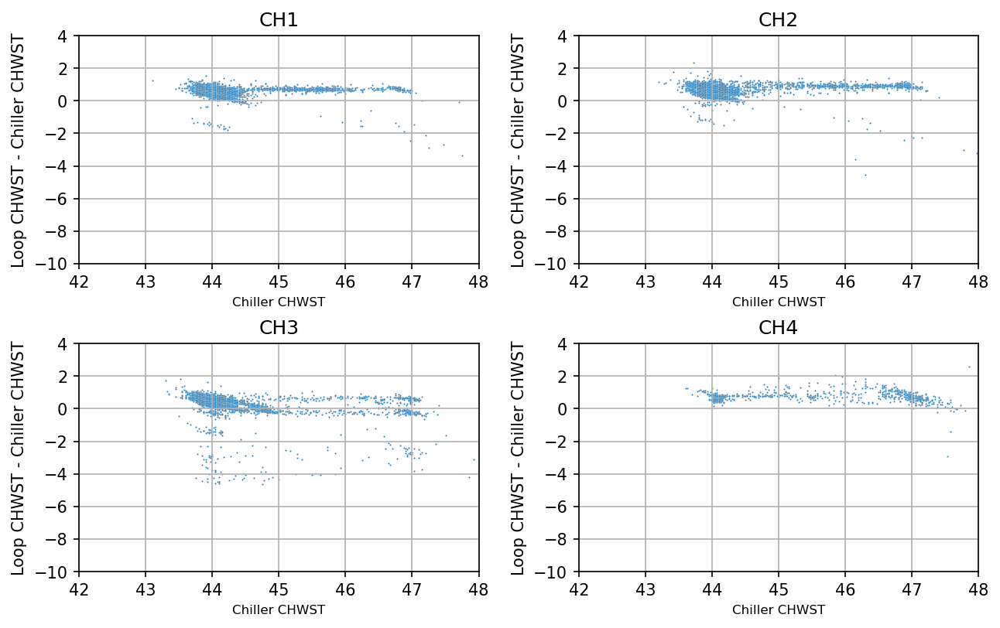

In [34]:
datasets = {'CH1':[],'CH2':[],'CH3':[],'CH4':[]}
for i,chiller in enumerate(datasets):
    datasets[chiller] = new_data2[new_data2['PLR{n}'.format(n=str(i+1))]>0]
    datasets[chiller]['CHWST_diff'] = datasets[chiller]['CHW loop Supply Temp'] - datasets[chiller]['CHLR_LCHWT{n}'.format(n=str(i+1))]

fig,ax = plt.subplots(2,2, figsize=(10,6),dpi=150)
#PLOTS
for i,chiller in enumerate(datasets):
    data = datasets[chiller]
    if i < 2:
        sns.scatterplot(data=data,y='CHWST_diff',x='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Chiller CHWST',fontsize=8)
        ax[0][i].set_ylabel('Loop CHWST - Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(42,48)
        ax[0][i].set_xticks([42,43,44,45,46,47,48])
        ax[0][i].set_ylim(-10,4)
        ax[0][i].grid(visible=True,)
    else:
        sns.scatterplot(data=data,y='CHWST_diff',x='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Chiller CHWST',fontsize=8)
        ax[1][i-2].set_ylabel('Loop CHWST - Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(42,48)
        ax[1][i-2].set_xticks([42,43,44,45,46,47,48])
        ax[1][i-2].set_ylim(-10,4)
        ax[1][i-2].grid(visible=True,)

fig.subplots_adjust(hspace=0.35,wspace=0.25)

**What is the average difference between primary loop and secondary loop CHWST at varrying values of chiller CHWST?**

In [35]:
CHLR_CHWST = np.arange(43.5,47.5,0.5)
CHWST_df = pd.DataFrame({'CHLR_CHWST':CHLR_CHWST,'CH1_Loop_CHWST':np.zeros(len(CHLR_CHWST)),
                        'CH2_Loop_CHWST':np.zeros(len(CHLR_CHWST)),'CH3_Loop_CHWST':np.zeros(len(CHLR_CHWST)),
                        'CH4_Loop_CHWST':np.zeros(len(CHLR_CHWST))})

data_no_df = pd.DataFrame({'CHLR_CHWST':CHLR_CHWST,'CH1':np.zeros(len(CHLR_CHWST)),'CH2':np.zeros(len(CHLR_CHWST)),
                           'CH3':np.zeros(len(CHLR_CHWST)),'CH4':np.zeros(len(CHLR_CHWST))})

for m in range(4):
    data_points = []
    Loop_CHWST_avgs = []
    data = new_data2[new_data2['PLR{n}'.format(n=str(m+1))]>0]
    for i in range(len(CHLR_CHWST)):
        pass
        CHLR_CHWST_data = data[(abs(data['CHLR_LCHWT{n}'.format(n=str(m+1))]-CHWST_df['CHLR_CHWST'][i])<0.5)]
        Loop_CHWST_data = data[data.index.isin(CHLR_CHWST_data.index)]
        Loop_CHWST_avgs.append(Loop_CHWST_data['CHW loop Supply Temp'].mean())
        data_points.append(len(CHLR_CHWST_data))

    CHWST_df['CH{n}_Loop_CHWST'.format(n=str(m+1))] = Loop_CHWST_avgs
    CHWST_df['CH1_diff'] = CHWST_df['CH1_Loop_CHWST'] - CHWST_df['CHLR_CHWST']
    CHWST_df['CH2_diff'] = CHWST_df['CH2_Loop_CHWST'] - CHWST_df['CHLR_CHWST']
    CHWST_df['CH3_diff'] = CHWST_df['CH3_Loop_CHWST'] - CHWST_df['CHLR_CHWST']
    CHWST_df['CH4_diff'] = CHWST_df['CH4_Loop_CHWST'] - CHWST_df['CHLR_CHWST'] 
    
    data_no_df['CH{n}'.format(n=str(m+1))] = data_points

print('Number of datapoints: Points counted as those within 0.5F of a CHLR_CHWST value')
print(data_no_df)
CHWST_df

Number of datapoints: Points counted as those within 0.5F of a CHLR_CHWST value
   CHLR_CHWST   CH1   CH2   CH3  CH4
0        43.5  1947  2081  1872   26
1        44.0  4687  4677  4025  696
2        44.5  2497  2412  2296  700
3        45.0   350   230   563  106
4        45.5   407   250   141   98
5        46.0   242   271   130   85
6        46.5   135   326   250  183
7        47.0    92   231   262  267


,CHLR_CHWST,CH1_Loop_CHWST,CH2_Loop_CHWST,CH3_Loop_CHWST,CH4_Loop_CHWST,CH1_diff,CH2_diff,CH3_diff,CH4_diff
0,43.5,44.487992,44.512656,44.391435,44.817654,0.987992,1.012656,0.891435,1.317654
1,44.0,44.546843,44.567819,44.403885,44.731586,0.546843,0.567819,0.403885,0.731586
2,44.5,44.636485,44.668999,44.465332,44.800050,0.136485,0.168999,-0.034668,0.300050
3,45.0,45.756329,45.810013,44.732790,45.880613,0.756329,0.810013,-0.267210,0.880613
4,45.5,46.174570,46.440580,45.349908,46.366827,0.674570,0.940580,-0.150092,0.866827
5,46.0,46.470157,46.823365,46.015777,46.885024,0.470157,0.823365,0.015777,0.885024
6,46.5,47.157304,47.425586,46.612844,47.568115,0.657304,0.925586,0.112844,1.068115
7,47.0,47.279576,47.673610,46.708538,47.698903,0.279576,0.673610,-0.291462,0.698903


**Plots**

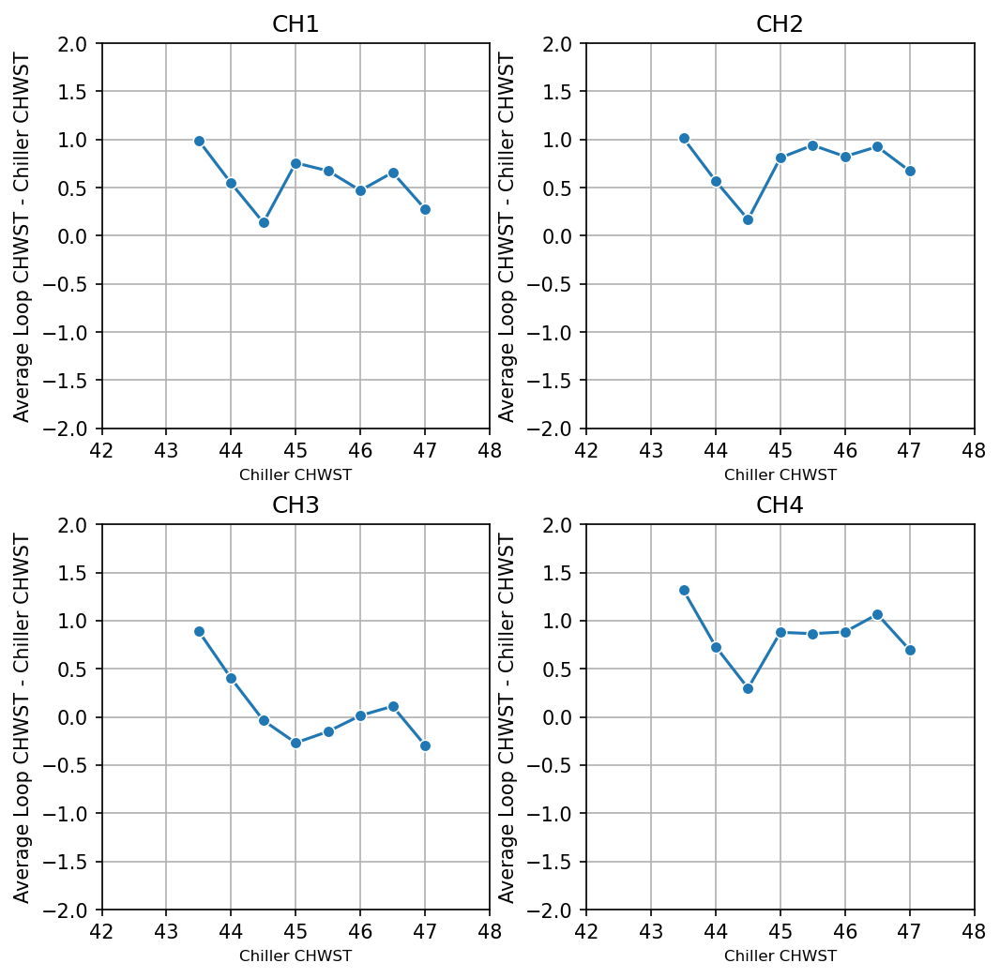

In [36]:
fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)
for i in range(4):
    if i < 2:
        sns.lineplot(data=CHWST_df,y='CH{n}_diff'.format(n=str(i+1)),x='CHLR_CHWST',ax=ax[0][i],marker='o')
        ax[0][i].set_xlabel('Chiller CHWST',fontsize=8)
        ax[0][i].set_ylabel('Average Loop CHWST - Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(42,48)
        ax[0][i].set_xticks([42,43,44,45,46,47,48])
        ax[0][i].set_ylim(-2,2)
        ax[0][i].grid(visible=True,)
    else:
        sns.lineplot(data=CHWST_df,y='CH{n}_diff'.format(n=str(i+1)),x='CHLR_CHWST',ax=ax[1][i-2],marker='o')
        ax[1][i-2].set_xlabel('Chiller CHWST',fontsize=8)
        ax[1][i-2].set_ylabel('Average Loop CHWST - Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(42,48)
        ax[1][i-2].set_xticks([42,43,44,45,46,47,48])
        ax[1][i-2].set_ylim(-2,2)
        ax[1][i-2].grid(visible=True,)

fig.subplots_adjust(hspace=0.25,wspace=0.25)

In [37]:
new_data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8456 entries, 0 to 8455
Data columns (total 91 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              8456 non-null   datetime64[ns]
 1   CHLR_LCHWT1             8456 non-null   float64       
 2   CHLR_LCWT1              8456 non-null   float64       
 3   CHLR_RCHWT1             8456 non-null   float64       
 4   CHLR_RCWT1              8456 non-null   float64       
 5   CHW flow1               8456 non-null   float64       
 6   CHWET1                  8456 non-null   float64       
 7   CHWLT1                  8456 non-null   float64       
 8   CW flow1                8456 non-null   float64       
 9   CWET1                   8456 non-null   float64       
 10  CWLT1                   8456 non-null   float64       
 11  ELE1                    8456 non-null   float64       
 12  CHLR_ON1                8456 non-null   float64 

**Difference  between chiller average CHWST and loop CHWST versus time**

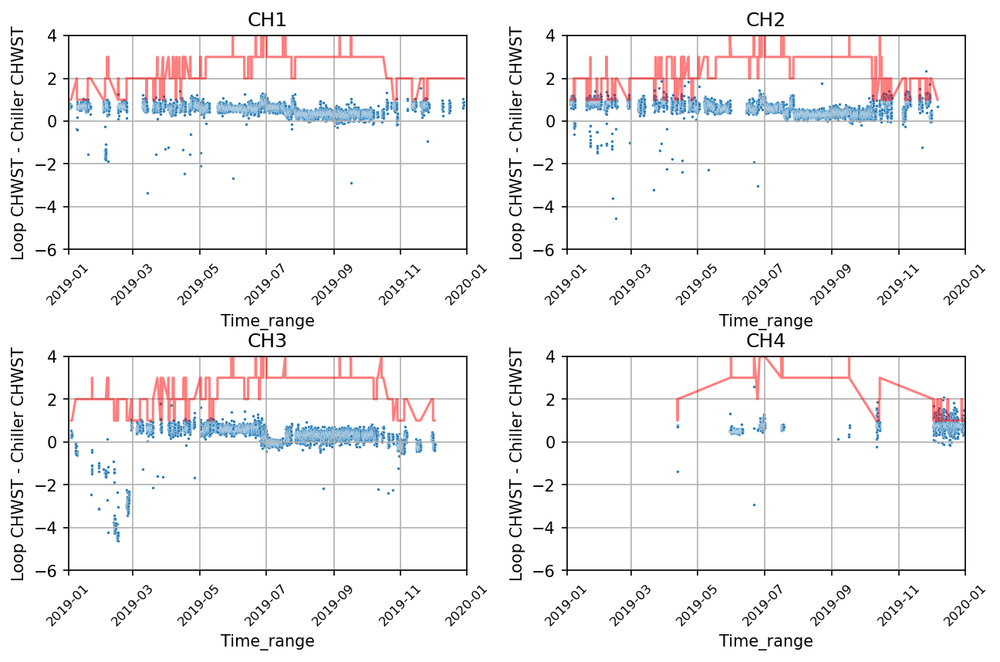

In [38]:
fig,ax = plt.subplots(2,2, figsize=(10,6),dpi=150)
#PLOTS
for i,chiller in enumerate(datasets):
    data = datasets[chiller]
    if i < 2:
        sns.scatterplot(data=data,y='CHWST_diff',x='Time_range',ax=ax[0][i],s=3)
        sns.lineplot(data=data,y='chillers_no',x='Time_range',ax=ax[0][i],color='red',alpha=0.5)
        ax[0][i].set_ylabel('Loop CHWST - Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(datetime(2019,1,1),datetime(2020,1,1))
        ax[0][i].set_ylim(-6,4)
        ax[0][i].grid(visible=True,)
        ax[0][i].tick_params(axis='x', rotation=45, labelsize=8)
    else:
        sns.scatterplot(data=data,y='CHWST_diff',x='Time_range',ax=ax[1][i-2],s=3)
        sns.lineplot(data=data,y='chillers_no',x='Time_range',ax=ax[1][i-2],color='red',alpha=0.5)
        ax[1][i-2].set_ylabel('Loop CHWST - Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(datetime(2019,1,1),datetime(2020,1,1))
        ax[1][i-2].set_ylim(-6,4)
        ax[1][i-2].grid(visible=True,)
        ax[1][i-2].tick_params(axis='x', rotation=45, labelsize=8)

fig.subplots_adjust(hspace=0.5,wspace=0.25)

**Difference between chiller average DT and loop DT with time**

* Check the back-and-forth change in DT difference

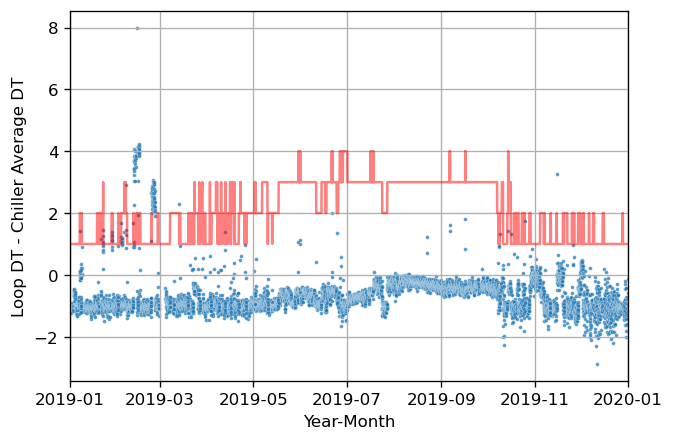

In [39]:
plt.figure(figsize=(6,4),dpi=120)
new_data2['DT_diff'] = new_data2['Adj CHW loop DT'] - new_data2['DT_avg']
sns.scatterplot(data=new_data2,y='DT_diff',x='Time_range',s=5,alpha=0.75)
sns.lineplot(data=new_data2,y='chillers_no',x='Time_range',color='red',alpha=0.5)
plt.ylabel('Loop DT - Chiller Average DT',fontsize=10)
plt.xlabel('Year-Month',fontsize=10)
plt.xlim(datetime(2019,1,1),datetime(2020,1,1))
#plt.ylim(-2,2)
plt.grid(visible=True,)
#plt.tick_params(axis='x', rotation=45, labelsize=8)

# ax2 = plt.twinx()
# sns.scatterplot(data=new_data,x='Time_range',y='Tdb',ax=ax2,color='green',s=2,alpha=0.5)

**Is the difference between chiller DT and Loop DT Tdb-dependent?**

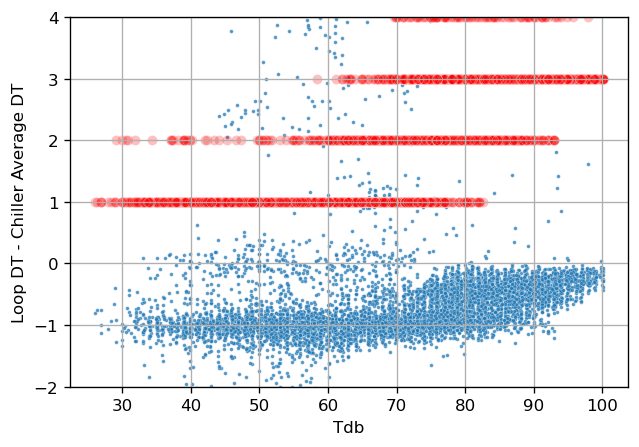

In [40]:
plt.figure(figsize=(6,4),dpi=120)
new_data2['DT_diff'] = new_data2['Adj CHW loop DT'] - new_data2['DT_avg']
sns.scatterplot(data=new_data2,y='DT_diff',x='Tdb',s=5,alpha=0.75)
sns.scatterplot(data=new_data2,y='chillers_no',x='Tdb',color='red',alpha=0.25)
plt.ylabel('Loop DT - Chiller Average DT',fontsize=10)
plt.xlabel('Tdb',fontsize=10)
plt.ylim(-2,4)
plt.grid(visible=True,)
#plt.tick_params(axis='x', rotation=45, labelsize=8)

**What features are mainly affecting the DT difference?**

* Tdb and no. of operating chiller nos have the biggest corr()

In [41]:
#Include the time of day and day of the week as new features
#day of week
new_data2['day_of_week'] = new_data2['Time_range'].dt.dayofweek

#time of day
new_data2['time_of_day'] = new_data2['Time_range'].dt.hour

new_data2[['Time_range','day_of_week','time_of_day']]

,Time_range,day_of_week,time_of_day
0,2019-01-01 00:00:00,1,0
1,2019-01-01 01:00:00,1,1
2,2019-01-01 02:00:00,1,2
3,2019-01-01 03:00:00,1,3
4,2019-01-01 04:00:00,1,4
...,...,...,...
8451,2019-12-31 23:00:00,1,23
8452,2019-02-13 14:00:00,2,14
8453,2019-03-13 15:00:00,2,15
8454,2019-10-25 11:00:00,4,11


<Axes: >

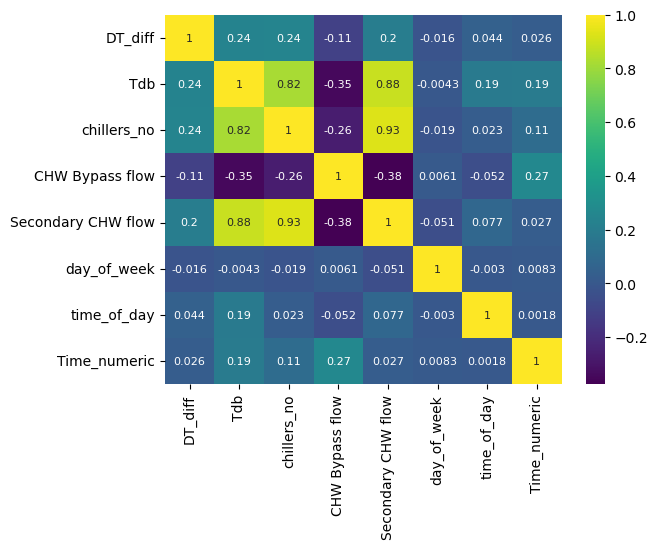

In [42]:
cleaning_data = new_data2[['DT_diff','Time_range','Tdb','chillers_no','CHW Bypass flow','Secondary CHW flow',
                 'day_of_week','time_of_day']]
cleaning_data['Time_numeric']  = cleaning_data['Time_range'].astype('int64') /10**9/(60*60*24)  # Converts into days after Unix epoch (01/01/1970)

sns.heatmap(cleaning_data.drop('Time_range',axis=1).corr(),cmap="viridis",annot=True,annot_kws={"fontsize":8})

# Eliminate bad DT values with a DT_diff vs Tdb model & Time of year!

**Function to run and evaluate different models**

In [43]:
def run_test_model(data,model,X,X_train,y_train,X_test,y_test):
    
    # Fit Model
    if X.ndim == 1:
        X = X.values.reshape(-1,1)
        X_train = X_train.values.reshape(-1,1)     #Reshaped if the model uses one feature
        X_test = X_test.values.reshape(-1,1)
    else:
        pass 
    model.fit(X_train,y_train)
    
    # Get Metrics
    preds_train = model.predict(X_train)
    preds_test = model.predict(X_test)
    
    rmse_test = np.sqrt(mean_squared_error(y_test,preds_test))
    #CV_test = rmse_test*100/np.mean(y_test)
    print(f'RMSE_test : {rmse_test}')
    #print(f'CV[%] : {CV_test}')
    
    model_preds = model.predict(X)
    #PLOTS
    fig,ax = plt.subplots(1,2, figsize=(8,3),dpi=150)
    sns.scatterplot(x='Tdb',y='DT_diff',data=data,color='black',s=8,ax=ax[0])
    sns.scatterplot(data=data,x='Tdb',y=model_preds,color='red',s=5,ax=ax[0])
    ax[0].set_xlim(20,100)
    ax[0].set_xticks(np.linspace(20,100,5))
    
    data['Time'] = pd.to_datetime(data['Time_numeric']*10**9*(60*60*24))
    sns.scatterplot(x='Time',y='DT_diff',data=data,color='black',s=8,ax=ax[1])
    sns.scatterplot(data=data,x='Time',y=model_preds,color='red',s=5,ax=ax[1])
    ax[1].set_xlim(datetime(2019,1,1),datetime(2020,1,1))
    ax[1].tick_params(axis='x', rotation=45, labelsize=8)

In [44]:
cleaning_data['time_of_day'].describe()

count    8456.000000
mean       11.522706
std         6.932910
min         0.000000
25%         5.000000
50%        12.000000
75%        18.000000
max        23.000000
Name: time_of_day, dtype: float64

**Data to be used for model testing**

In [45]:
cleaning_data = cleaning_data[['DT_diff','Tdb','chillers_no','CHW Bypass flow', 'Secondary CHW flow',
                               'Time_numeric','day_of_week','time_of_day']]
                                     #DT_diff is observed to be mainly affected by the time of the year and Tdb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score

**1. Simple linear regression model**

RMSE_test : 0.5709762099385507


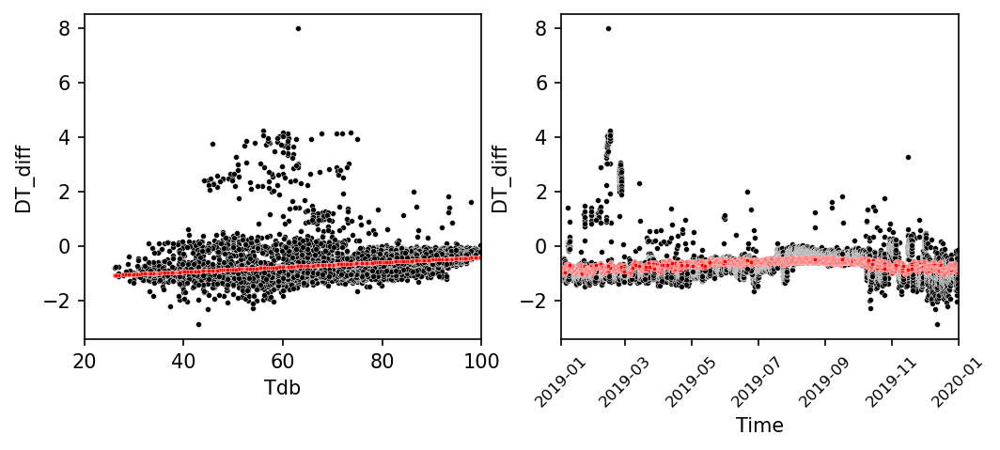

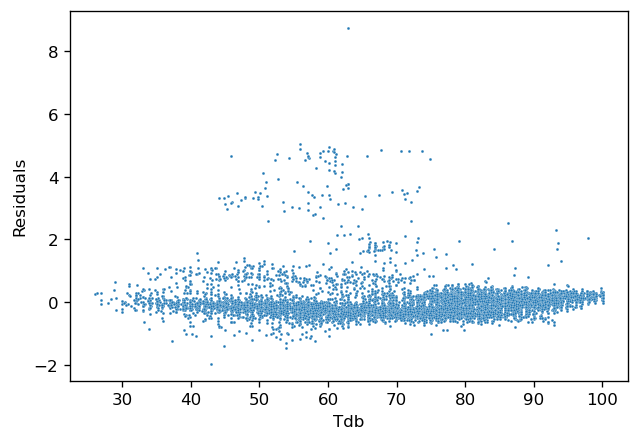

In [46]:
X = cleaning_data['Tdb']
y = cleaning_data['DT_diff']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

from sklearn.linear_model import LinearRegression
SLR_model = LinearRegression()

run_test_model(cleaning_data,SLR_model,X,X_train, y_train, X_test, y_test)

#Residual plot
slr_preds = SLR_model.predict(X.values.reshape(-1,1))
slr_residuals = cleaning_data['DT_diff'] - slr_preds

plt.figure(figsize=(6,4),dpi=120)
sns.scatterplot(cleaning_data['Tdb'],slr_residuals,s=3)
plt.ylabel('Residuals');

**2.1 KNN Regression model: Features = Tdb & Time of year**

* Check outliers vs change in number of chillers within neighboring hours

RMSE_test : 0.462290991810939
RMSE_test : 0.4237126293387769
RMSE_test : 0.42932981476633636
RMSE_test : 0.43585094436746163
RMSE_test : 0.439404572160109
RMSE_test : 0.4406374070173773
RMSE_test : 0.4417981212625061
RMSE_test : 0.45208414384075285
RMSE_test : 0.4766439474499261
RMSE_test : 0.49205613189991776
RMSE_test : 0.5132557629923651


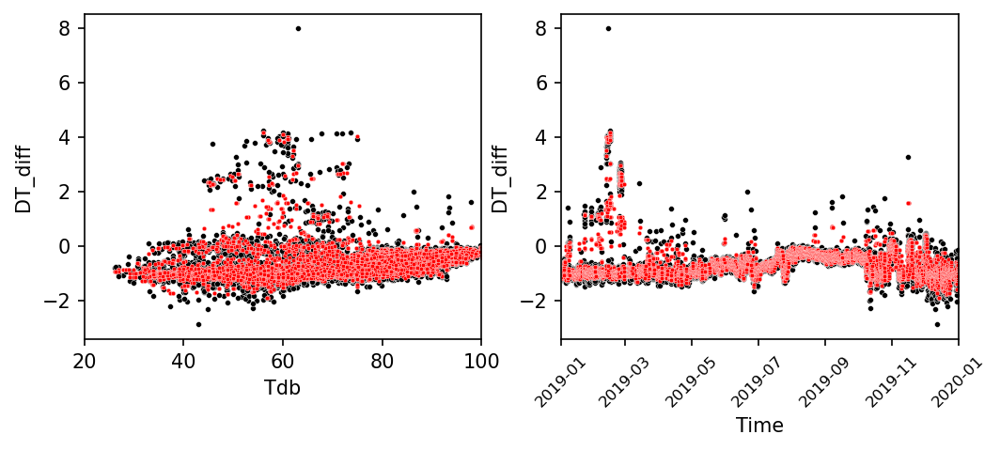

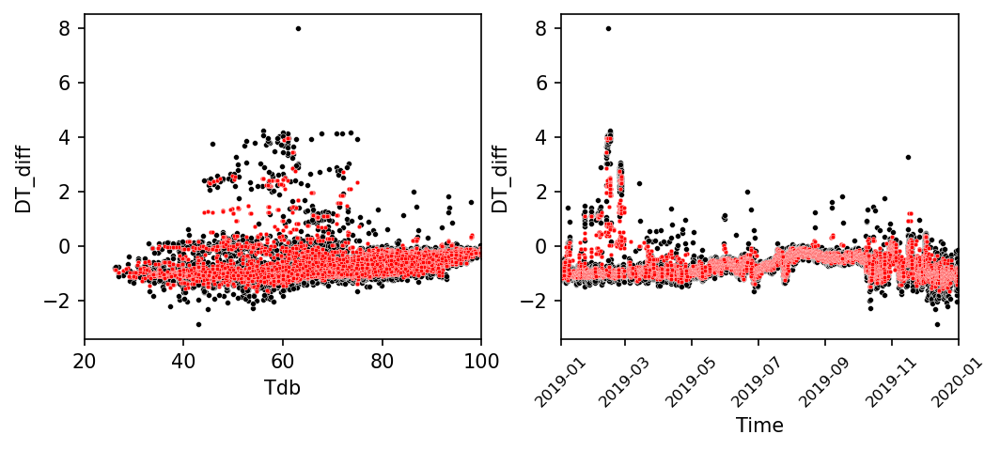

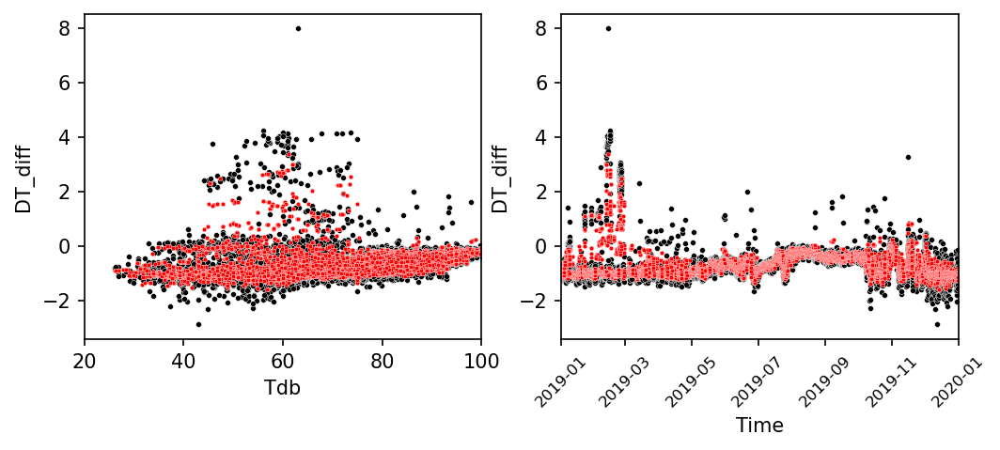

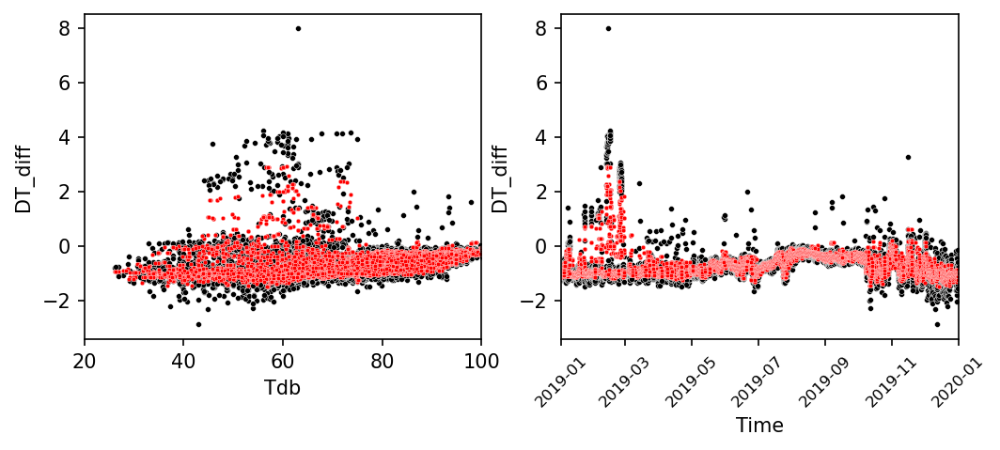

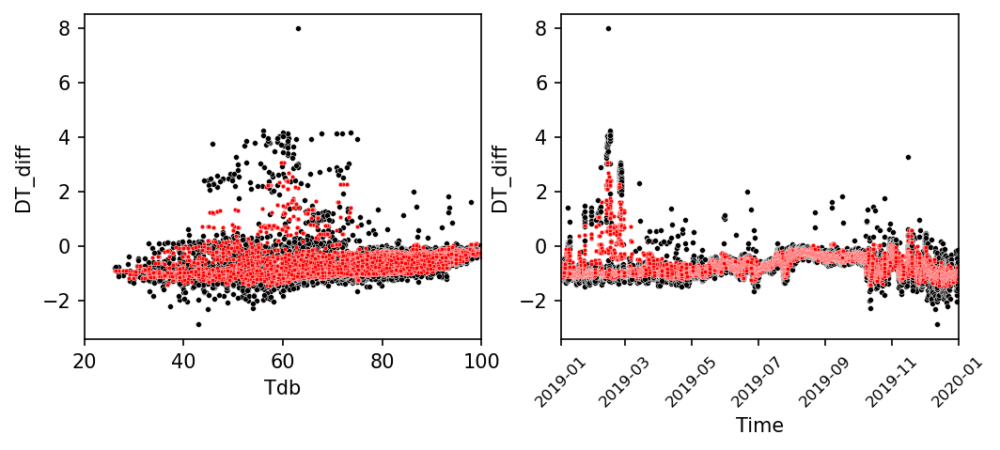

...

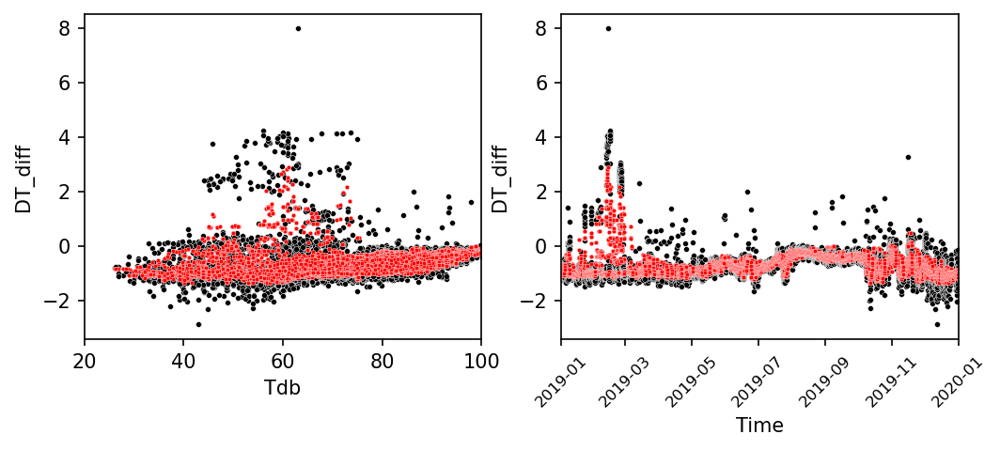

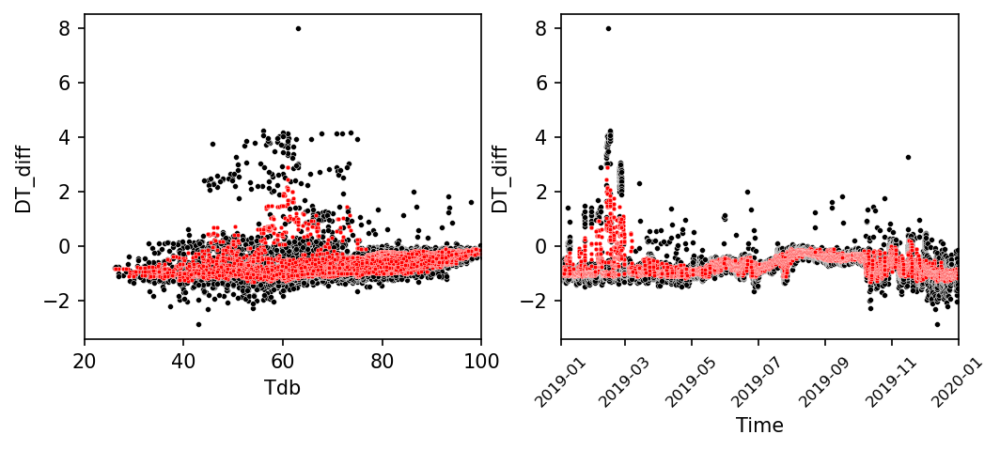

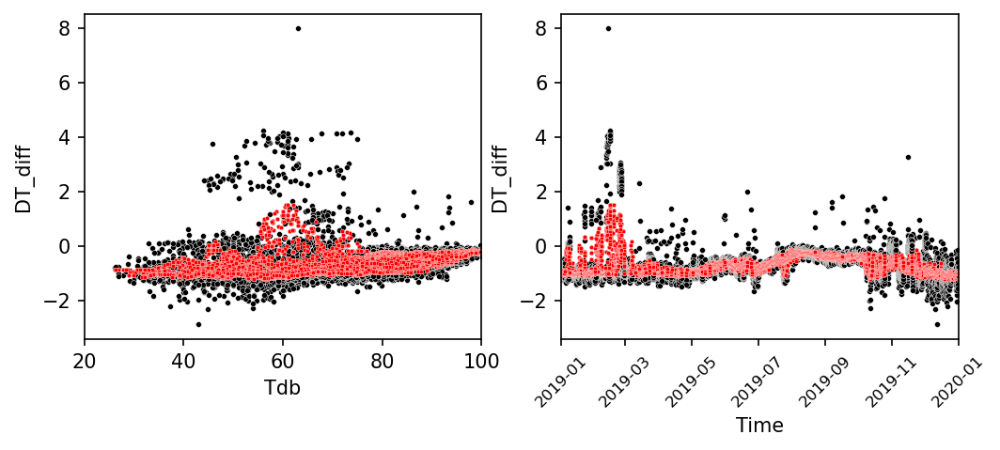

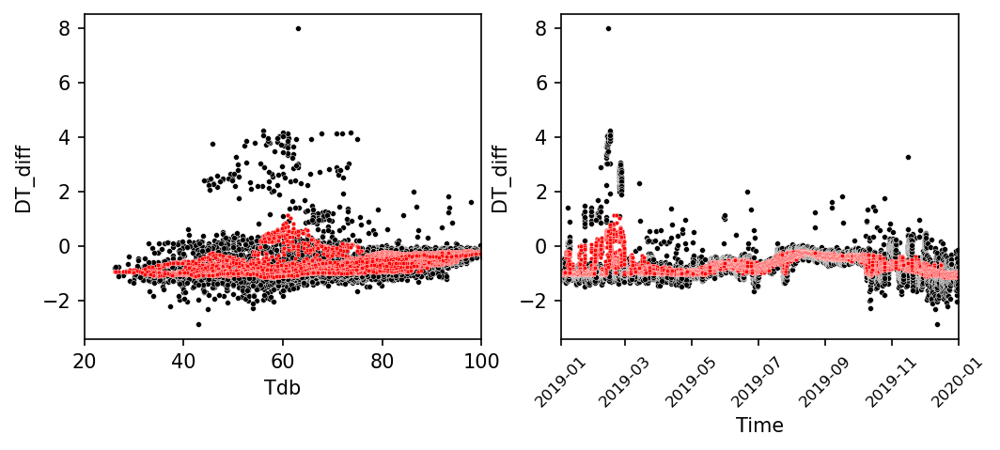

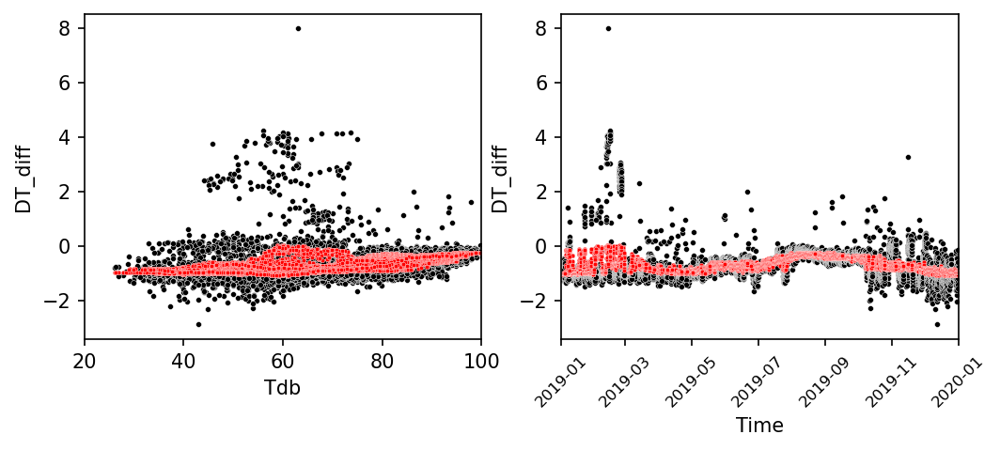

In [47]:
from sklearn.neighbors import KNeighborsRegressor

X = cleaning_data[['Tdb','Time_numeric']]
y = cleaning_data['DT_diff']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)
scaled_X = scaler.transform(X)

k_values = [2,3,4,5,6,7,8,12,24,48,168]    #To test different K values
for n in k_values:
    knn_model = KNeighborsRegressor(n_neighbors=n)
    run_test_model(cleaning_data,knn_model,scaled_X,scaled_X_train,y_train,scaled_X_test,y_test)

**knn model residuals: Features = Tdb & Time of year**

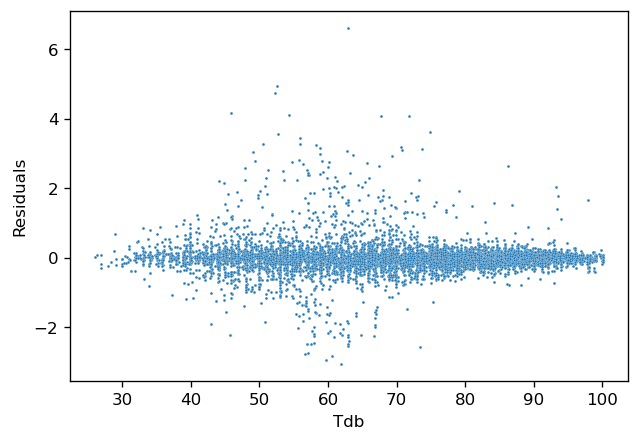

In [48]:
#Residuals for the best k value
knn_model_best = KNeighborsRegressor(n_neighbors=8)
knn_model_best.fit(scaled_X_train,y_train)

knn_preds = knn_model_best.predict(scaled_X)
knn_2D_residuals = cleaning_data['DT_diff'] - knn_preds

plt.figure(figsize=(6,4),dpi=120)
sns.scatterplot(cleaning_data['Tdb'],knn_2D_residuals,s=3)
plt.ylabel('Residuals');

**2.2 KNN Regression model: Features = Tdb only**

RMSE_test : 0.6966616364952672
RMSE_test : 0.6539588669689934
RMSE_test : 0.6279931770062415
RMSE_test : 0.6113910844838912
RMSE_test : 0.6006386951205996
RMSE_test : 0.596671073088994
RMSE_test : 0.5905806604301566
RMSE_test : 0.5811333677236903
RMSE_test : 0.5762101380856525
RMSE_test : 0.5736628516910451
RMSE_test : 0.5670390005749447
RMSE_test : 0.5681500777425414


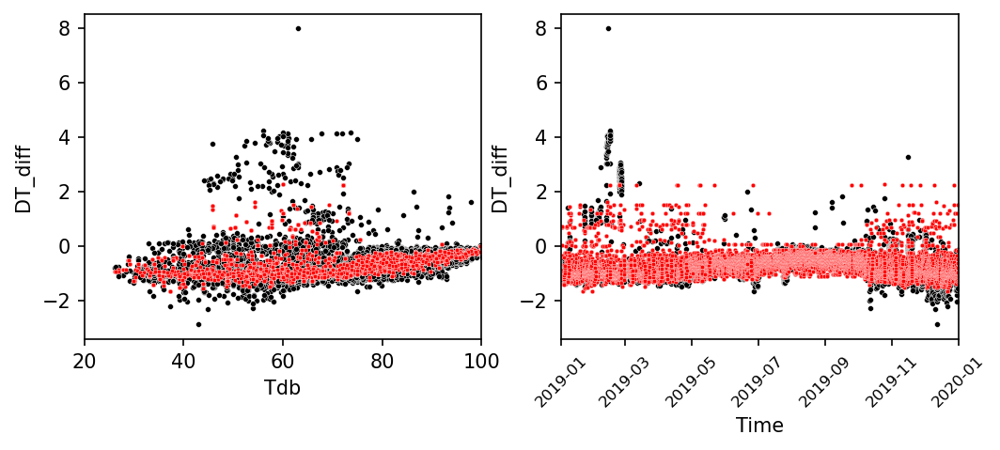

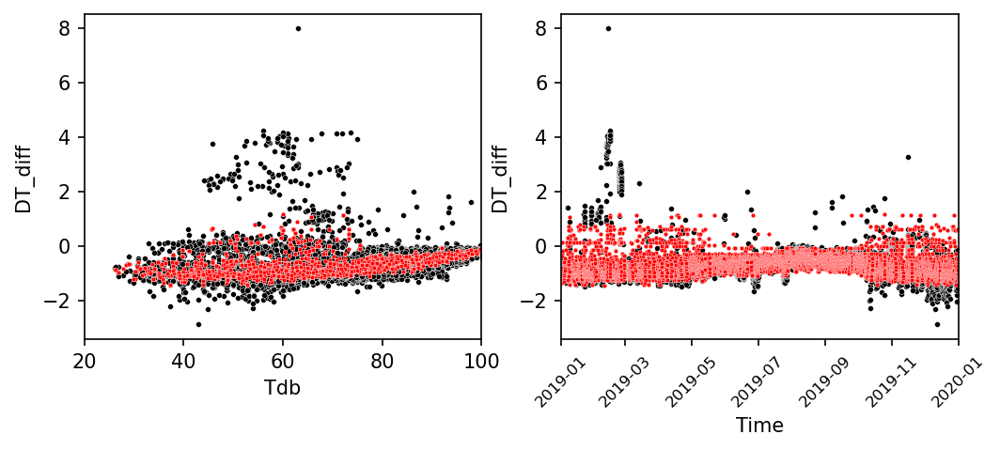

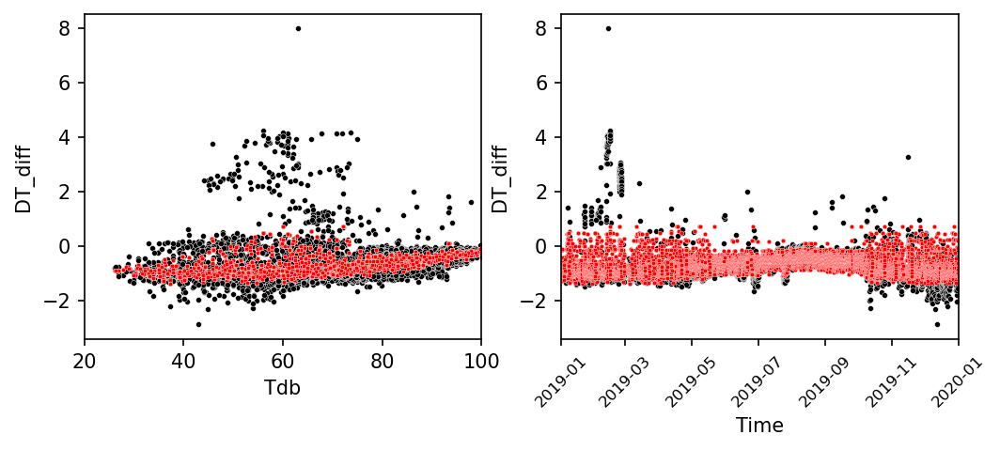

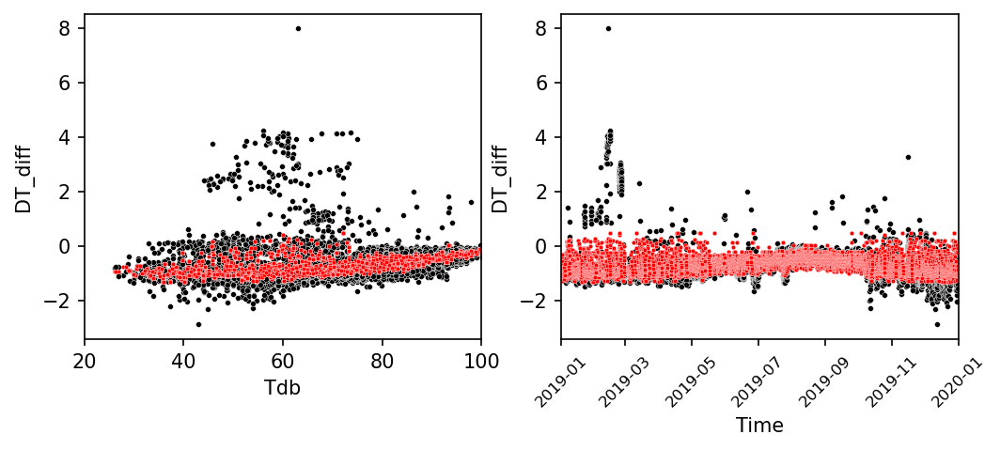

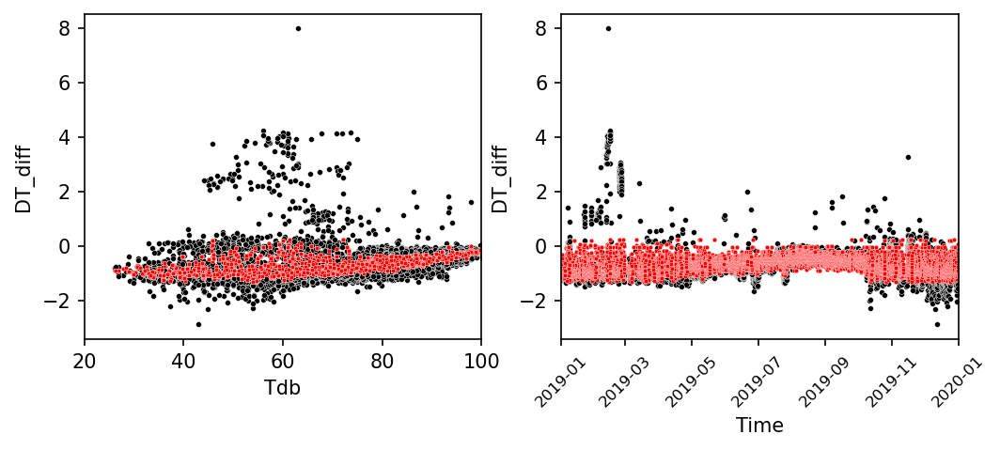

...

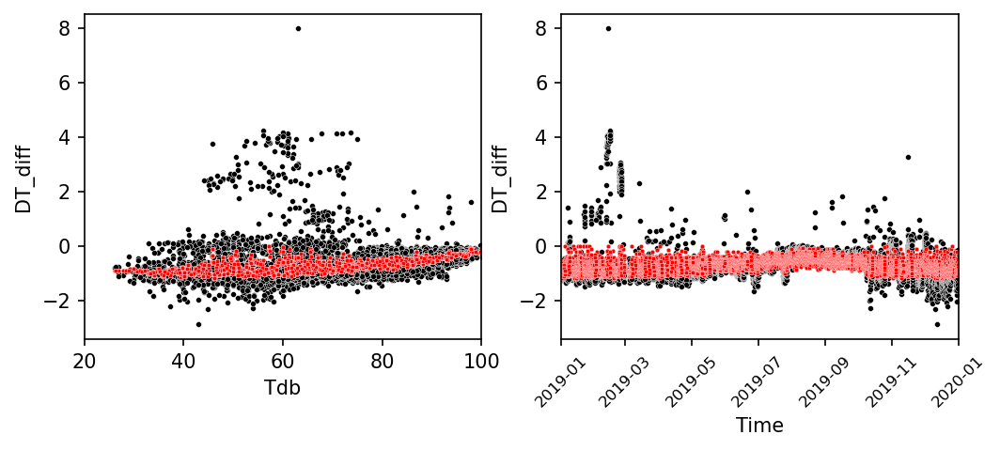

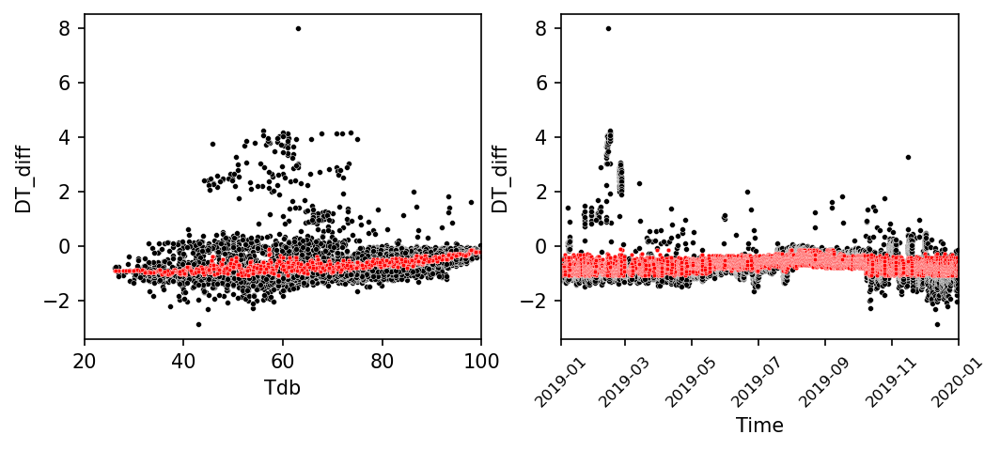

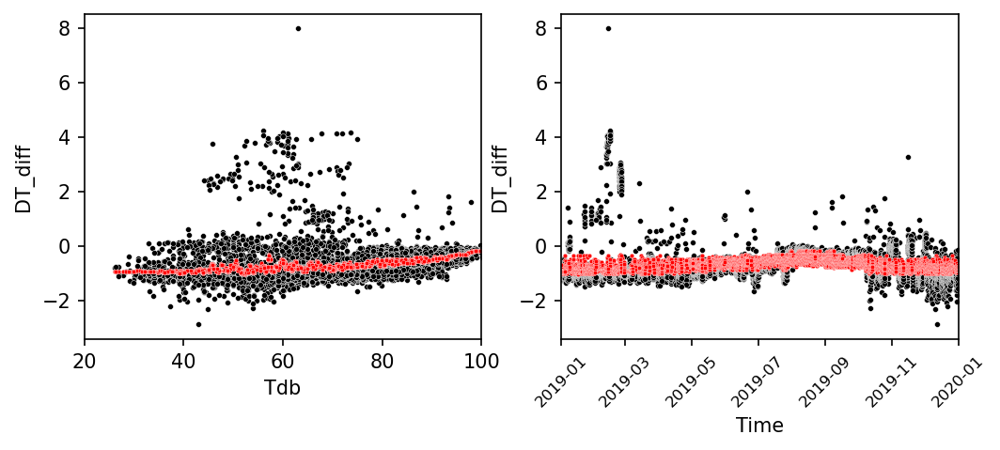

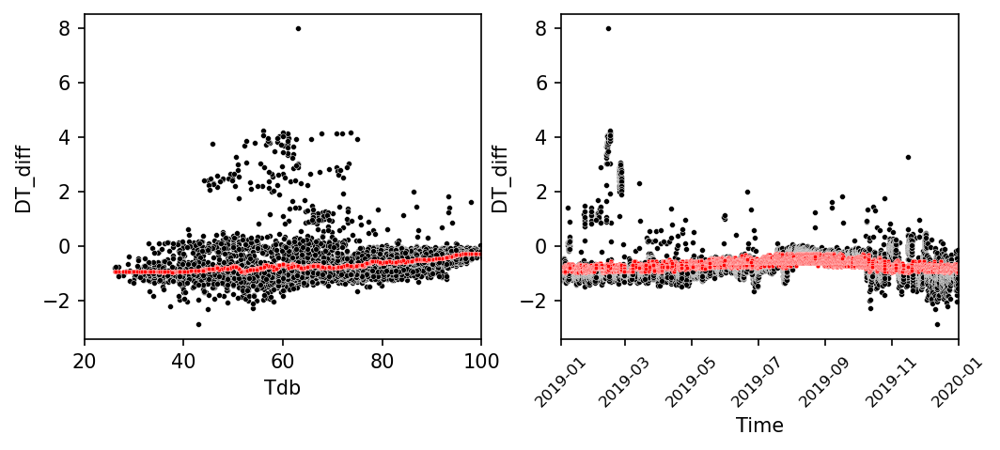

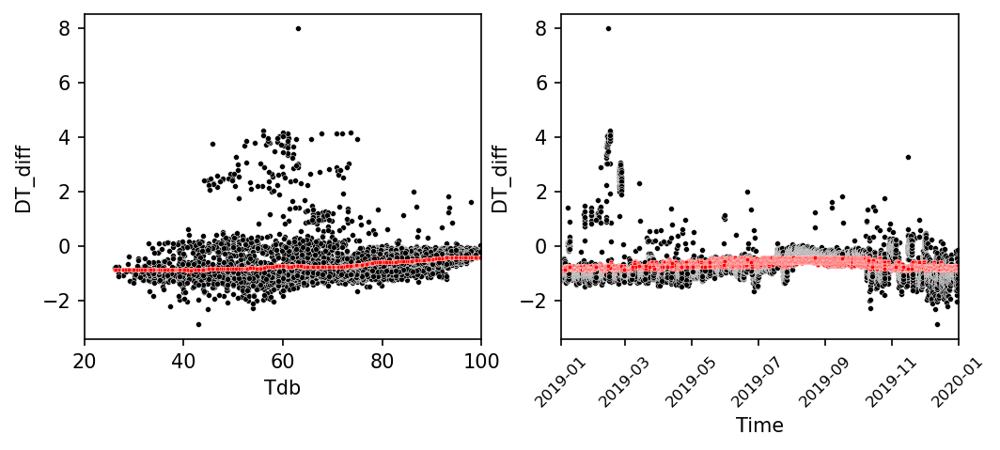

In [49]:
X = cleaning_data['Tdb']
y = cleaning_data['DT_diff']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

scaler = StandardScaler()

scaled_X_train = scaler.fit_transform(X_train.values.reshape(-1,1))
scaled_X_test = scaler.transform(X_test.values.reshape(-1,1))
scaled_X = scaler.transform(X.values.reshape(-1,1))

k_values = [2,3,4,5,6,7,8,12,24,48,168,720]    #To test different K values
for n in k_values:
    knn_model = KNeighborsRegressor(n_neighbors=n)
    run_test_model(cleaning_data,knn_model,scaled_X,scaled_X_train,y_train,scaled_X_test,y_test)

**KNN model with Features = Tdb only**

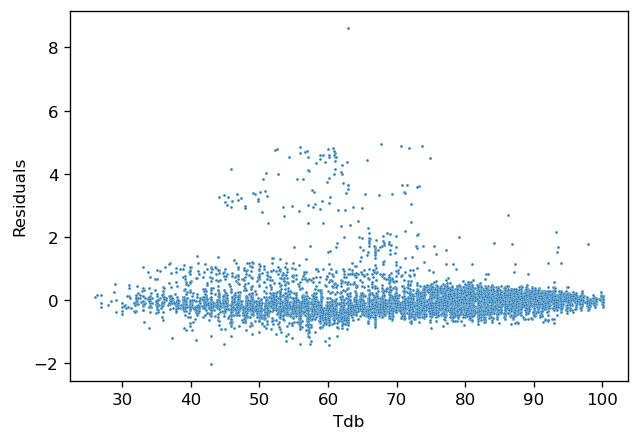

In [50]:
#Residuals for the best k value
knn_1D_best = KNeighborsRegressor(n_neighbors=24)
knn_1D_best.fit(scaled_X_train,y_train)

knn_1D_preds = knn_1D_best.predict(scaled_X)
knn_1D_residuals = cleaning_data['DT_diff'] - knn_1D_preds

plt.figure(figsize=(6,4),dpi=120)
sns.scatterplot(cleaning_data['Tdb'],knn_1D_residuals,s=3)
plt.ylabel('Residuals');

**2.3 KNN with all selected features**

RMSE_test : 0.4102969718883515
RMSE_test : 0.4350516179887767
RMSE_test : 0.4426927132104025
RMSE_test : 0.45119566529317706
RMSE_test : 0.46028304709950585
RMSE_test : 0.46992599375209626
RMSE_test : 0.47404632669599417
RMSE_test : 0.4842472546314761
RMSE_test : 0.5112296278474205
RMSE_test : 0.5288287452611968
RMSE_test : 0.5467761848800639


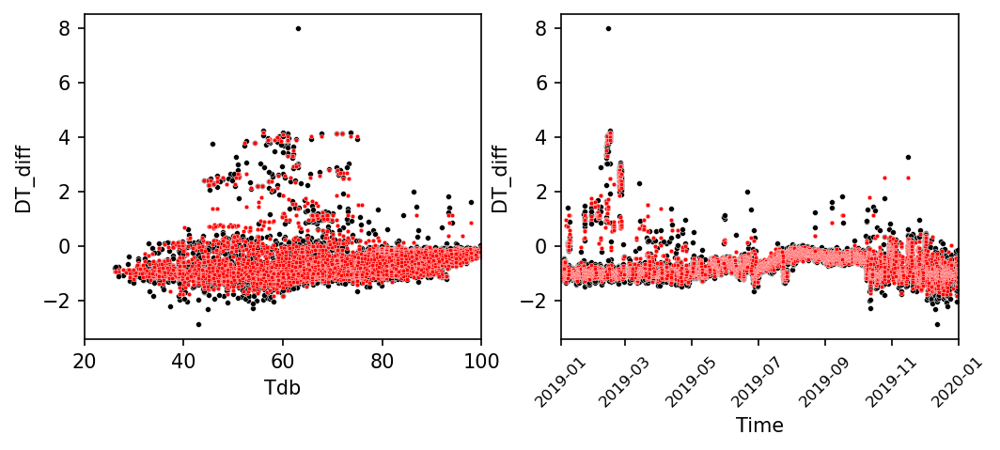

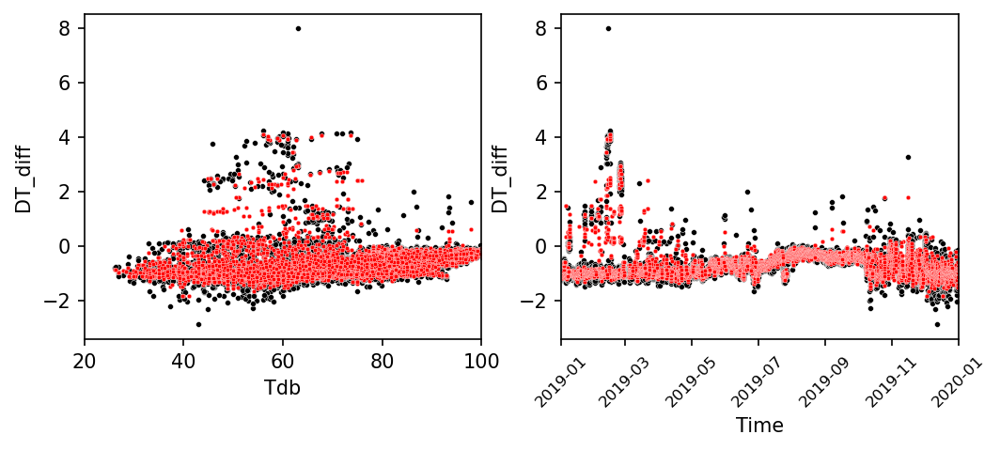

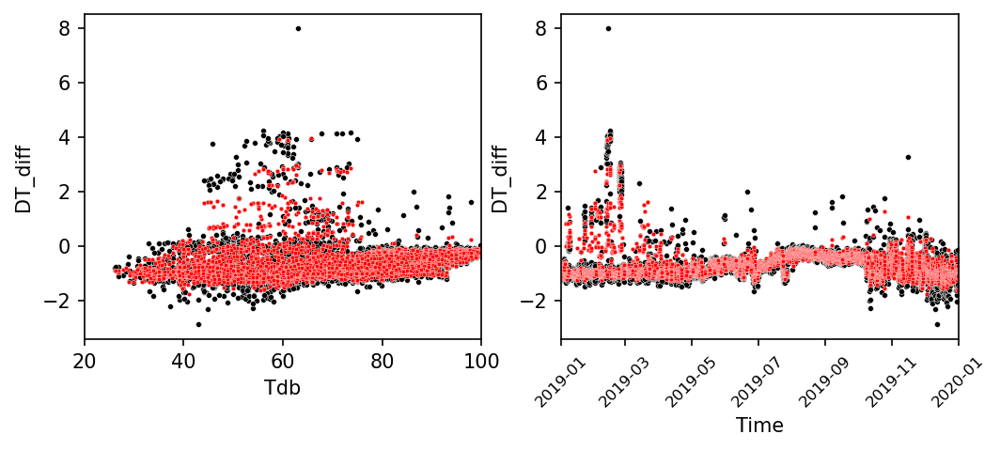

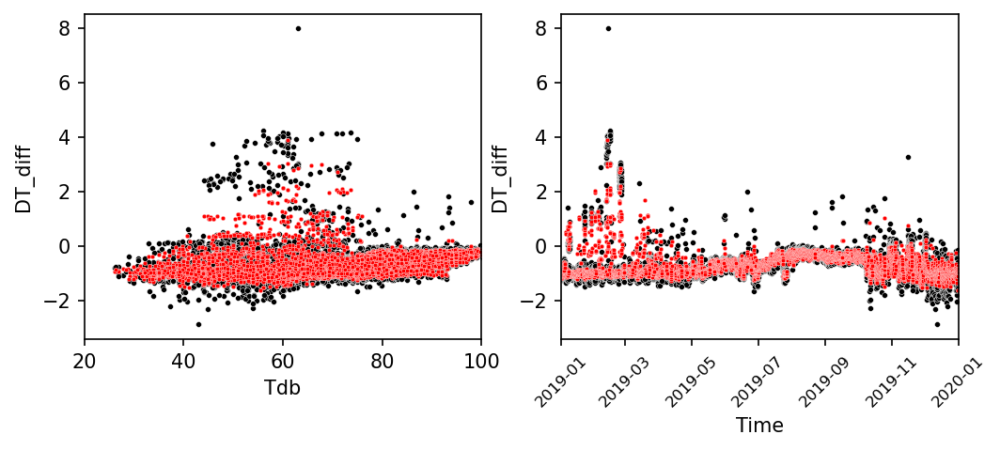

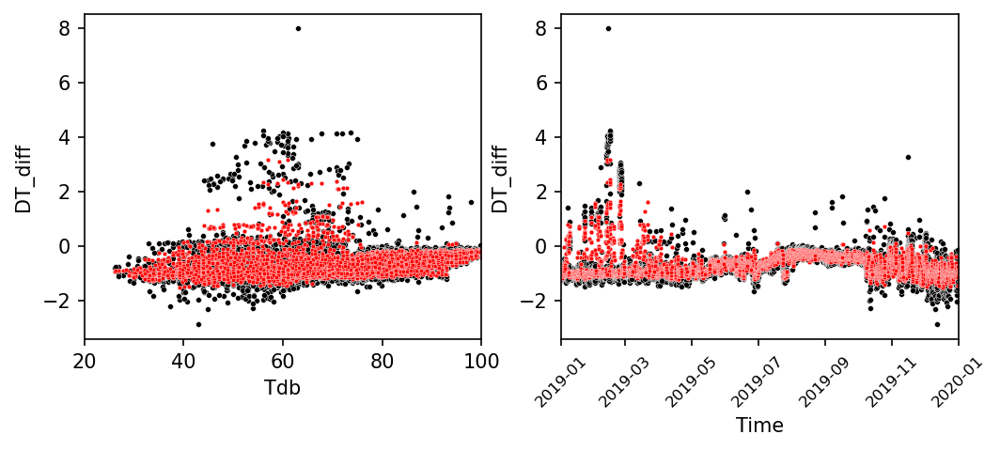

...

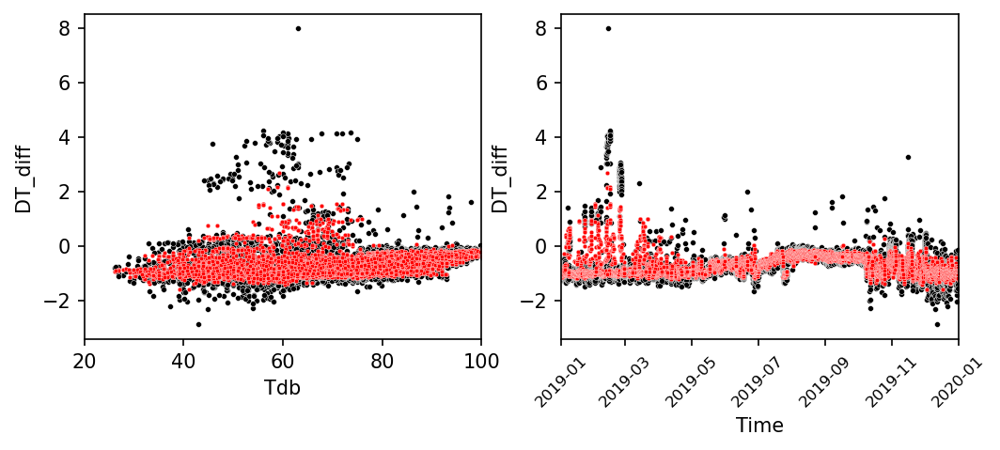

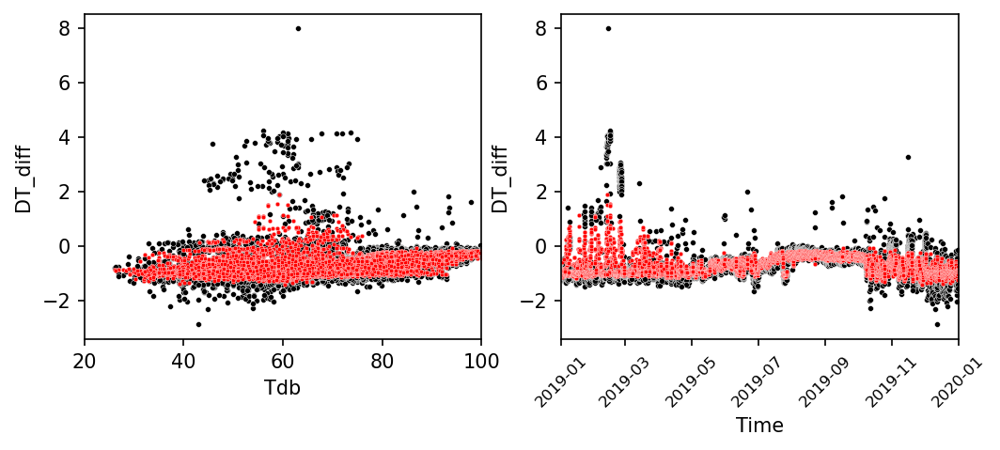

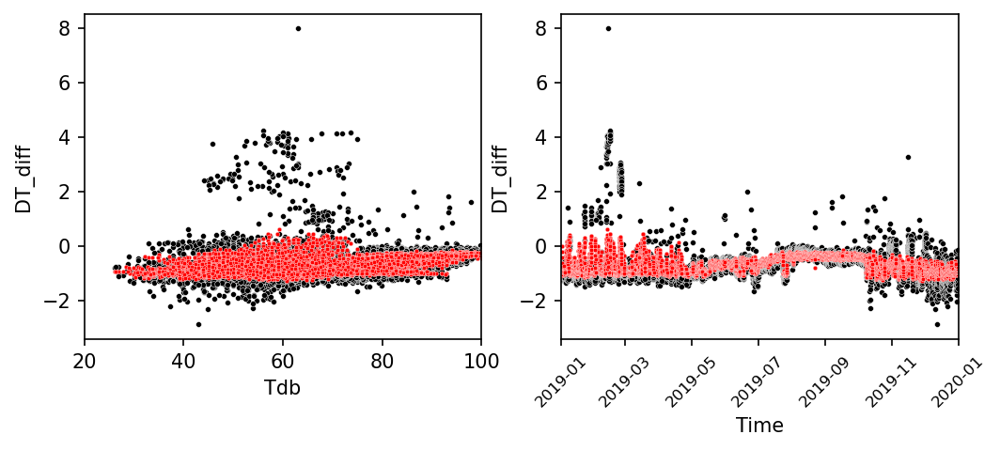

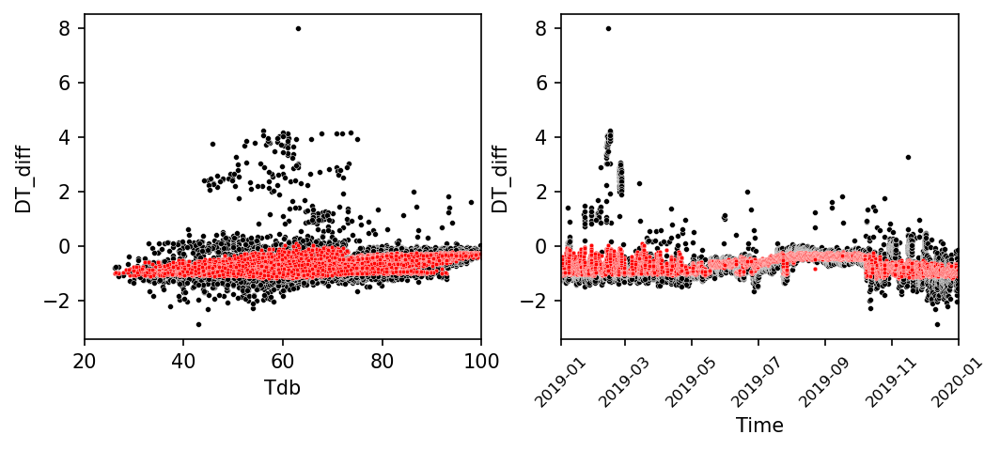

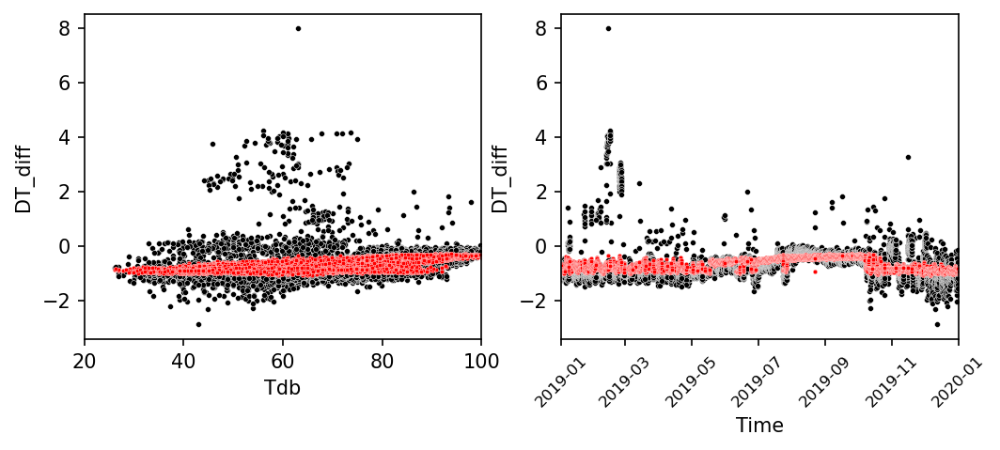

In [51]:
from sklearn.neighbors import KNeighborsRegressor

X = cleaning_data.drop(['DT_diff','Time'],axis=1)
y = cleaning_data['DT_diff']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)
scaled_X = scaler.transform(X)

k_values = [2,3,4,5,6,7,8,12,24,48,168]    #To test different K values
for n in k_values:
    knn_model = KNeighborsRegressor(n_neighbors=n)
    run_test_model(cleaning_data,knn_model,scaled_X,scaled_X_train,y_train,scaled_X_test,y_test)

**Best KNN with all features: Chosen K**

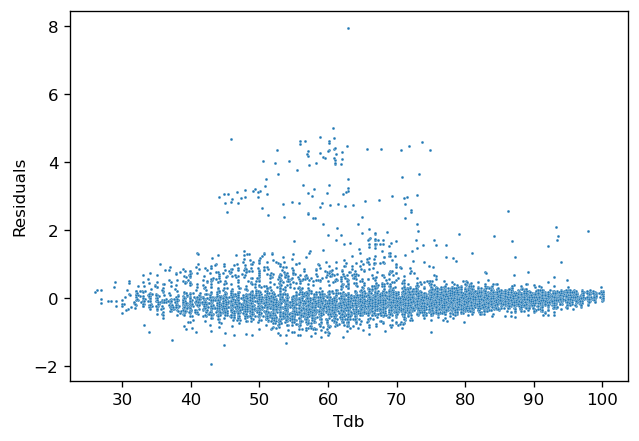

In [52]:
#Residuals for the best k value = 48, from visual inspection of the residuals plot --> One that does not over fit to the 
#data noise
knn_all_best = KNeighborsRegressor(n_neighbors=48)
knn_all_best.fit(scaled_X_train,y_train)

knn_all_preds = knn_all_best.predict(scaled_X)
knn_all_residuals = cleaning_data['DT_diff'] - knn_all_preds

plt.figure(figsize=(6,4),dpi=120)
sns.scatterplot(cleaning_data['Tdb'],knn_all_residuals,s=3)
plt.ylabel('Residuals');

**3. SVR model: Features = Tdb and Time**

* Check fraction of data points that are in the second upper trend!

In [53]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

X = cleaning_data[['Tdb','Time_numeric']]
y = cleaning_data['DT_diff']

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

scaler = StandardScaler()

scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)
scaled_X = scaler.transform(X)

RMSE_test : 0.5557324354844042


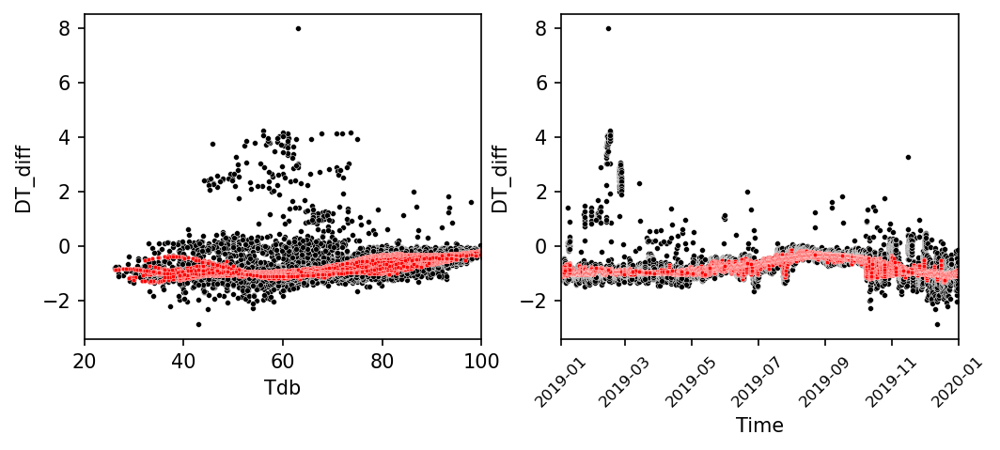

In [55]:
param_grid = {'C':[0.01,0.1,1,5,10,100]}
svr = SVR()

grid = GridSearchCV(svr,param_grid)
run_test_model(cleaning_data,grid,scaled_X,scaled_X_train,y_train,scaled_X_test,y_test)

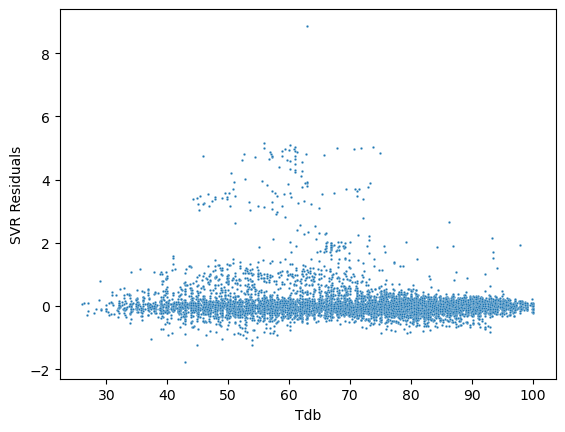

In [56]:
svr_preds = grid.predict(scaled_X)
svr_2D_residuals = cleaning_data['DT_diff'] - svr_preds

sns.scatterplot(cleaning_data['Tdb'],svr_2D_residuals,s=3)
plt.ylabel('SVR Residuals');

**3.2 SVR: Features = Tdb only**

RMSE_test : 0.5802320881144029


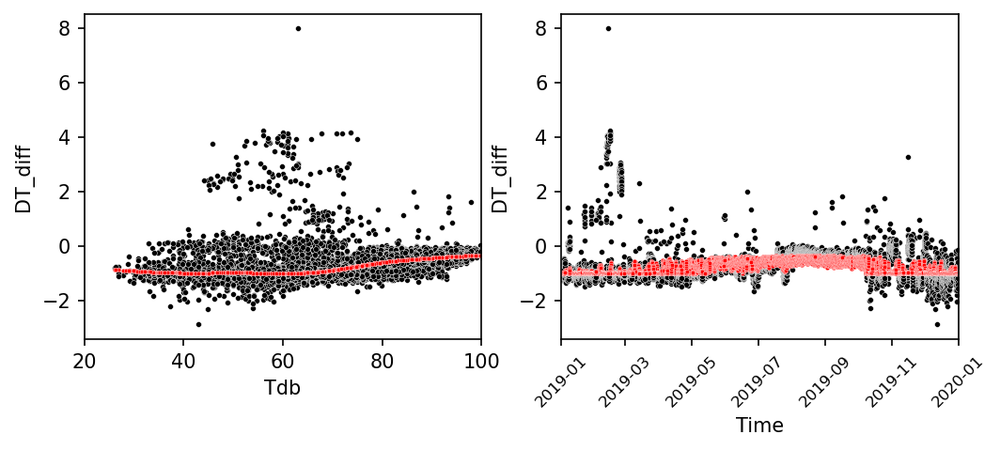

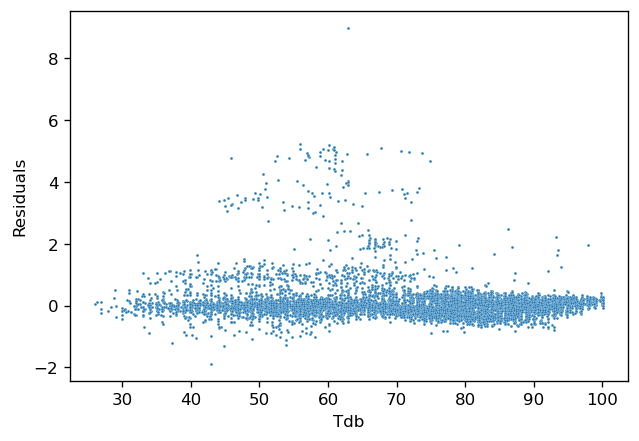

In [57]:
X = cleaning_data['Tdb']
y = cleaning_data['DT_diff']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

scaler = StandardScaler()

scaled_X_train = scaler.fit_transform(X_train.values.reshape(-1,1))
scaled_X_test = scaler.transform(X_test.values.reshape(-1,1))
scaled_X = scaler.transform(X.values.reshape(-1,1))

grid = GridSearchCV(svr,param_grid)
run_test_model(cleaning_data,grid,scaled_X,scaled_X_train,y_train,scaled_X_test,y_test)

#Plot of residuals
svr_1D_preds = grid.predict(scaled_X)
svr_1D_residuals = cleaning_data['DT_diff'] - svr_1D_preds

plt.figure(figsize=(6,4),dpi=120)
sns.scatterplot(cleaning_data['Tdb'],svr_1D_residuals,s=3)
plt.ylabel('Residuals');

**3.3 SVR: Features = All selected**

RMSE_test : 0.4857934322336096


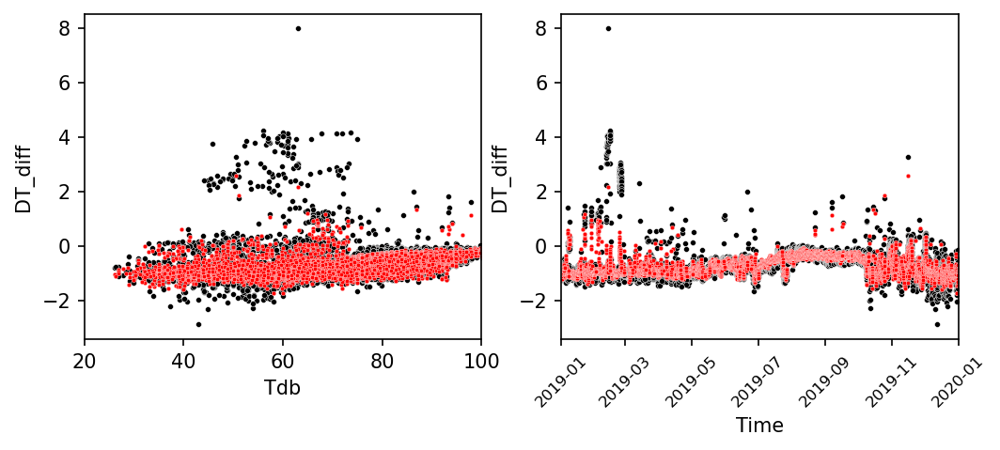

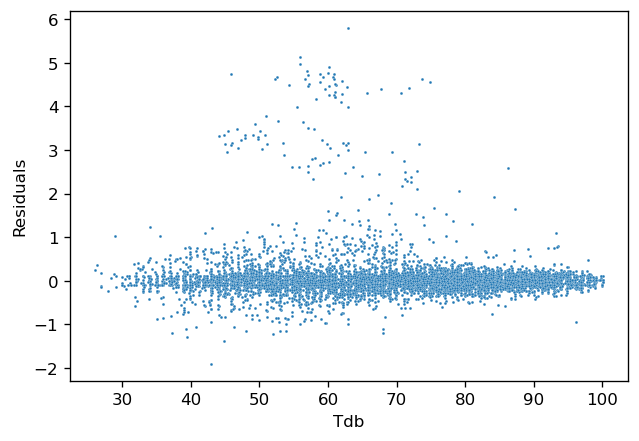

In [58]:
X = cleaning_data.drop(['DT_diff','Time'],axis=1)
y = cleaning_data['DT_diff']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

scaler = StandardScaler()

scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)
scaled_X = scaler.transform(X.values)

grid = GridSearchCV(svr,param_grid)
run_test_model(cleaning_data,grid,scaled_X,scaled_X_train,y_train,scaled_X_test,y_test)

#Plot of residuals
svr_all_preds = grid.predict(scaled_X)
svr_all_residuals = cleaning_data['DT_diff'] - svr_all_preds

plt.figure(figsize=(6,4),dpi=120)
sns.scatterplot(cleaning_data['Tdb'],svr_all_residuals,s=3)
plt.ylabel('Residuals');

# Removal of outlier data based on average chiller DT Vs Sec. Loop DT

* What is the fraction of data that is removed?
* Check outliers vs change in number of chillers within neighboring hours --> %EXPLAINABLE OUTLIERS
* Model chosen = SVR [Tdb & Time], from visual inspection of predictions

**Eliminate data with residuals > 2SD or 1SD**

7.925407925407925


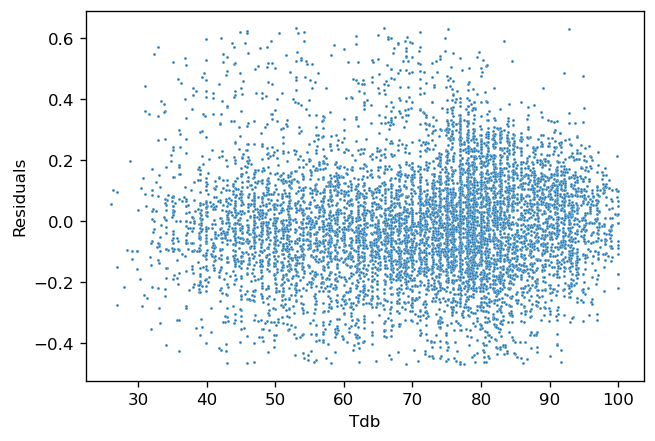

In [59]:
## Model residuals
#slr_residuals,knn_1D_residuals, knn_2D_residuals, knn_all_residuals,svr_2D_residuals, svr_1D_residuals,svr_all_residuals 

new_data2['DT_diff_res'] = svr_2D_residuals

outlier_threshold = 1
DT_diff_outliers = np.abs(new_data2['DT_diff_res']-np.mean(
    new_data2['DT_diff_res'])) > outlier_threshold * np.std(new_data2['DT_diff_res'])

#New DataFrame without outlier points
new_data3 = new_data2[~DT_diff_outliers].copy()
plt.figure(figsize=(6,4),dpi=120)
sns.scatterplot(data=new_data3,x='Tdb',y='DT_diff_res',s=3)
plt.ylabel('Residuals');

#Percentage of outlier data
outlier_percent = DT_diff_outliers.sum()*100/len(HSC_data)
#print(np.mean(new_data2['svr_Tdb_residuals']))
print(outlier_percent)

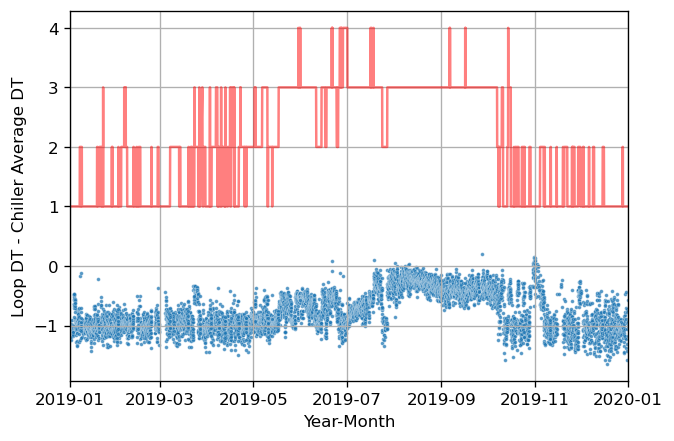

In [60]:
plt.figure(figsize=(6,4),dpi=120)

sns.scatterplot(data=new_data3,y='DT_diff',x='Time_range',s=5,alpha=0.75)
sns.lineplot(data=new_data2,y='chillers_no',x='Time_range',color='red',alpha=0.5)
plt.ylabel('Loop DT - Chiller Average DT',fontsize=10)
plt.xlabel('Year-Month',fontsize=10)
plt.xlim(datetime(2019,1,1),datetime(2020,1,1))
#plt.ylim(-2,2)
plt.grid(visible=True,)

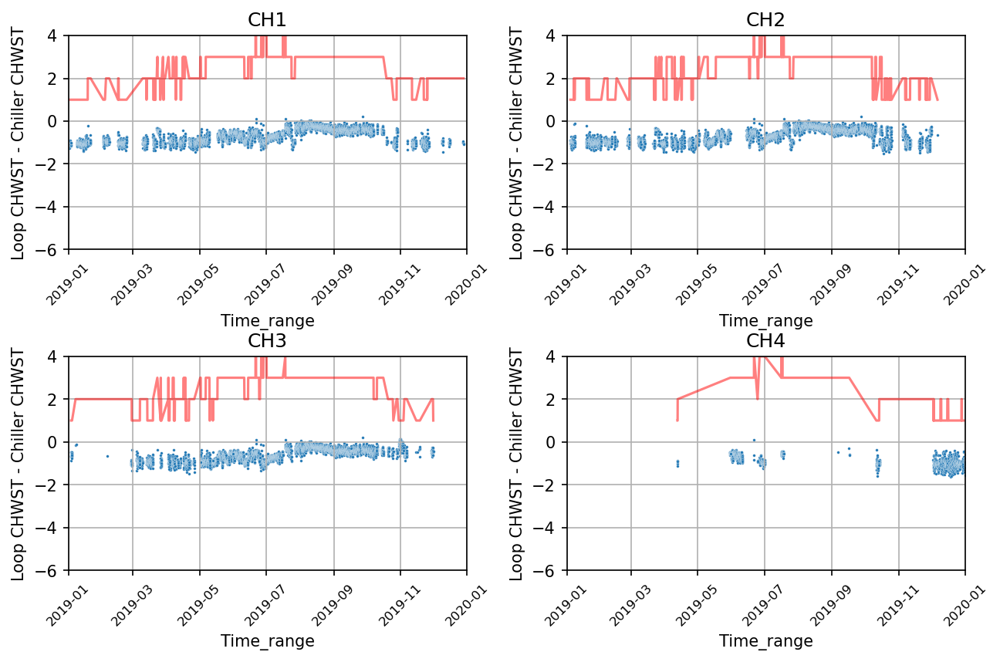

In [61]:
fig,ax = plt.subplots(2,2, figsize=(10,6),dpi=150)
#PLOTS
for i in range(4):
    data = new_data3[new_data3['PLR{n}'.format(n=str(i+1))]>0]
    if i < 2:
        sns.scatterplot(data=data,y='DT_diff',x='Time_range',ax=ax[0][i],s=3)
        sns.lineplot(data=data,y='chillers_no',x='Time_range',ax=ax[0][i],color='red',alpha=0.5)
        ax[0][i].set_ylabel('Loop CHWST - Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(datetime(2019,1,1),datetime(2020,1,1))
        ax[0][i].set_ylim(-6,4)
        ax[0][i].grid(visible=True,)
        ax[0][i].tick_params(axis='x', rotation=45, labelsize=8)
    else:
        sns.scatterplot(data=data,y='DT_diff',x='Time_range',ax=ax[1][i-2],s=3)
        sns.lineplot(data=data,y='chillers_no',x='Time_range',ax=ax[1][i-2],color='red',alpha=0.5)
        ax[1][i-2].set_ylabel('Loop CHWST - Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(datetime(2019,1,1),datetime(2020,1,1))
        ax[1][i-2].set_ylim(-6,4)
        ax[1][i-2].grid(visible=True,)
        ax[1][i-2].tick_params(axis='x', rotation=45, labelsize=8)

fig.subplots_adjust(hspace=0.5,wspace=0.25)

**Check outliers vs Operating chillers number**

In [62]:
#BETTER TO USE THE APPLY METHOD --> CREATE A FUNCTION AND MAP IT ONTO DF COLUMN
new_data2['Outlier?'] = DT_diff_outliers

new_data2['Time_numeric']  = new_data2['Time_range'].astype('int64') /10**9/(60*60*24) 
                                         # Converts into days after Unix epoch (01/01/1970)

#Column to contain values representing if there is a change in #chillers within an hour of a time stamp
new_data2['chiller_change_value'] = np.zeros(len(new_data2))

for index,value in new_data2['chiller_change_value'].items():
    if index == 0:
        new_data2.loc[index,'chiller_change_value'] = abs(new_data2['chillers_no'][index+1] - new_data2['chillers_no'][index])
    elif index == max(new_data2.index):
        new_data2.loc[index,'chiller_change_value'] = abs(new_data2['chillers_no'][index] - new_data2['chillers_no'][index-1])
    else:
        change_before = abs(new_data2['chillers_no'][index] - new_data2['chillers_no'][index-1])
        change_after = abs(new_data2['chillers_no'][index+1] - new_data2['chillers_no'][index])
        new_data2.loc[index,'chiller_change_value'] = (change_before+change_after)/2
        
chiller_no_changed = new_data2['chiller_change_value'] > 0
chiller_no_changed.sum()

365

In [63]:
#Categories of #chillers changing
new_data2['chiller_change?'] = np.zeros(len(new_data2))

for index,value in new_data2['chiller_change?'].items():
    if index == 0:
        delta_t_before = 0
        delta_t_after = new_data2['Time_numeric'][index+1] - new_data2['Time_numeric'][index]
    elif index == max(new_data2.index):
        delta_t_before = new_data2['Time_numeric'][index] - new_data2['Time_numeric'][index-1]
        delta_t_after = 0
    else:
        delta_t_before = new_data2['Time_numeric'][index] - new_data2['Time_numeric'][index-1]
        delta_t_after = new_data2['Time_numeric'][index+1] - new_data2['Time_numeric'][index]
    
    #delta-t_before = time step between current and previous time
    #delta-t_after = time step between current and next time
    
    #Fillin categories  
    #First data point in the df
    if (index == 0) and (abs(delta_t_after-1/24) >= 5.0e-6): 
        new_data2.loc[index,'chiller_change?'] = "No Neighbor(s)"
    elif (index == 0) and (abs(delta_t_after-1/24) < 5.0e-6) and (new_data2['chiller_change_value'][index] == 0):
        new_data2.loc[index,'chiller_change?'] = "No change"
    elif (index == 0) and (abs(delta_t_after-1/24) < 5.0e-6) and (new_data2['chiller_change_value'][index] != 0):
        new_data2.loc[index,'chiller_change?'] = "Changed"
        
    #Last data point in the df
    elif (index == max(new_data2.index)) and (abs(delta_t_before-1/24) >= 5.0e-6):
        new_data2.loc[index,'chiller_change?'] = "No Neighbor(s)"
    elif (index == max(new_data2.index)) and (abs(delta_t_before-1/24) < 5.0e-6) and (new_data2['chiller_change_value'][index]== 0):
        new_data2.loc[index,'chiller_change?'] = "No change"
    elif (index == max(new_data2.index)) and (abs(delta_t_before-1/24) < 5.0e-6) and (new_data2['chiller_change_value'][index] != 0):
        new_data2.loc[index,'chiller_change?'] = "Changed"
    
    #Other data points in the df
    elif ((index != 0) and (index != max(new_data2.index))) and ((abs(delta_t_before-1/24) >= 5.0e-6) or 
                                                                (abs(delta_t_after-1/24) >= 5.0e-6)):
        new_data2.loc[index,'chiller_change?'] = "No Neighbor(s)"
    elif ((index != 0) and (index != max(new_data2.index))) and (new_data2['chiller_change_value'][index]== 0):
        new_data2.loc[index,'chiller_change?'] = "No change"
    else:
        new_data2.loc[index,'chiller_change?'] = "Changed"
                                                        
new_data2[['Time_range','chiller_change?']]

,Time_range,chiller_change?
0,2019-01-01 00:00:00,No change
1,2019-01-01 01:00:00,No change
2,2019-01-01 02:00:00,No change
3,2019-01-01 03:00:00,No change
4,2019-01-01 04:00:00,No change
...,...,...
8451,2019-12-31 23:00:00,No Neighbor(s)
8452,2019-02-13 14:00:00,No Neighbor(s)
8453,2019-03-13 15:00:00,No Neighbor(s)
8454,2019-10-25 11:00:00,No Neighbor(s)


**Number of data points per change in #chiller categories**

In [64]:
No_neighbors = new_data2['chiller_change?'] == "No Neighbor(s)"
No_change = new_data2['chiller_change?'] == "No change"
Changed = new_data2['chiller_change?'] == "Changed"

[No_neighbors.sum(),No_change.sum(),Changed.sum()]

[315, 7937, 204]

In [65]:
# outlier_mapping = {False:"Not outlier", True:'Outlier'}
# new_data2['Outlier?'] = new_data2['Outlier?'].map(outlier_mapping)

# new_data2['Outlier?'].unique()

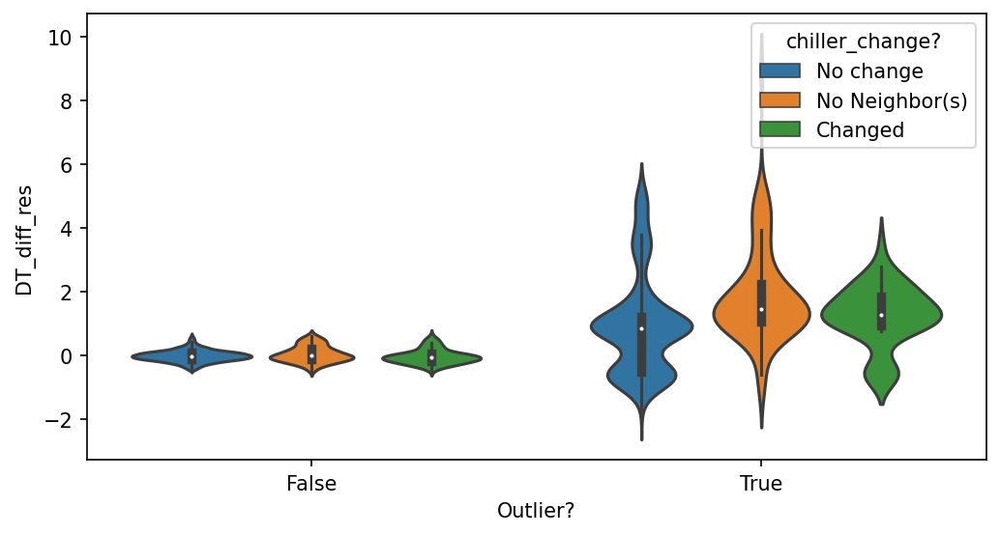

In [66]:
plt.figure(figsize=(8,4),dpi=150)

sns.violinplot(data=new_data2,x='Outlier?',y='DT_diff_res',hue='chiller_change?');

In [67]:
counts = new_data2[['chiller_change?','Outlier?']].value_counts()
counts_df = pd.DataFrame(counts)
counts_df = counts_df.reset_index(drop=False)
counts_df.columns = ['#Chillers','Outlier?','Counts']

no_chiller_sums = {"No change":[],"No Neighbor(s)":[],"Changed":[]}
for key in no_chiller_sums.keys():
    no_chiller_sums[key] = counts_df['Counts'][counts_df['#Chillers']==key].sum()

def frac_of_cats(row):
    return row['Counts']*100/no_chiller_sums[row['#Chillers']]

counts_df['%'] = counts_df.apply(frac_of_cats,axis=1)


counts_df

,#Chillers,Outlier?,Counts,%
0,No change,False,7398,93.209021
1,No change,True,539,6.790979
2,No Neighbor(s),False,229,72.698413
3,Changed,False,149,73.039216
4,No Neighbor(s),True,86,27.301587
5,Changed,True,55,26.960784


# PLOTS AFTER CLEANING

**Chiller CHWST versus Tdb: After cleaning based on chiller DT --> Any reset**

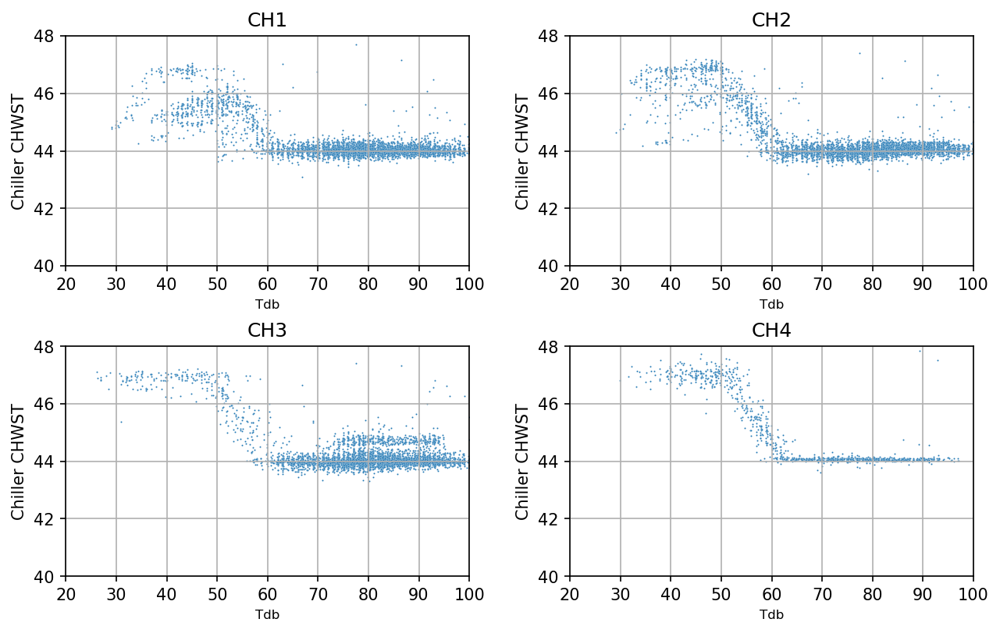

In [68]:
fig,ax = plt.subplots(2,2, figsize=(10,6),dpi=150)

for i in range(4):
    data = new_data3[new_data3['PLR{n}'.format(n=str(i+1))]>0]
    if i < 2:
        sns.scatterplot(data=data,x='Tdb',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Tdb',fontsize=8)
        ax[0][i].set_ylabel('Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(20,100)
        ax[0][i].set_ylim(40,48)
        ax[0][i].grid(visible=True,)
    else:
        sns.scatterplot(data=data,x='Tdb',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Tdb',fontsize=8)
        ax[1][i-2].set_ylabel('Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(20,100)
        ax[1][i-2].set_ylim(40,48)
        ax[1][i-2].grid(visible=True,)

fig.subplots_adjust(hspace=0.35,wspace=0.25)

In [69]:
[len(new_data[new_data['PLR1']>0]),len(new_data3[new_data3['PLR1']>0])]

#Check when the data that is off happens --> when additional coming on?

[5433, 5251]

# Load Plot After Removal of bad data

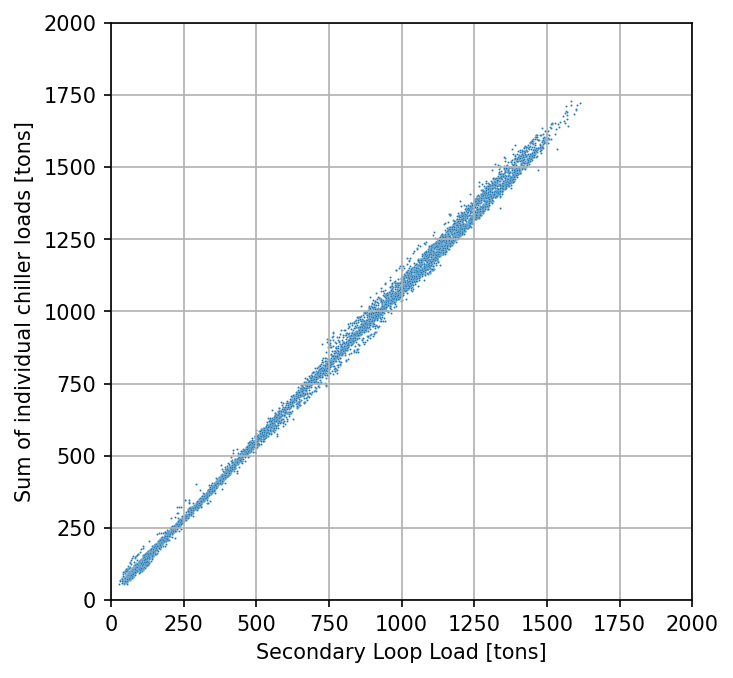

In [70]:
plt.figure(figsize=(5,5),dpi=150)

sns.scatterplot(data=new_data3,x='sec_load',y='load_total',s=1)
plt.xlim(0,2000)
plt.ylim(0,2000)
plt.xlabel('Secondary Loop Load [tons]')
plt.ylabel('Sum of individual chiller loads [tons]');
plt.grid()

**Chiller CHWST after Cleaning**

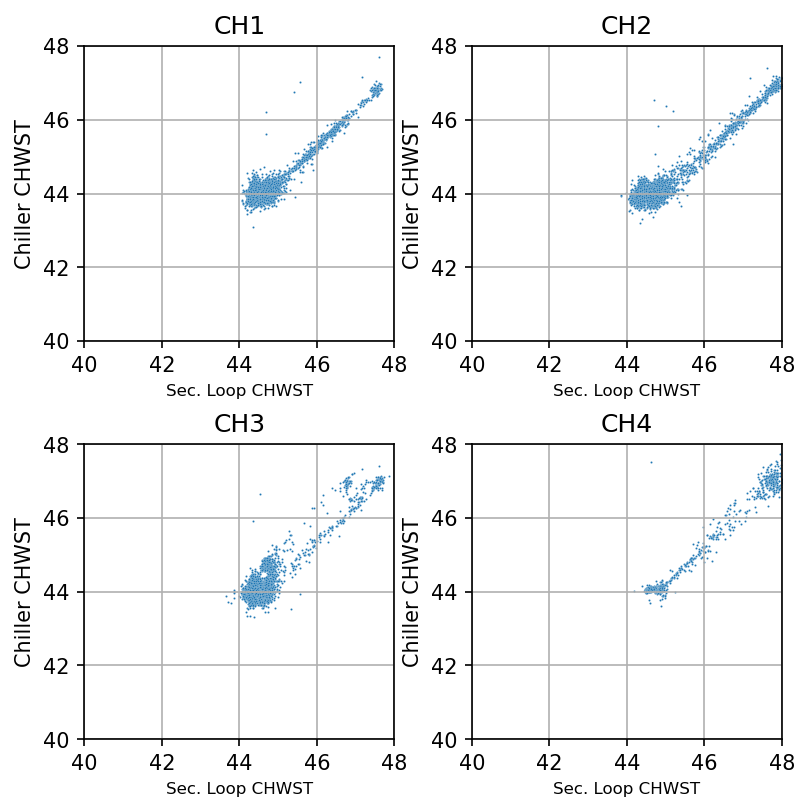

In [71]:
fig,ax = plt.subplots(2,2, figsize=(6,6),dpi=150)

for i in range(4):
    data = new_data3[new_data3['PLR{n}'.format(n=str(i+1))]>0]
    if i < 2:
        sns.scatterplot(data=data,x='CHW loop Supply Temp',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Sec. Loop CHWST',fontsize=8)
        ax[0][i].set_ylabel('Chiller CHWST',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(40,48)
        ax[0][i].set_xticks(np.linspace(40,48,5))
        ax[0][i].set_ylim(40,48)
        ax[0][i].set_yticks(np.linspace(40,48,5))
        ax[0][i].grid(visible=True,)
    else:
        sns.scatterplot(data=data,x='CHW loop Supply Temp',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Sec. Loop CHWST',fontsize=8)
        ax[1][i-2].set_ylabel('Chiller CHWST',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(40,48)
        ax[1][i-2].set_xticks(np.linspace(40,48,5))
        ax[1][i-2].set_ylim(40,48)
        ax[1][i-2].set_yticks(np.linspace(40,48,5))
        ax[1][i-2].grid(visible=True,)

fig.subplots_adjust(hspace=0.35,wspace=0.25)

**Check the Sec PLR for the chillers**

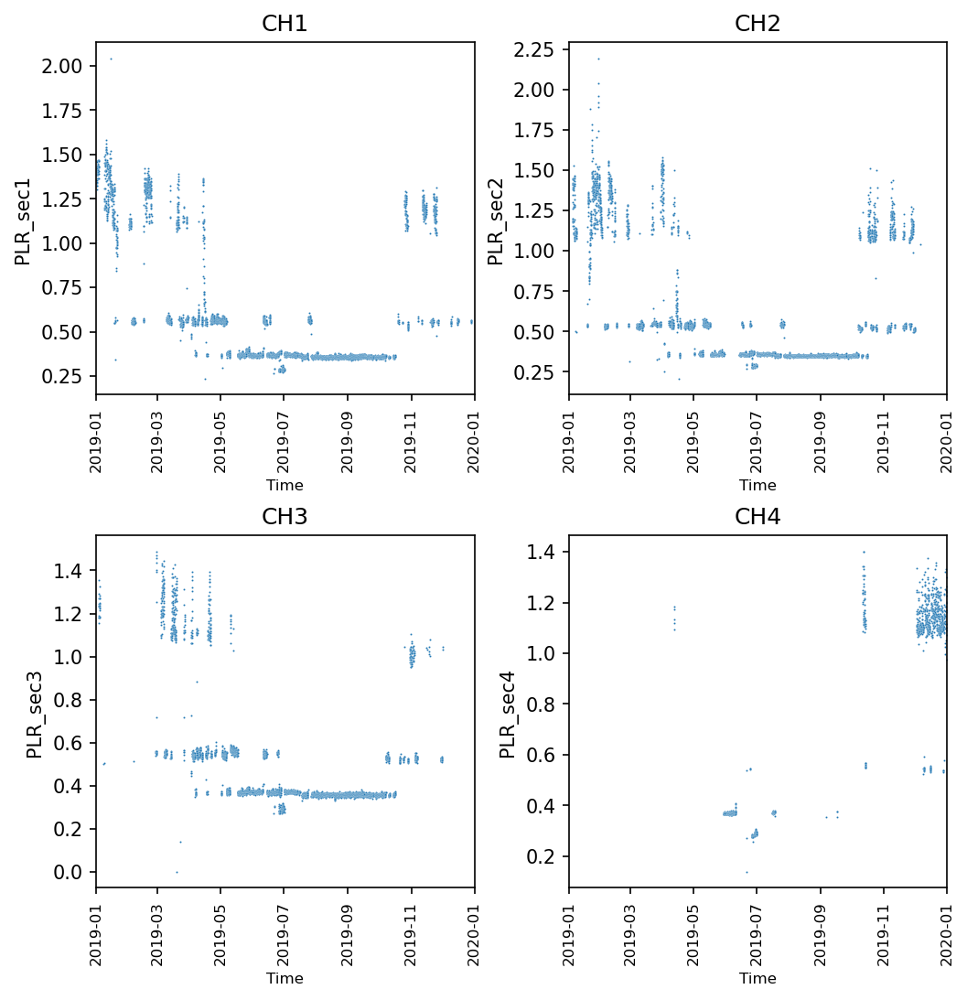

In [72]:
fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

for i in range(4):
    data = new_data3[new_data3['PLR{n}'.format(n=str(i+1))]>0]
    if i < 2:
        sns.scatterplot(data=data,x='Time_range',y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
        ax[0][i].set_xlabel('Time',fontsize=8)
        #ax[0][i].set_ylabel('Total individual load/Secondary load',fontsize=10)
        ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
        ax[0][i].set_xlim(datetime(2019, 1, 1, 0, 0, 0), datetime(2020,1, 1, 0, 0, 0))
        ax[0][i].tick_params(axis='x',rotation=90,labelsize=8)
    else:
        sns.scatterplot(data=data,x='Time_range',y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
        ax[1][i-2].set_xlabel('Time',fontsize=8)
        #ax[0][i].set_ylabel('Total individual load/Secondary load',fontsize=10)
        ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        ax[1][i-2].set_xlim(datetime(2019, 1, 1, 0, 0, 0), datetime(2020,1, 1, 0, 0, 0))
        ax[1][i-2].tick_params(axis='x',rotation=90,labelsize=8)

fig.subplots_adjust(hspace=0.4,wspace=0.25)

# Sec PLR Vs Individual Chiller PLR

In [73]:
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i in range(4):
#     data = new_data3[new_data3['PLR{n}'.format(n=str(i+1))]>0]
#     if i < 2:
#         sns.scatterplot(data=data,x='PLR{n}'.format(n=str(i+1)),y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
#         ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
#     else:
#         sns.scatterplot(data=data,x='PLR{n}'.format(n=str(i+1)),y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
#         ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
        
# fig.subplots_adjust(hspace=0.3,wspace=0.25)

# Separate Chiller-by-chiller and remove zero PLR points

In [74]:
# ind_chillers = {'CH1':new_data3,'CH2':new_data3,'CH3':new_data3,'CH4':new_data3}

In [75]:
# for i,chiller in enumerate(ind_chillers):
#     ind_chillers[chiller] = ind_chillers[chiller][ind_chillers[chiller]['PLR{n}'.format(n=str(i+1))]>0]

In [76]:
# [len(ind_chillers['CH1']),len(ind_chillers['CH2']),len(ind_chillers['CH3']),len(ind_chillers['CH4'])]

In [77]:
# category_order = np.arange(1,13,1)
# labels = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i,chiller in enumerate(ind_chillers):
#     sns.set_theme(style="whitegrid")
    
#     if i<2:
#         g = sns.countplot(data=ind_chillers[chiller], x="month",palette="Dark2", ax = ax[0][i],order=category_order)
#         g.tick_params(rotation=-45,axis='x',labelsize=8)
#         g.set_ylabel('#Data points',fontsize=10)
#         g.set_xlabel('Month',fontsize=10)
#         g.set_title('Chiller {n}'.format(n=str(i+1)))
#         g.set_xticks(ticks=range(12),labels=labels)
#         g.tick_params(axis='both', which='both', pad=1)
#     else:
#         g = sns.countplot(data=ind_chillers[chiller], x="month",palette="Dark2", ax = ax[1][i-2],order=category_order)
#         g.tick_params(rotation=-45,axis='x',labelsize=8)
#         g.set_ylabel('#Data points',fontsize=10)
#         g.set_xlabel('Month',fontsize=10)
#         g.set_title('Chiller {n}'.format(n=str(i+1)))
#         g.set_xticks(ticks=range(12),labels=labels)
#         g.tick_params(axis='both', which='both', pad=1)
        
# fig.subplots_adjust(hspace=0.35,wspace=0.3)

In [78]:
# new_data3.info()

# Sec PLR Vs No. Operating Chillers

In [79]:
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i,chiller in enumerate(ind_chillers):
#     if i < 2:
#         sns.violinplot(data=ind_chillers[chiller],x='chillers_no',y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i])
#         ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
#         ax[0][i].set_xlabel('No. Online Chillers')
#         ax[0][i].grid(axis='y',linestyle='--')
#         ax[0][i].set_ylim(0,2)
#         ax[0][i].set_ylabel('Q_evap/(loop load)')
#     else:
#         sns.violinplot(data=ind_chillers[chiller],x='chillers_no',y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2])
#         ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
#         ax[1][i-2].set_xlabel('No. Online Chillers')
#         ax[1][i-2].grid(axis='y',linestyle='--')
#         ax[1][i-2].set_ylim(0,2)
#         ax[1][i-2].set_ylabel('Q_evap/(loop load)')
        
# fig.subplots_adjust(hspace=0.3,wspace=0.25)
# fig.savefig('PLR_sec_Vs_No_OP_CHs.png',bbox_inches='tight')

# What I learn from this so far:
1. Most PLR_sec >> 1 data  points occur with one chiller running
2. The highest PLR_sec >> 1 data points occur for the lowerest PLR for the chillers
3. Three scenarios can be the cause:
    * The sensors difference in accuracy can cause this; especially if they are different sensors at the secondary loop and chiller side --> For me this is the most likely issue since we mostly see this at low PLRs
    * Sensor calibration issue can not be completely ruled out
    
    * The plot of secondary load Vs Individual chiller total loads can be a good basis for **unsteady-state operating data screening**
        * This can be viewed as a first-law (energy balance) check --> This is expected to be violated if the chiller(s) has/have not achieved steady-state operation.
        * I propose to include this in the **chiller M&V manuscript that I shared earlier** 
        
        
**Comments**
* Check the DT influence
* Check the CHWST and CHWRT comparisons with secondary loop's --> Include the bypass flow in the analysis
* Check how many chiller_on data points are between 1 - 10 kW

# Chiller sec load PLR versus Average chiller DT 

In [80]:
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i in range(4):
#     if i < 2:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='DT_avg',
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
#         ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
#         ax[0][i].set_xlim(0,15)
#         ax[0][i].set_ylim(0,2.5)
#         ax[0][i].set_xlabel('Flow weighted average chiller $\Delta$T [$^{o}$F]',fontsize=11)
#         ax[0][i].set_ylabel('Q_evap/(loop load)')
#     else:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='DT_avg',
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
#         ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
#         ax[1][i-2].set_xlim(0,15)
#         ax[1][i-2].set_ylim(0,2.5)
#         ax[1][i-2].set_xlabel('Flow weighted average chiller $\Delta$T [$^{o}$F]',fontsize=11)
#         ax[1][i-2].set_ylabel('Q_evap/(loop load)')
        
# fig.subplots_adjust(hspace=0.3,wspace=0.25)

# fig.savefig('PLR_sec_Vs_DT_avg.png',bbox_inches='tight')

# Chiller sec load PLR versus Average chiller CHWST 

In [81]:
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i in range(4):
#     if i < 2:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='CHLR_LCHWT{n}'.format(n=str(i+1)),
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
#         ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
#         ax[0][i].set_xlim(40,60)
#         ax[0][i].set_ylim(0,2.5)
#         ax[0][i].set_xlabel('CHWST')
#     else:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='CHLR_LCHWT{n}'.format(n=str(i+1)),
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
#         ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
#         ax[1][i-2].set_xlim(40,60)
#         ax[1][i-2].set_ylim(0,2.5)
#         ax[1][i-2].set_xlabel('CHWST')
        
# fig.subplots_adjust(hspace=0.3,wspace=0.25)

# Chiller sec load PLR versus Average chiller CHWRT 

In [82]:
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i in range(4):
#     if i < 2:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='CHLR_RCHWT{n}'.format(n=str(i+1)),
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
#         ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
#         ax[0][i].set_xlim(40,60)
#         ax[0][i].set_ylim(0,2.5)
#         ax[0][i].set_xlabel('CHWRT')
#     else:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='CHLR_RCHWT{n}'.format(n=str(i+1)),
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
#         ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
#         ax[1][i-2].set_xlim(40,60)
#         ax[1][i-2].set_ylim(0,2.5)
#         ax[1][i-2].set_xlabel('CHWRT')
        
# fig.subplots_adjust(hspace=0.3,wspace=0.25)

# Chiller sec load PLR versus difference btn avg chiller DT and Loop DT

In [83]:
# new_data2['DT_diff'] = new_data2['DT_avg'] - new_data2['CHW loop DT']

# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=120)

# for i in range(4):
#     if i < 2:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='DT_diff',
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
#         ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
#         ax[0][i].set_xlim(-4,2)
#         ax[0][i].set_ylim(0,2.5)
#         ax[0][i].set_xlabel('Average chiller DT - Sec. Loop DT')
#         ax[0][i].set_ylabel('Q_evap/(loop load)')
#     else:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='DT_diff',
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
#         ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
#         ax[1][i-2].set_xlim(-4,2)
#         ax[1][i-2].set_ylim(0,2.5)
#         ax[1][i-2].set_xlabel('Average chiller DT - Sec. Loop DT')
#         ax[1][i-2].set_ylabel('Q_evap/(loop load)')
        
# fig.subplots_adjust(hspace=0.3,wspace=0.25)

# fig.savefig('PLR_sec_Vs_chiller_loop_DT_diff.png',bbox_inches='tight')

# 240110: What i learn

* PLR_Sec >> 1.0 occurs at low chiller DT --> Low chiller CHWRT
* PLR_Sec >> 1.0 not related to the difference between chiller DT and Sec. Loop DT. 
* PLR_Sec >> 1.0 is very likely caused by measurement error on the secondry loop CHWST. The shape of the difference between primary Loop DT from Sec. Loop DT is similar
* I NEED TO CREATE A CORRECTION FUNCTION FOR THE LOOP CHWST SENSOR!!!!!

# Percentage remaining data per chiller after load & DT cleaning

In [84]:
# [new_data3['CHLR_ON1'].sum()*100/HSC_data['CHLR_ON1'].sum(),new_data3['CHLR_ON2'].sum()*100/HSC_data['CHLR_ON2'].sum(),
#  new_data3['CHLR_ON3'].sum()*100/HSC_data['CHLR_ON3'].sum(),new_data3['CHLR_ON4'].sum()*100/HSC_data['CHLR_ON4'].sum()]

In [85]:
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i in range(4):
#     if i < 2:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='CHLR_RCHWT{n}'.format(n=str(i+1)),
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[0][i],s=1)
#         ax[0][i].set_title('CH{n}'.format(n=str(i+1)))
#         ax[0][i].set_xlim(40,60)
#         ax[0][i].set_ylim(0,2.5)
#         ax[0][i].set_xlabel('CHWRT')
#         ax[0][i].set_ylabel('Q_evap/(loop load)')
#     else:
#         sns.scatterplot(data=new_data3[new_data3['PLR_sec{n}'.format(n=str(i+1))]>0],x='CHLR_RCHWT{n}'.format(n=str(i+1)),
#                         y='PLR_sec{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=1)
#         ax[1][i-2].set_title('CH{n}'.format(n=str(i+1)))
#         ax[1][i-2].set_xlim(40,60)
#         ax[1][i-2].set_ylim(0,2.5)
#         ax[1][i-2].set_xlabel('CHWRT')
#         ax[1][i-2].set_ylabel('Q_evap/(loop load)')
        
# fig.subplots_adjust(hspace=0.3,wspace=0.25)

# fig.savefig('PLR_sec_Vs_CHWRT.png',bbox_inches='tight')

# Removal of bad efficiency datapoints

In [86]:
# #Compute the efficiencies
# chiller_capacity = 600
# for i in range(4):
#     new_data3['Load{n}'.format(n=str(i+1))] = new_data3['PLR{n}'.format(n=str(i+1))]*chiller_capacity
#     new_data3['kW_ton{n}'.format(n=str(i+1))] = new_data3['ELE{n}'.format(n=str(i+1))]/new_data3['Load{n}'.format(n=str(i+1))]

# fig,ax = plt.subplots(2,2, figsize=(10,10),dpi=200)

# for i in range(4):
    
#     if i < 2:
#         sns.scatterplot(data=new_data3,x='Twb',y='kW_ton{n}'.format(n=str(i+1)),ax=ax[0][i],s=3)
#         ax[0][i].set_xlabel('Twb [F]',fontsize=12)
#         ax[0][i].set_ylabel('kW/ton', fontsize=12)
#         ax[0][i].set_title('Chiller {n}'.format(n=str(i+1)))
#         #ax[0][i].set_ylim(0,1)
#     else:
#         sns.scatterplot(data=new_data3,x='Twb',y='kW_ton{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=3)
#         ax[1][i-2].set_xlabel('Twb [F]',fontsize=12)
#         ax[1][i-2].set_ylabel('kW/ton', fontsize=12)
#         ax[1][i-2].set_title('Chiller {n}'.format(n=str(i+1)))
#         #ax[1][i-2].set_ylim(0,1)

# fig.subplots_adjust(hspace=0.35)

#Bad efficiency data points (e.g. kW/ton > 1) to be removed in the subsquent analyses

# Number of data points per month 

In [87]:
# category_order = np.arange(1,13,1)
# labels = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
# fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

# for i in range(4):
#     sns.set_theme(style="whitegrid")
    
#     if i<2:
#         g = sns.countplot(data=new_data2[new_data2['CHLR_ON{n}'.format(n=str(i+1))]==1],
#                                          x="month",palette="Dark2", ax = ax[0][i],order=category_order)
#         g.tick_params(rotation=-45,axis='x',labelsize=8)
#         g.set_ylabel('#Data points',fontsize=10)
#         g.set_xlabel('Month',fontsize=10)
#         g.set_title('Chiller {n}'.format(n=str(i+1)))
#         g.set_xticks(ticks=range(12),labels=labels)
#         g.tick_params(axis='both', which='both', pad=1)
#     else:
#         g = sns.countplot(data=new_data2[new_data2['CHLR_ON{n}'.format(n=str(i+1))]==1],
#                           x="month",palette="Dark2", ax = ax[1][i-2],order=category_order)
#         g.tick_params(rotation=-45,axis='x',labelsize=8)
#         g.set_ylabel('#Data points',fontsize=10)
#         g.set_xlabel('Month',fontsize=10)
#         g.set_title('Chiller {n}'.format(n=str(i+1)))
#         g.set_xticks(ticks=range(12),labels=labels)
#         g.tick_params(axis='both', which='both', pad=1)
        
# fig.subplots_adjust(hspace=0.35,wspace=0.3)

# Load Vs Sec Load and DT vs Loop DT plots after cleaning

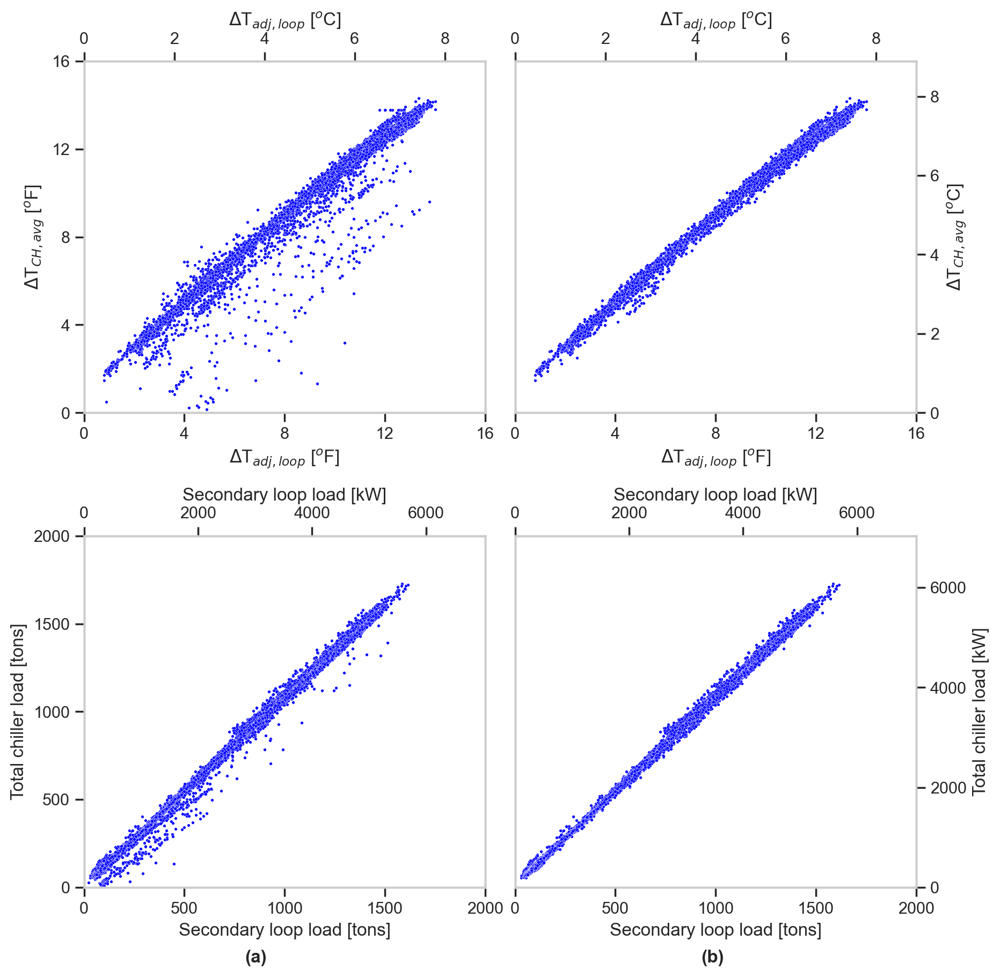

In [88]:
#HSC_data['Adj CHW loop DT_C'] = HSC_data['Adj CHW loop DT']*5/9
#HSC_data['DT_avg_C'] = HSC_data['DT_avg']*5/9

sns.set(style="whitegrid")
fig,ax = plt.subplots(2,2, figsize=(10,10),dpi=200)

sns.scatterplot(data=HSC_data,x='Adj CHW loop DT',y='DT_avg',ax=ax[0][0],s=4,color='blue')
ax[0][0].set_xlabel('$\Delta$T$_{adj,loop}$ [$^{o}$F]',fontsize=12)
ax[0][0].set_ylabel('$\Delta$T$_{CH,avg}}$ [$^{o}$F]',fontsize=12)
#ax[0][0].set_title("Before cleaning")
ax[0][0].set_ylim(0, 16)
ax[0][0].set_xlim(0, 16)
ax[0][0].set_yticks(np.linspace(0,16,5))
ax[0][0].set_xticks(np.linspace(0,16,5))
ax[0][0].grid(False)

sec_x1 = ax[0][0].twiny()   #Secondary x axis
sec_x1.set_xlim(0,16*5/9)
sec_x1.set_xticks(np.linspace(0,8,5))
sec_x1.grid(False)
sec_y1 = ax[0][0].twinx()   #Secondary y axis
sec_y1.set_ylim(0,16*5/9)
sec_y1.set_yticks([])
sec_y1.grid(False)
sec_x1.set_xlabel('$\Delta$T$_{adj,loop}$ [$^{o}$C]',fontsize=12)

sns.scatterplot(data=new_data3,x='Adj CHW loop DT',y='DT_avg',ax=ax[0][1],s=4,color='blue')
ax[0][1].set_xlabel('$\Delta$T$_{adj,loop}$ [$^{o}$F]',fontsize=12)
ax[0][1].set_ylabel('')
#ax[0][1].set_title("After cleaning")
ax[0][1].set_ylim(0,16)
ax[0][1].set_xlim(0,16)
ax[0][1].set_yticks([])
ax[0][1].set_xticks([0,4,8,12,16])
ax[0][1].grid(False)

sec_x2 = ax[0][1].twiny()   #Secondary x axis
sec_x2.set_xlim(0,16*5/9)
sec_x2.set_xticks(np.linspace(0,8,5))
sec_x2.grid(False)
sec_y2 = ax[0][1].twinx()   #Secondary y axis
sec_y2.set_ylim(0,16*5/9)
sec_y2.set_yticks(np.linspace(0,8,5))
sec_y2.grid(False)
sec_x2.set_xlabel('$\Delta$T$_{adj,loop}$ [$^{o}$C]',fontsize=12)
sec_y2.set_ylabel('$\Delta$T$_{CH,avg}}$ [$^{o}$C]',fontsize=12)

sns.scatterplot(data=HSC_data,x='sec_load',y='load_total',ax=ax[1][0],s=4,color='blue')
ax[1][0].set_ylabel('Total chiller load [tons]',fontsize=12)
ax[1][0].set_xlabel('Secondary loop load [tons]', fontsize=12)
#ax[1][0].set_title("Before cleaning", fontsize=12)
ax[1][0].set_ylim(0,2000)
ax[1][0].set_xlim(0,2000)
ax[1][0].set_yticks(np.linspace(0,2000,5))
ax[1][0].set_xticks(np.linspace(0,2000,5))
ax[1][0].grid(False)

sec_x3 = ax[1][0].twiny()   #Secondary x axis
sec_x3.set_xlim(0,2000*3.5169)
sec_x3.set_xticks(np.linspace(0,6000,4))
sec_x3.grid(False)
sec_x3.set_xlabel('Secondary loop load [kW]', fontsize=12)
sec_y3 = ax[1][0].twinx()   #Secondary y axis
sec_y3.set_ylim(0,2000*3.5169)
sec_y3.set_yticks([])
sec_y3.grid(False)

sns.scatterplot(data=new_data3,x='sec_load',y='load_total',ax=ax[1][1],s=4,color='blue')
ax[1][1].set_ylabel('',)
ax[1][1].set_xlabel('Secondary loop load [tons]', fontsize=12)
#ax[1][1].set_title("After cleaning", fontsize=12)
ax[1][1].set_ylim(0,2000)
ax[1][1].set_xlim(0,2000)
ax[1][1].set_yticks([])
ax[1][1].set_xticks(np.linspace(0,2000,5))
ax[1][1].grid(False)

sec_x4 = ax[1][1].twiny()   #Secondary x axis
sec_x4.set_xlim(0,2000*3.5169)
sec_x4.set_xticks(np.linspace(0,6000,4))
sec_x4.grid(False)
sec_x4.set_xlabel('Secondary loop load [kW]', fontsize=12)
sec_y4 = ax[1][1].twinx()   #Secondary y axis
sec_y4.set_ylim(0,2000*3.5169)
sec_y4.set_yticks(np.linspace(0,6000,4))
sec_y4.grid(False)
sec_y4.set_ylabel('Total chiller load [kW]',fontsize=12)

fig.text(0.275,0.04,"(a)",fontweight='bold')
fig.text(0.7,0.04,"(b)",fontweight='bold')
   
fig.subplots_adjust(hspace=0.35,wspace=.075)

fig.savefig('Cleaned_Vs_BeforeCleanedData.png',bbox_inches='tight')
plt.show()

In [89]:
new_data3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7776 entries, 0 to 8451
Data columns (total 95 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Time_range              7776 non-null   datetime64[ns]
 1   CHLR_LCHWT1             7776 non-null   float64       
 2   CHLR_LCWT1              7776 non-null   float64       
 3   CHLR_RCHWT1             7776 non-null   float64       
 4   CHLR_RCWT1              7776 non-null   float64       
 5   CHW flow1               7776 non-null   float64       
 6   CHWET1                  7776 non-null   float64       
 7   CHWLT1                  7776 non-null   float64       
 8   CW flow1                7776 non-null   float64       
 9   CWET1                   7776 non-null   float64       
 10  CWLT1                   7776 non-null   float64       
 11  ELE1                    7776 non-null   float64       
 12  CHLR_ON1                7776 non-null   float64 

In [90]:
new_data3['Load_CH1'] = new_data3['PLR1']*600
new_data3['Load_CH2'] = new_data3['PLR2']*600
new_data3['Load_CH3'] = new_data3['PLR3']*600
new_data3['Load_CH4'] = new_data3['PLR4']*600

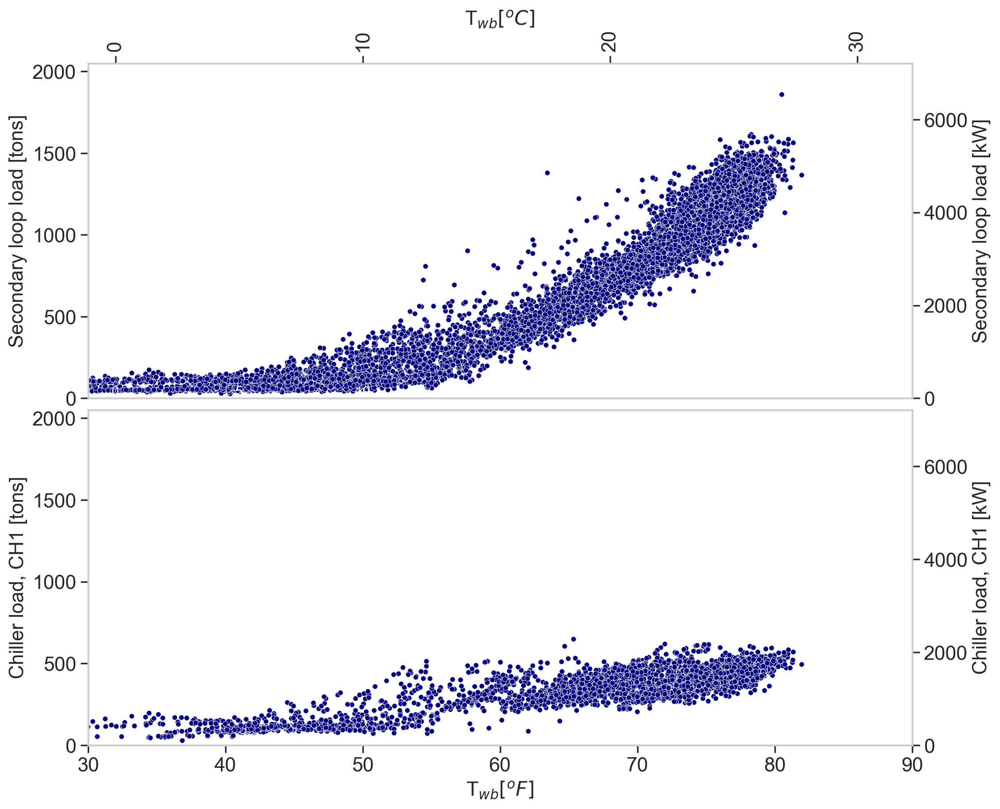

In [91]:
#Individual Chiller load Vs Sec load
fig,ax = plt.subplots(2,1, figsize=(12,10),dpi=200)
for i in range(2):
    # ax[0][1].text(100,80,stats_text[i],fontweight='bold',fontsize=16)
    ax[i].tick_params(labelsize=16)
    ax[i].grid(visible = None, axis ='both')
    ax[i].set_ylim(0,2050)
    ax[i].set_xlim(30,90)


    #Secondary y axis for better readability
    sec_y1 = ax[i].twinx()
    sec_y1.tick_params(labelsize=16)
    sec_y1.grid(visible=None)
    sec_x1 = ax[i].twiny()
    sec_x1.grid(visible=None)
    
    if i == 0:
        sns.scatterplot(data=new_data3,x='Twb',y='sec_load',ax=ax[i],s=18,color='navy',)
        
        
        ax[i].set_yticks(np.linspace(0,2000,5))
        sec_y1.set_ylabel('Secondary loop load [kW]', fontsize=16)
        sec_y1.set_ylim(0,2050*3.5169)
        sec_y1.set_yticks(np.linspace(0,6000,4))
        sec_x1.set_xlim((30-32)*5/9,(90-32)*5/9)
        sec_x1.set_xticks(np.linspace(0,30,4))
        sec_x1.tick_params(labelsize=16,rotation=90)
        ax[i].set_ylabel('Secondary loop load [tons]', fontsize=16)
        sec_x1.set_xlabel('T$_{wb} [^{o}C]$',fontsize=16)
        ax[i].set_xlabel('')
        
        ax[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        ax[i].text(70,150,'',fontweight='bold',fontsize=16)

    else:
        sns.scatterplot(data=new_data3[new_data3['PLR1']>0],x='Twb',y='Load_CH1',ax=ax[i],s=18,color='navy',)

        ax[i].set_xlabel('T$_{wb} [^{o}F]$',fontsize=16)
        ax[i].set_ylabel('Chiller load, CH1 [tons]',fontsize=16)
        sec_y1.set_ylabel('Chiller load, CH1 [kW]', fontsize=16)
        ax[i].set_ylim(0,2050)
        ax[i].set_yticks(np.linspace(0,2000,5))
        sec_y1.set_ylim(0,2050*3.5169)
        sec_y1.set_yticks(np.linspace(0,6000,4))
        sec_x1.set_xlim((30-32)*5/9,(90-32)*5/9)
        
        sec_x1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False,labelright=False,
                           labelleft=False,labelcolor="white")

#         legend = ax[0][i].legend()
#         legend.texts[0].set_fontsize(14)
#         legend.texts[1].set_fontsize(14)
fig.subplots_adjust(hspace=0.035,wspace=0.02)
fig.savefig('Secondary Load and Individual CH load.png',bbox_inches='tight')

# Convert the Time_range column to date time type

In [92]:
new_data3['Time_range'] = pd.to_datetime(new_data3['Time_range'])
new_data3.head()

,Time_range,CHLR_LCHWT1,CHLR_LCWT1,CHLR_RCHWT1,CHLR_RCWT1,CHW flow1,CHWET1,CHWLT1,CW flow1,CWET1,...,RCHWT_avg_pred,RCHWT_residuals,DT_diff,day_of_week,time_of_day,DT_diff_res,Load_CH1,Load_CH2,Load_CH3,Load_CH4
0,2019-01-01 00:00:00,44.950,54.825,48.775,56.575,586.325,48.493,44.882,1798.325,54.907,...,48.721361,-0.060552,-1.078983,1,0,-0.010780,93.445547,0.0,0.0,0.0
1,2019-01-01 01:00:00,44.700,54.650,48.650,56.375,583.700,48.357,44.690,1801.663,54.748,...,48.580190,-0.080659,-1.171666,1,1,-0.107256,96.067292,0.0,0.0,0.0
2,2019-01-01 02:00:00,44.900,54.875,48.550,56.500,609.150,48.343,44.862,1802.898,54.930,...,48.573231,0.014979,-0.973205,1,2,0.058404,92.641562,0.0,0.0,0.0
3,2019-01-01 03:00:00,44.975,54.875,48.700,56.450,601.250,48.445,44.930,1801.423,54.867,...,48.659993,-0.050081,-1.107182,1,3,-0.077446,93.319010,0.0,0.0,0.0
4,2019-01-01 04:00:00,45.000,54.925,48.600,56.650,611.900,48.425,44.955,1800.285,54.973,...,48.658171,0.046350,-0.912727,1,4,0.099853,91.785000,0.0,0.0,0.0


# **INDIVIDUAL CHILLER DATA**

In [93]:
chillers = new_data3

chiller_capacity = 600 #Chiller capacity in tons
#Chiller 1 data
chiller1 = chillers[['Time_range','Day_of_week','Occupancy','month', 'Tdb', 'Twb', 'CHLR_LCHWT1', 'CHLR_LCWT1',
                     'CHLR_RCHWT1','CHLR_RCWT1', 'CHW flow1', 'CHWET1', 'CHWLT1', 'CW flow1', 'CWET1',
                     'CWLT1', 'ELE1','CHLR_ON1','PLR1','PLR_sec1','chillers_no']]
chiller1 = chiller1[chiller1['CHLR_ON1']!=0]   #Drop entries with chiller off
chiller1['Load1'] = chiller1['PLR1']*chiller_capacity
chiller1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5251 entries, 0 to 5394
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Time_range   5251 non-null   datetime64[ns]
 1   Day_of_week  5251 non-null   int64         
 2   Occupancy    5251 non-null   object        
 3   month        5251 non-null   int64         
 4   Tdb          5251 non-null   float64       
 5   Twb          5251 non-null   float64       
 6   CHLR_LCHWT1  5251 non-null   float64       
 7   CHLR_LCWT1   5251 non-null   float64       
 8   CHLR_RCHWT1  5251 non-null   float64       
 9   CHLR_RCWT1   5251 non-null   float64       
 10  CHW flow1    5251 non-null   float64       
 11  CHWET1       5251 non-null   float64       
 12  CHWLT1       5251 non-null   float64       
 13  CW flow1     5251 non-null   float64       
 14  CWET1        5251 non-null   float64       
 15  CWLT1        5251 non-null   float64       
 16  ELE1  

In [94]:
#Chiller 2 Data
chiller2 = chillers[['Time_range','Day_of_week','Occupancy','month', 'Tdb', 'Twb', 'CHLR_LCHWT2', 'CHLR_LCWT2',
                     'CHLR_RCHWT2','CHLR_RCWT2', 'CHW flow2', 'CHWET2', 'CHWLT2', 'CW flow2', 'CWET2',
                     'CWLT2', 'ELE2','CHLR_ON2','PLR2','PLR_sec2','chillers_no']]
chiller2 = chiller2[chiller2['CHLR_ON2']!=0]
chiller2['Load2'] = chiller2['PLR2']*chiller_capacity

In [95]:
#Chiller 3 Data
chiller3 = chillers[['Time_range','Day_of_week','Occupancy','month', 'Tdb', 'Twb', 'CHLR_LCHWT3', 'CHLR_LCWT3',
                     'CHLR_RCHWT3','CHLR_RCWT3', 'CHW flow3', 'CHWET3', 'CHWLT3', 'CW flow3', 'CWET3',
                     'CWLT3', 'ELE3','CHLR_ON3','PLR3','PLR_sec3','chillers_no']]
chiller3 = chiller3[chiller3['CHLR_ON3']!=0]
chiller3['Load3'] = chiller3['PLR3']*chiller_capacity

In [96]:
#Chiller 4 Data
chiller4 = chillers[['Time_range','Day_of_week','Occupancy','month', 'Tdb', 'Twb', 'CHLR_LCHWT4', 'CHLR_LCWT4',
                     'CHLR_RCHWT4','CHLR_RCWT4', 'CHW flow4', 'CHWET4', 'CHWLT4', 'CW flow4', 'CWET4',
                     'CWLT4', 'ELE4','CHLR_ON4','PLR4','PLR_sec4','chillers_no']]
chiller4 = chiller4[chiller4['CHLR_ON4']!=0]
chiller4['Load4'] = chiller4['PLR4']*chiller_capacity

In [97]:
#Combine data into a dictionary

chiller_datasets = {'CH1':chiller1,'CH2':chiller2,'CH3':chiller3,'CH4':chiller4} #Dictionary to loop through
                    
chiller_datasets['CH1'].info()  #Data for chiller, CHx

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5251 entries, 0 to 5394
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Time_range   5251 non-null   datetime64[ns]
 1   Day_of_week  5251 non-null   int64         
 2   Occupancy    5251 non-null   object        
 3   month        5251 non-null   int64         
 4   Tdb          5251 non-null   float64       
 5   Twb          5251 non-null   float64       
 6   CHLR_LCHWT1  5251 non-null   float64       
 7   CHLR_LCWT1   5251 non-null   float64       
 8   CHLR_RCHWT1  5251 non-null   float64       
 9   CHLR_RCWT1   5251 non-null   float64       
 10  CHW flow1    5251 non-null   float64       
 11  CHWET1       5251 non-null   float64       
 12  CHWLT1       5251 non-null   float64       
 13  CW flow1     5251 non-null   float64       
 14  CWET1        5251 non-null   float64       
 15  CWLT1        5251 non-null   float64       
 16  ELE1  

# Power consumption per chiller

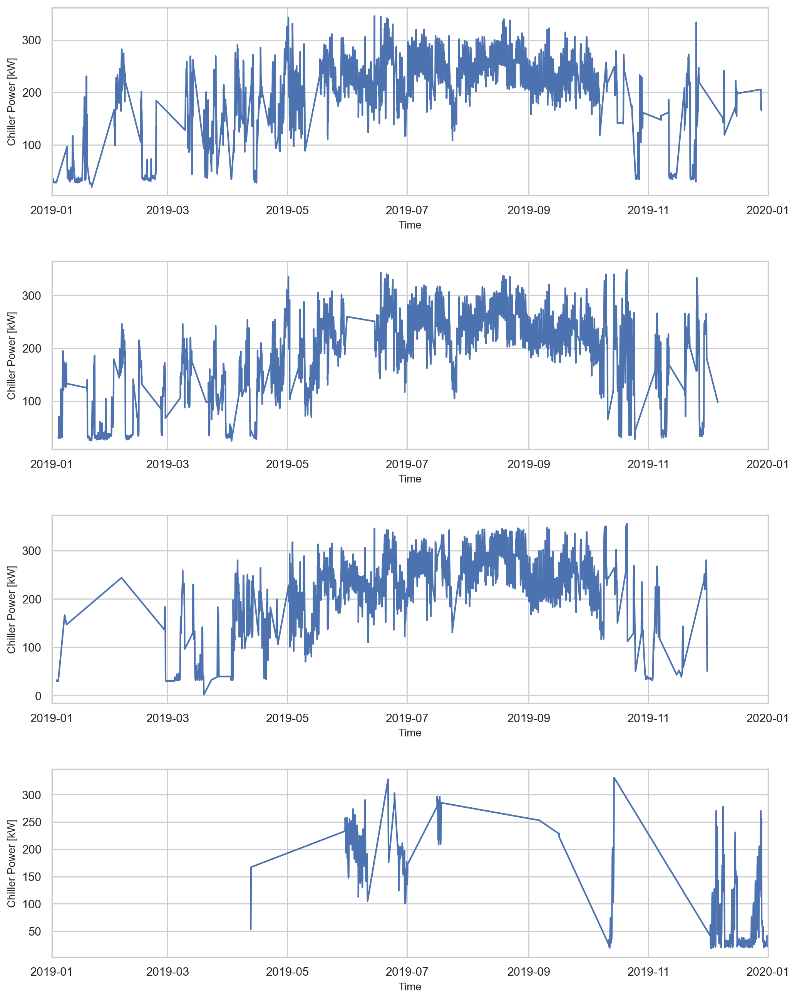

In [98]:
#Chiller power
fig,ax = plt.subplots(4,1, figsize=(12,16),dpi=200)

for i,chiller in enumerate(chiller_datasets.keys()):
    sns.lineplot(data=chiller_datasets[chiller],x='Time_range',y='ELE{n}'.format(n=str(i+1)),ax=ax[i])
    ax[i].set_xlabel('Time',fontsize=10)
    ax[i].set_ylabel('Chiller Power [kW]',fontsize=10)
    ax[i].set_xlim(datetime(2019, 1, 1, 0, 0, 0), datetime(2020, 1, 1, 0, 0, 0))

fig.subplots_adjust(hspace=0.35)

# Chiller powers Vs WBT

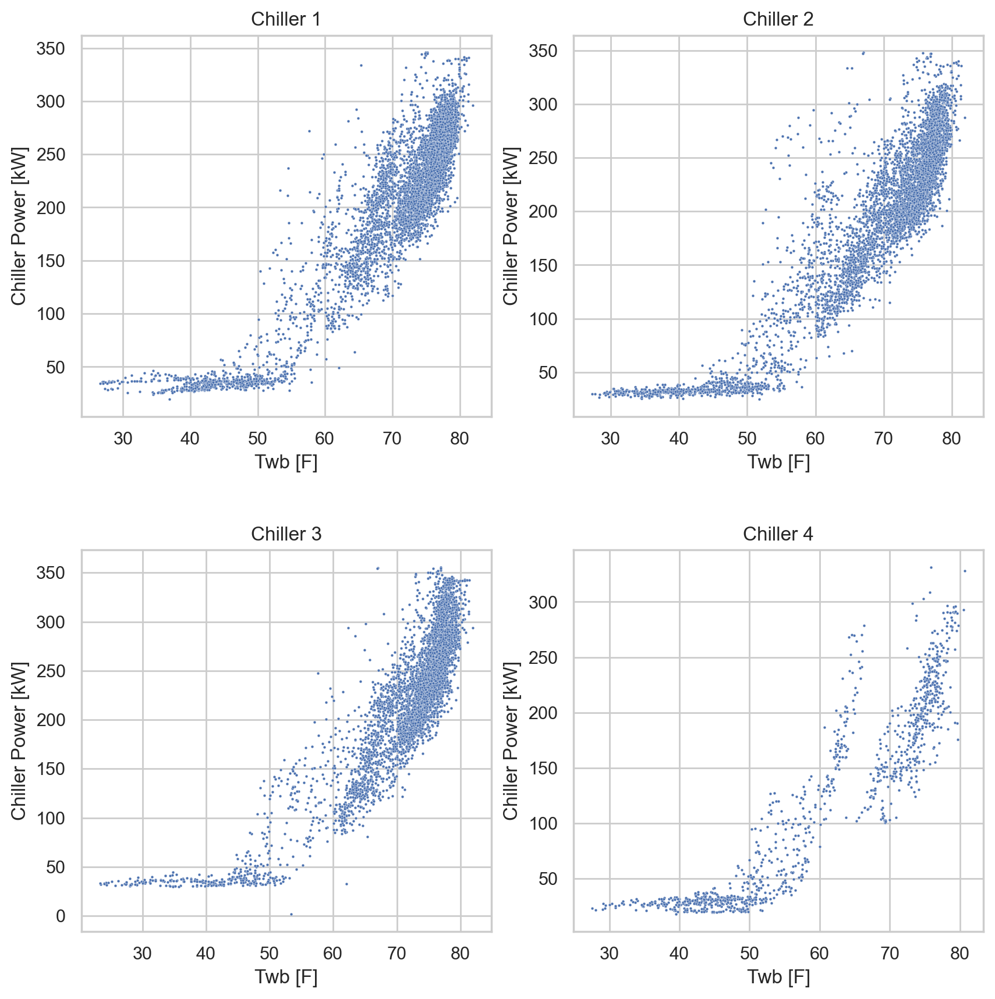

In [99]:
#Chiller Powers
fig,ax = plt.subplots(2,2, figsize=(10,10),dpi=200)

for i,chiller in enumerate(chiller_datasets.keys()):
    if i < 2:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='ELE{n}'.format(n=str(i+1)),ax=ax[0][i],s=3)
        ax[0][i].set_xlabel('Twb [F]',fontsize=12)
        ax[0][i].set_ylabel('Chiller Power [kW]', fontsize=12)
        ax[0][i].set_title('Chiller {n}'.format(n=str(i+1)))
    else:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='ELE{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=3)
        ax[1][i-2].set_xlabel('Twb [F]',fontsize=12)
        ax[1][i-2].set_ylabel('Chiller Power [kW]', fontsize=12)
        ax[1][i-2].set_title('Chiller {n}'.format(n=str(i+1)))

fig.subplots_adjust(hspace=0.35)

# **Combined load plot**

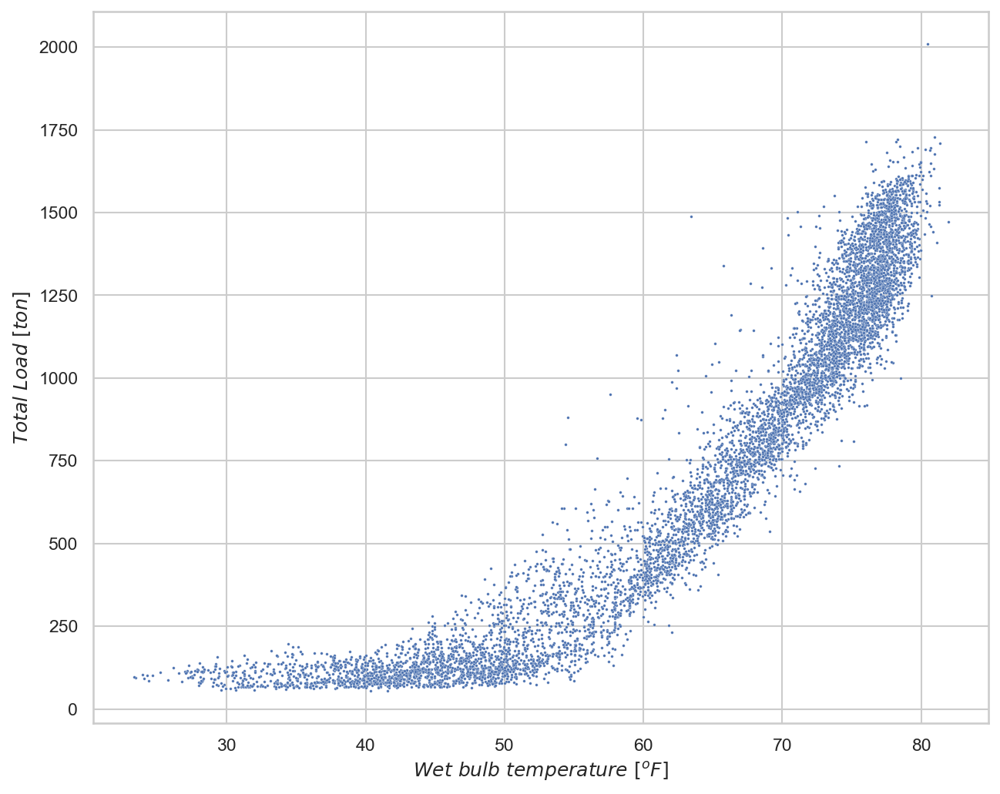

In [100]:
#Combined chiller load plot: Chiller 1-3

plt.figure(figsize=(10,8),dpi=150)

sns.scatterplot(data=chillers,x='Twb',y='load_total',s=3);
plt.xlabel("$Wet\ bulb\ temperature\ [^{o}F]$")
plt.ylabel("$Total\ Load\ [ton]$");

# Total Load Vs Individual CHiller load

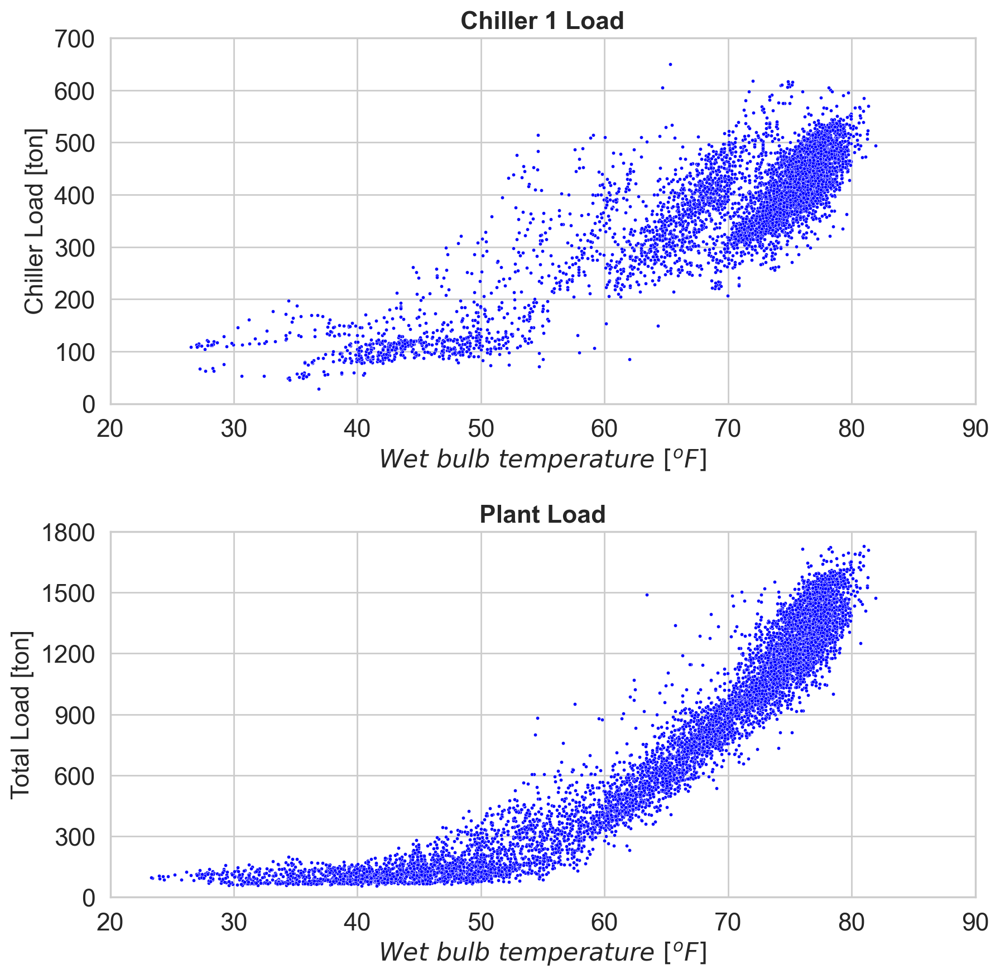

In [101]:
fig,ax = plt.subplots(2,1, figsize=(10,10),dpi=200)

sns.scatterplot(data=chiller_datasets['CH1'],x='Twb',y='Load1',ax=ax[0],s=5,color='blue')
ax[0].set_xlabel("$Wet\ bulb\ temperature\ [^{o}F]$",fontsize=16)
ax[0].set_ylabel('Chiller Load [ton]', fontsize=16)
ax[0].set_xticks(np.linspace(20,90,8))
ax[0].set_yticks(np.linspace(0,700,8))
ax[0].set_xlim(20,90)
ax[0].set_ylim(0,700)
ax[0].set_title('Chiller 1 Load',fontsize=16,fontweight='bold')
ax[0].tick_params(axis='both', labelsize=16)

sns.scatterplot(data=chillers,x='Twb',y='load_total',s=5,ax=ax[1],color='blue');
ax[1].set_xlabel("$Wet\ bulb\ temperature\ [^{o}F]$",fontsize=16)
ax[1].set_ylabel("Total Load [ton]",fontsize=16)
ax[1].set_xticks(np.linspace(20,90,8))
ax[1].set_yticks(np.linspace(0,1800,7))
ax[1].set_xlim(20,90)
ax[1].set_ylim(0,1800)
ax[1].tick_params(axis='both', labelsize=16)
ax[1].set_title('Plant Load',fontsize=16,fontweight='bold');

fig.subplots_adjust(hspace=0.35)
fig.savefig('Full_Load Vs Individual Chiller_Load.png',bbox_inches='tight')

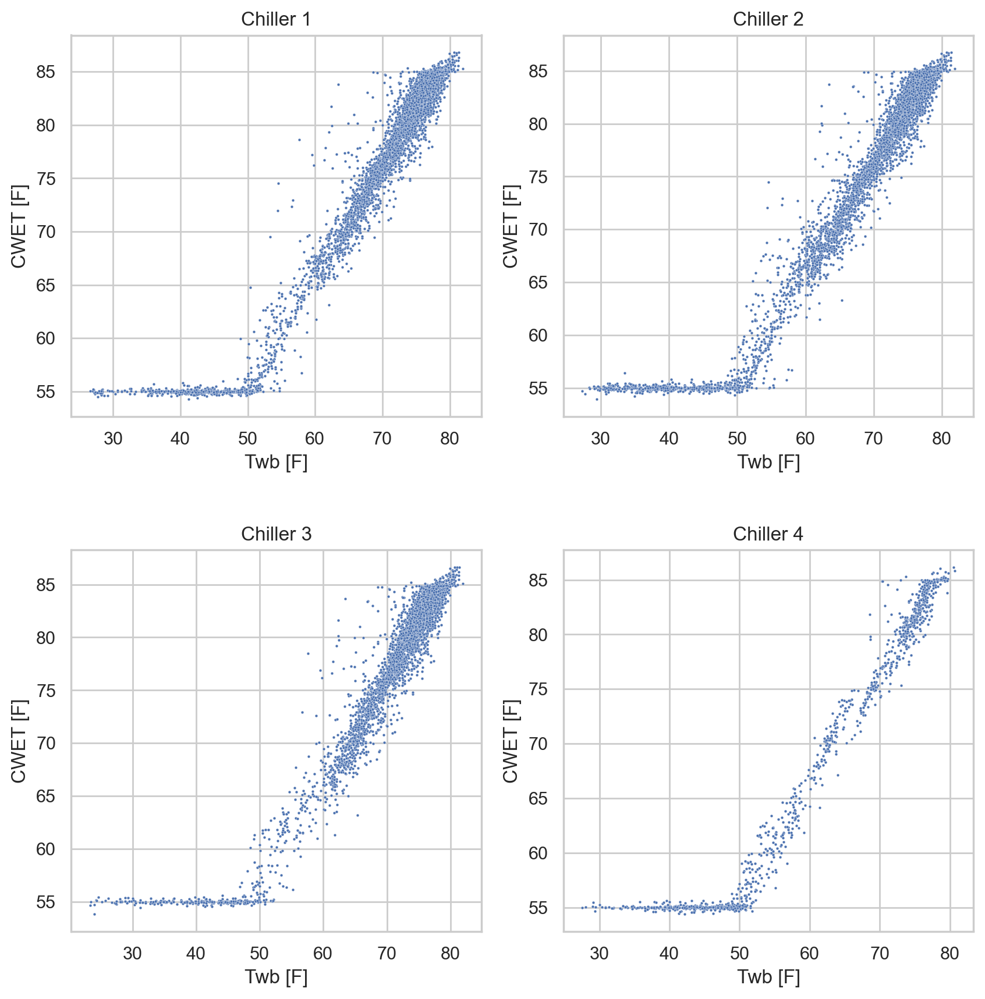

In [102]:
#Condenser entering temperatures
fig,ax = plt.subplots(2,2, figsize=(10,10),dpi=200)

for i,chiller in enumerate(chiller_datasets.keys()):
    if i < 2:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='CWET{n}'.format(n=str(i+1)),ax=ax[0][i],s=3)
        ax[0][i].set_xlabel('Twb [F]',fontsize=12)
        ax[0][i].set_ylabel('CWET [F]', fontsize=12)
        ax[0][i].set_title('Chiller {n}'.format(n=str(i+1)))
    else:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='CWET{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=3)
        ax[1][i-2].set_xlabel('Twb [F]',fontsize=12)
        ax[1][i-2].set_ylabel('CWET [F]', fontsize=12)
        ax[1][i-2].set_title('Chiller {n}'.format(n=str(i+1)))

fig.subplots_adjust(hspace=0.35)

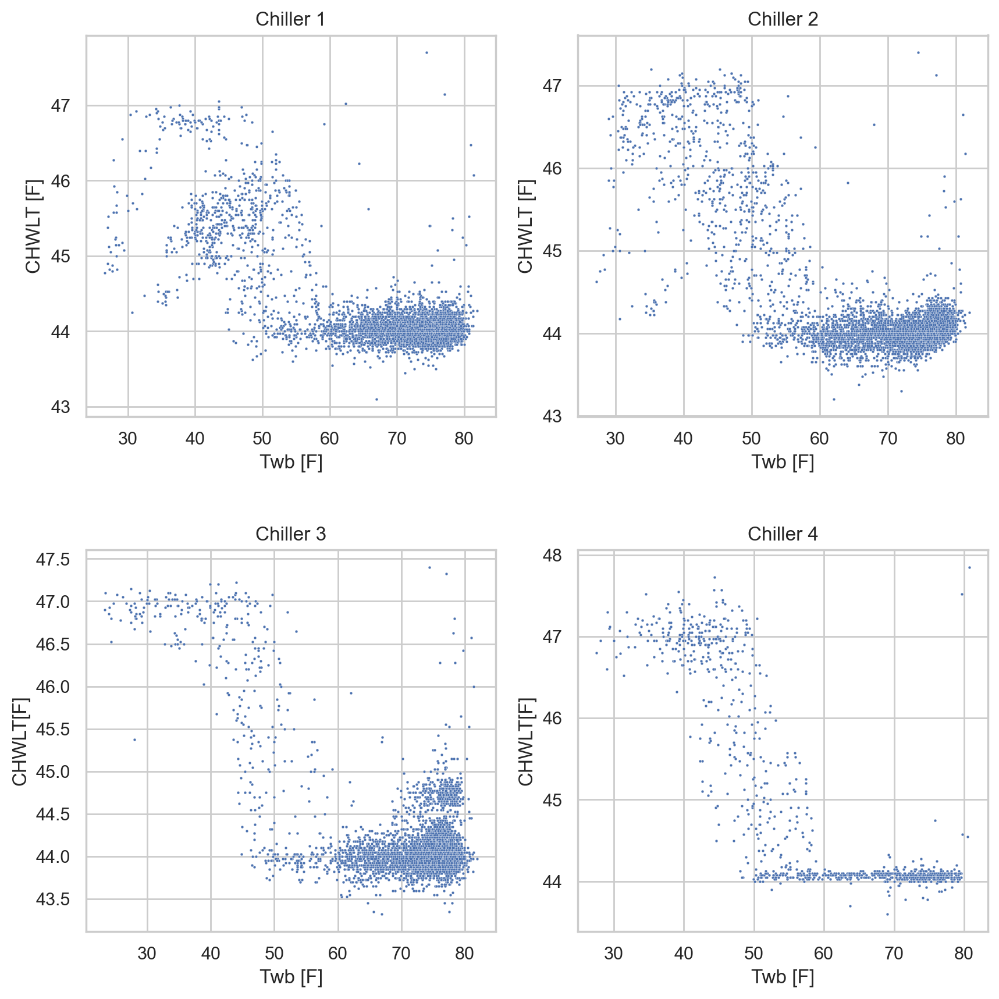

In [103]:
#CHW leaving temperatures
fig,ax = plt.subplots(2,2, figsize=(10,10),dpi=200)

for i,chiller in enumerate(chiller_datasets.keys()):
    if i < 2:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[0][i],s=3)
        ax[0][i].set_xlabel('Twb [F]',fontsize=12)
        ax[0][i].set_ylabel('CHWLT [F]', fontsize=12)
        ax[0][i].set_title('Chiller {n}'.format(n=str(i+1)))
        #ax[0][i].set_ylim(42,48)
    else:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='CHLR_LCHWT{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=3)
        ax[1][i-2].set_xlabel('Twb [F]',fontsize=12)
        ax[1][i-2].set_ylabel('CHWLT[F]', fontsize=12)
        ax[1][i-2].set_title('Chiller {n}'.format(n=str(i+1)))

fig.subplots_adjust(hspace=0.35)

# **REMOVAL OF BAD EFFICIENCY DATA**

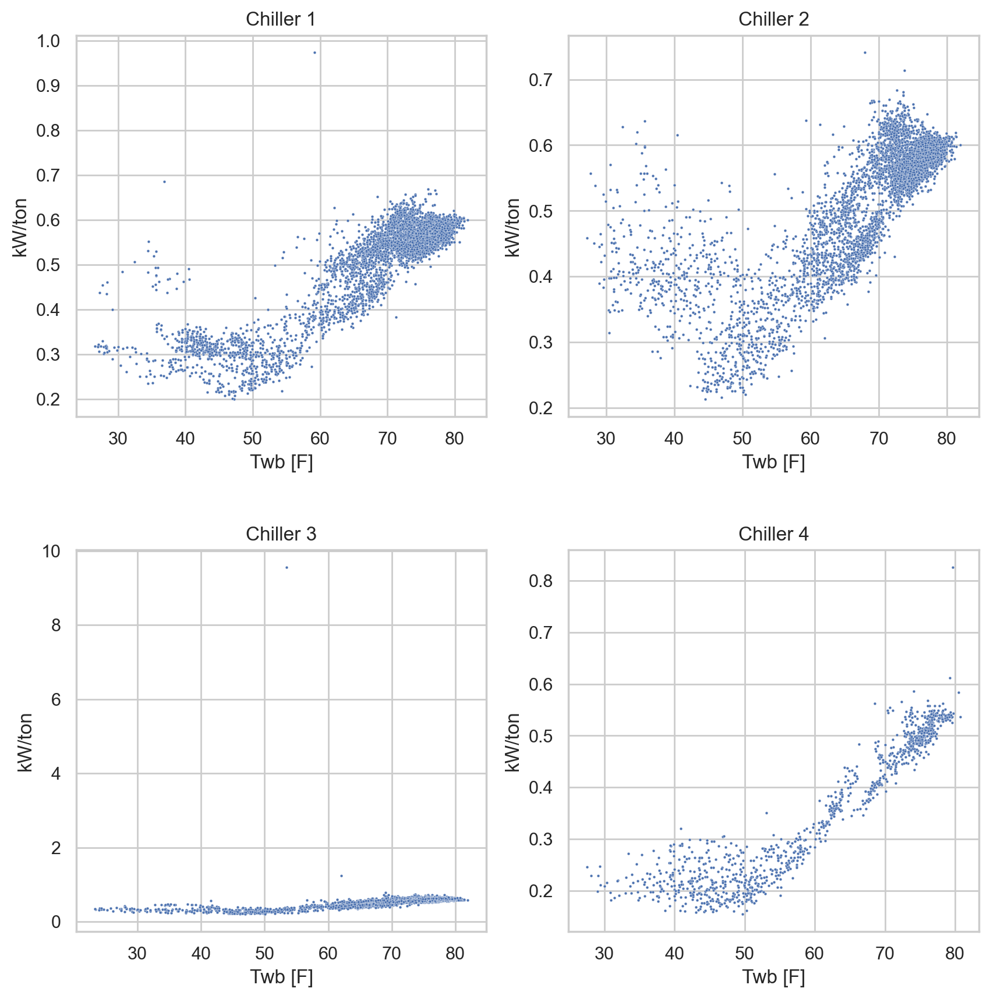

In [104]:
#Chiller efficiencies
for i,chiller in enumerate(chiller_datasets.keys()):
    chiller_datasets[chiller]['kW_ton{n}'.format(n=str(i+1))] = chiller_datasets[chiller]['ELE{n}'.format(n=str(i+1))]/chiller_datasets[chiller]['Load{n}'.format(n=str(i+1))]

fig,ax = plt.subplots(2,2, figsize=(10,10),dpi=200)

for i,chiller in enumerate(chiller_datasets.keys()):
    
    if i < 2:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='kW_ton{n}'.format(n=str(i+1)),ax=ax[0][i],s=3)
        ax[0][i].set_xlabel('Twb [F]',fontsize=12)
        ax[0][i].set_ylabel('kW/ton', fontsize=12)
        ax[0][i].set_title('Chiller {n}'.format(n=str(i+1)))
        #ax[0][i].set_ylim(0,1)
    else:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='kW_ton{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=3)
        ax[1][i-2].set_xlabel('Twb [F]',fontsize=12)
        ax[1][i-2].set_ylabel('kW/ton', fontsize=12)
        ax[1][i-2].set_title('Chiller {n}'.format(n=str(i+1)))
        #ax[1][i-2].set_ylim(0,1)

fig.subplots_adjust(hspace=0.35)

In [105]:
#REMOVAL OF BAD EFFICIENCY VALUES
for i,chiller in enumerate(chiller_datasets.keys()):
    chiller_datasets[chiller] = chiller_datasets[chiller][chiller_datasets[chiller]['kW_ton{n}'.format(n=str(i+1))]<=1]

chiller_datasets['CH1'].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5251 entries, 0 to 5394
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Time_range   5251 non-null   datetime64[ns]
 1   Day_of_week  5251 non-null   int64         
 2   Occupancy    5251 non-null   object        
 3   month        5251 non-null   int64         
 4   Tdb          5251 non-null   float64       
 5   Twb          5251 non-null   float64       
 6   CHLR_LCHWT1  5251 non-null   float64       
 7   CHLR_LCWT1   5251 non-null   float64       
 8   CHLR_RCHWT1  5251 non-null   float64       
 9   CHLR_RCWT1   5251 non-null   float64       
 10  CHW flow1    5251 non-null   float64       
 11  CHWET1       5251 non-null   float64       
 12  CHWLT1       5251 non-null   float64       
 13  CW flow1     5251 non-null   float64       
 14  CWET1        5251 non-null   float64       
 15  CWLT1        5251 non-null   float64       
 16  ELE1  

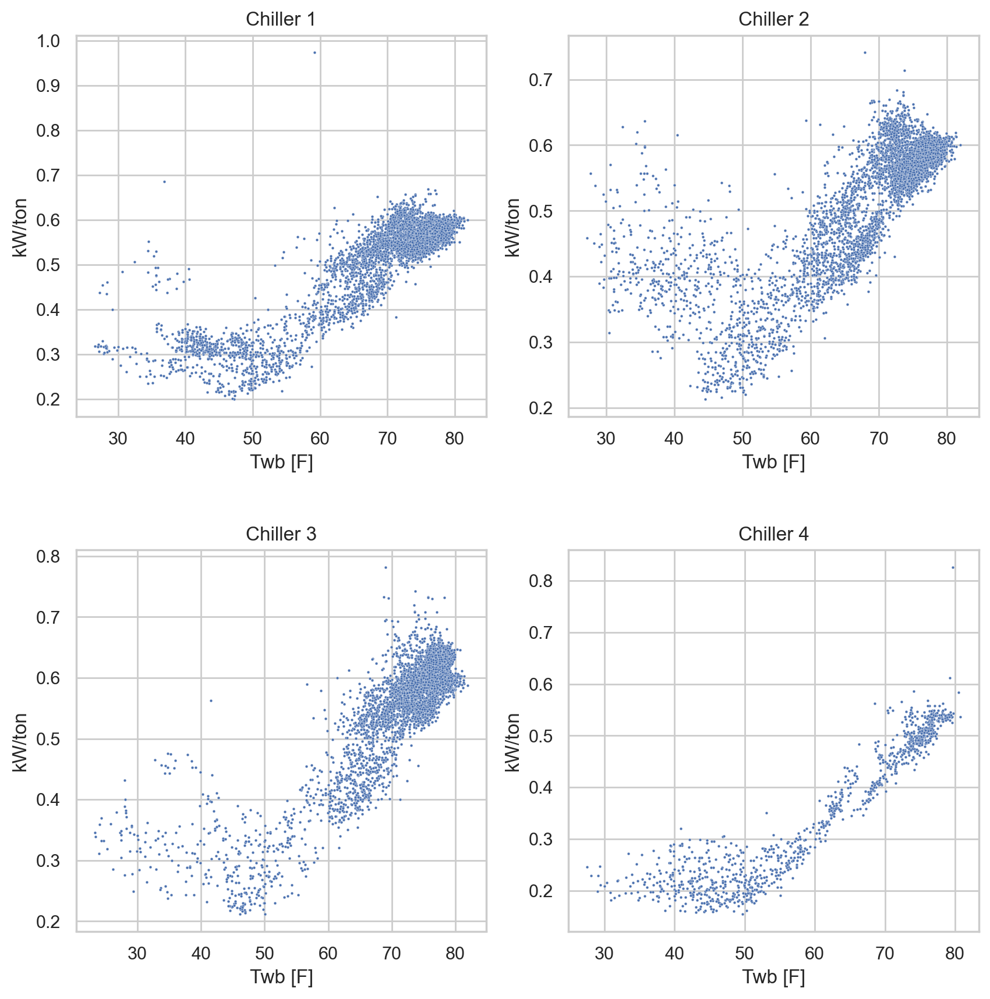

In [106]:
#Chiller efficiencies

fig,ax = plt.subplots(2,2, figsize=(10,10),dpi=200)

for i,chiller in enumerate(chiller_datasets.keys()):
    #Convert the kW_ton values to numeric from string types
    chiller_datasets[chiller]['kW_ton{n}'.format(n=str(i+1))] = pd.to_numeric(chiller_datasets[chiller]['kW_ton{n}'.format(n=str(i+1))]) 
    
    if i < 2:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='kW_ton{n}'.format(n=str(i+1)),ax=ax[0][i],s=3)
        ax[0][i].set_xlabel('Twb [F]',fontsize=12)
        ax[0][i].set_ylabel('kW/ton', fontsize=12)
        ax[0][i].set_title('Chiller {n}'.format(n=str(i+1)))
        #ax[0][i].set_ylim(0,1)
    else:
        sns.scatterplot(data=chiller_datasets[chiller],x='Twb',y='kW_ton{n}'.format(n=str(i+1)),ax=ax[1][i-2],s=3)
        ax[1][i-2].set_xlabel('Twb [F]',fontsize=12)
        ax[1][i-2].set_ylabel('kW/ton', fontsize=12)
        ax[1][i-2].set_title('Chiller {n}'.format(n=str(i+1)))
        #ax[1][i-2].set_ylim(0,1)

fig.subplots_adjust(hspace=0.35)

# Removal of bad CW flow datapoints

**Rename all columns for easier usage**

In [107]:
for chiller in chiller_datasets:
    chiller_datasets[chiller]['month'] = chiller_datasets[chiller]['Time_range'].dt.month_name()
    chiller_datasets[chiller]['month'] = chiller_datasets[chiller]['month'].str[:3]
    
    #Change all columns for all chillers to the same naming format for easy looping through
    chiller_datasets[chiller].columns = ['Time_range','Day_of_week','Occupancy','month','Tdb','Twb','CHLR_LCHWT','CHLR_LCWT',
                                         'CHLR_RCHWT', 'CHLR_RCWT', 'CHW_flow','CHWET', 'CHWLT','CW_flow','CWET', 'CWLT',
                                         'ELE', 'CHLR_ON','PLR', 'PLR_sec','chillers_no', 'Load', 'kW_ton']
#Check the month column
chiller_datasets['CH1'].head()

,Time_range,Day_of_week,Occupancy,month,Tdb,Twb,CHLR_LCHWT,CHLR_LCWT,CHLR_RCHWT,CHLR_RCWT,...,CW_flow,CWET,CWLT,ELE,CHLR_ON,PLR,PLR_sec,chillers_no,Load,kW_ton
0,2019-01-01 00:00:00,2,Unoccupied,Jan,46.940,44.930620,44.950,54.825,48.775,56.575,...,1798.325,54.907,56.215,31.00,1.0,0.155743,1.383711,1,93.445547,0.331744
1,2019-01-01 01:00:00,2,Unoccupied,Jan,46.604,44.656086,44.700,54.650,48.650,56.375,...,1801.663,54.748,56.078,30.75,1.0,0.160112,1.417633,1,96.067292,0.320088
2,2019-01-01 02:00:00,2,Unoccupied,Jan,44.060,42.622744,44.900,54.875,48.550,56.500,...,1802.898,54.930,56.192,31.25,1.0,0.154403,1.356249,1,92.641562,0.337322
3,2019-01-01 03:00:00,2,Unoccupied,Jan,43.934,43.015251,44.975,54.875,48.700,56.450,...,1801.423,54.867,56.120,31.25,1.0,0.155532,1.421435,1,93.319010,0.334873
4,2019-01-01 04:00:00,2,Unoccupied,Jan,42.875,42.421400,45.000,54.925,48.600,56.650,...,1800.285,54.973,56.280,30.50,1.0,0.152975,1.341871,1,91.785000,0.332298


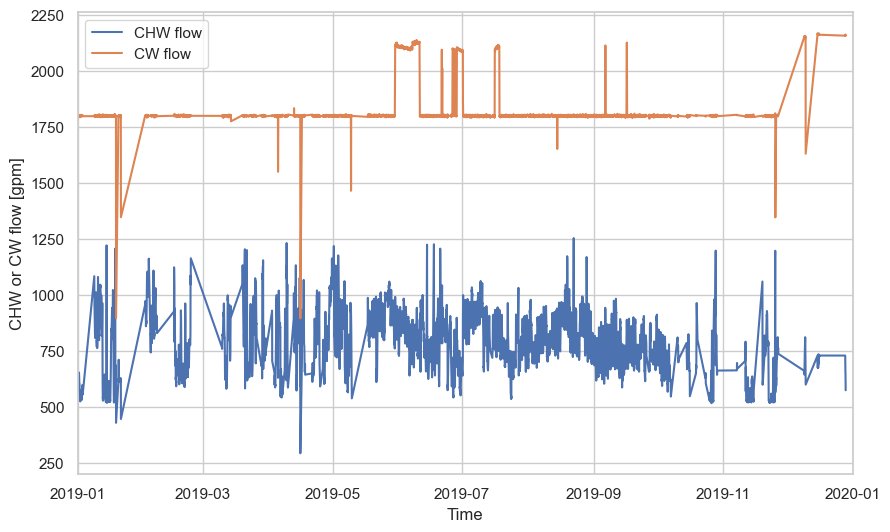

In [114]:
#Distribution of weather conditions
fig = plt.figure(figsize=(10,6),dpi=100)

sns.lineplot(data=chiller_datasets['CH1'],x='Time_range',y='CHW_flow',label='CHW flow')
sns.lineplot(data=chiller_datasets['CH1'],x='Time_range',y='CW_flow',label='CW flow')
plt.xlabel('Time')
plt.ylabel('CHW or CW flow [gpm]')
plt.xlim(datetime(2019,1,1,0,0,0),datetime(2020,1,1,0,0,0));

In [1]:
#Remove data with CW flow that is very far from the expected CW flow value
for i,chiller in enumerate(chiller_datasets.keys()):
    chiller_datasets[chiller] = chiller_datasets[chiller][(chiller_datasets[chiller]['CW_flow']>1750)]


# Removal of the CW flows > 2000 does not have a substantial effect on the performance of the models
chiller_datasets[chiller_datasets['CH2']['CW_flow']>1750]

NameError: name 'chiller_datasets' is not defined

# #Data points per month

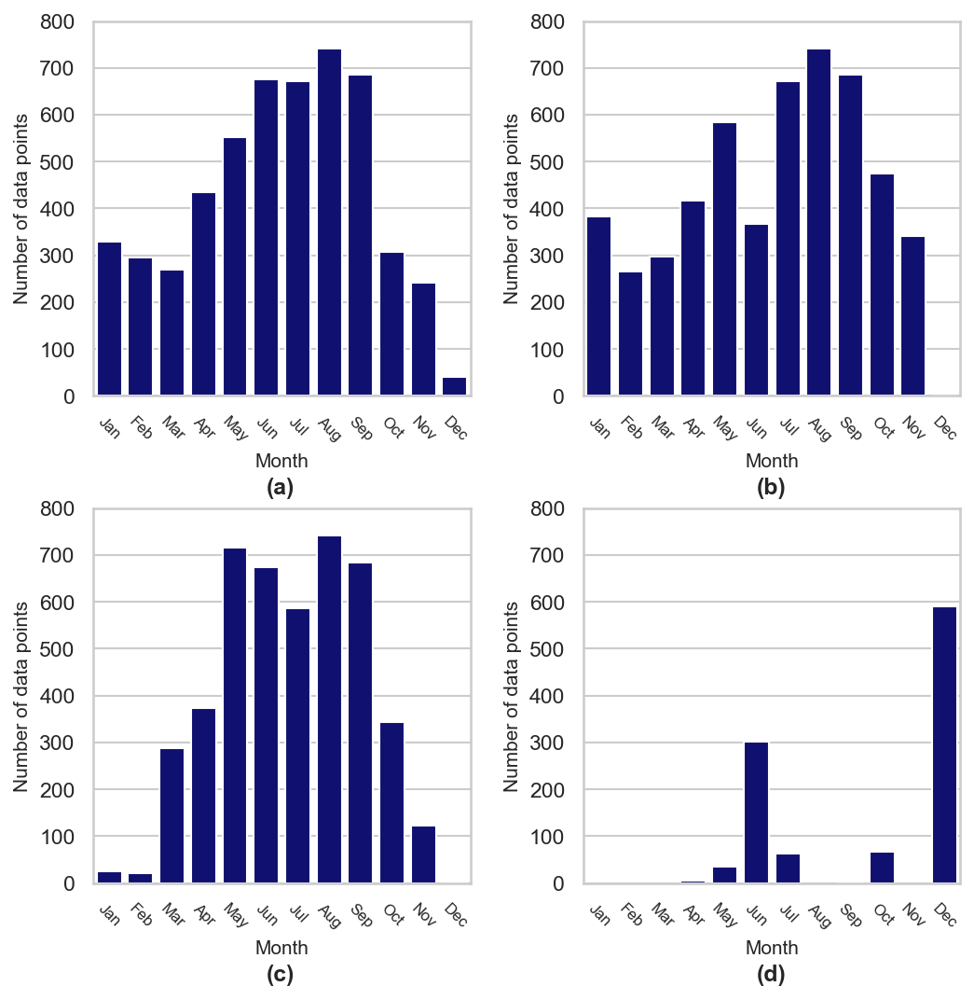

In [118]:
category_order = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

title_text =['(a)','(b)','(c)','(d)']
title_x = [5,5,5,5]
title_y = [-210,-210,-210,-210]
fig,ax = plt.subplots(2,2, figsize=(8,8),dpi=150)

for i,chiller in enumerate(chiller_datasets.keys()):
    sns.set_theme(style="whitegrid")
    
    if i<2:
        g = sns.countplot(data=chiller_datasets[chiller], x="month", ax = ax[0][i],color='navy',order=category_order)
        g.tick_params(rotation=-45,axis='x',labelsize=8)
        g.set_ylabel('Number of data points',fontsize=10)
        g.set_xlabel('Month',fontsize=10)
        #g.set_title('CH{n}'.format(n=str(i+1)))
        g.set_ylim([0,800])
        ax[0][i].text(title_x[i],title_y[i],title_text[i],fontweight='bold')
    else:
        g = sns.countplot(data=chiller_datasets[chiller], x="month", ax = ax[1][i-2],color='navy',order=category_order)
        g.tick_params(rotation=-45,axis='x',labelsize=8)
        g.set_ylabel('Number of data points',fontsize=10)
        g.set_xlabel('Month',fontsize=10)
        #g.set_title('CH{n}'.format(n=str(i+1)))
        g.set_ylim([0,800])
        ax[1][i-2].text(title_x[i],title_y[i],title_text[i],fontweight='bold')
        
fig.subplots_adjust(hspace=0.3,wspace=0.3)
fig.savefig('Monthly_Data_Distribution.png',bbox_inches='tight')

# Secondary Loop Data

In [119]:
secondary = chillers[['Time_range','Tdb','Twb','CHW Pump1','CHW Pump2','CHW Pump3','CHW Pump4','CT Fan1','CT Fan2',
                      'CT Fan3','CT Fan4','CW Pump1','CW Pump2','CW Pump3','CW Pump4','CHW Bypass flow',
                      'CHW loop Return Temp', 'CHW loop Supply Temp', 'CHW make up flow','CHW make up flow total',
                      'Secondary CHW flow', 'sec_load',]]

secondary

,Time_range,Tdb,Twb,CHW Pump1,CHW Pump2,CHW Pump3,CHW Pump4,CT Fan1,CT Fan2,CT Fan3,...,CW Pump2,CW Pump3,CW Pump4,CHW Bypass flow,CHW loop Return Temp,CHW loop Supply Temp,CHW make up flow,CHW make up flow total,Secondary CHW flow,sec_load
0,2019-01-01 00:00:00,46.940,44.930620,0.0,0.0,0.0,7.050,0.0,0.0,0.0,...,0.0,0.13,22.000,0.000,48.370,45.675,0.14,27764.05,601.403,67.532545
1,2019-01-01 01:00:00,46.604,44.656086,0.0,0.0,0.0,6.900,0.0,0.0,0.0,...,0.0,0.13,21.775,-0.013,48.225,45.505,0.14,27764.05,597.935,67.765967
2,2019-01-01 02:00:00,44.060,42.622744,0.0,0.0,0.0,7.200,0.0,0.0,0.0,...,0.0,0.13,19.475,0.013,48.218,45.590,0.14,27764.05,623.810,68.307195
3,2019-01-01 03:00:00,43.934,43.015251,0.0,0.0,0.0,7.200,0.0,0.0,0.0,...,0.0,0.13,19.775,0.000,48.307,45.745,0.14,27764.05,615.000,65.651250
4,2019-01-01 04:00:00,42.875,42.421400,0.0,0.0,0.0,7.275,0.0,0.0,0.0,...,0.0,0.13,19.225,-0.025,48.305,45.673,0.14,27764.05,623.715,68.400745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8447,2019-12-31 19:00:00,51.080,39.881456,0.0,0.0,0.0,6.475,0.0,0.0,0.0,...,0.0,0.13,0.000,197.238,53.292,47.572,0.92,35834.12,342.185,81.554092
8448,2019-12-31 20:00:00,50.954,40.680224,0.0,0.0,0.0,6.425,0.0,0.0,0.0,...,0.0,0.13,0.000,229.225,52.830,47.765,0.92,35834.12,308.155,65.033545
8449,2019-12-31 21:00:00,49.874,40.795754,0.0,0.0,0.0,6.400,0.0,0.0,0.0,...,0.0,0.13,0.000,218.500,52.655,47.753,0.92,35834.12,311.995,63.724979
8450,2019-12-31 22:00:00,48.920,41.083604,0.0,0.0,0.0,6.350,0.0,0.0,0.0,...,0.0,0.13,0.000,239.075,52.360,47.472,0.92,35834.12,298.965,60.889205


# DATA OUTPUT

**Chiller Data and Secondary Loop Data**

In [121]:
from pandas import ExcelWriter

def save_xls(dict_df, path):
    """
    Save a dictionary of dataframes to an excel file, 
    with each dataframe as a separate page
    """

    writer = ExcelWriter(path)
    for key in dict_df.keys():
        dict_df[key].to_excel(writer, sheet_name=key)

    writer.save()

#Creation of the dictionary to use with the save_xls function
chiller_dict = {}
for i,chiller in enumerate(chiller_datasets.keys()):
    chiller_dict[chiller] = chiller_datasets[chiller]
    
chiller_dict['SecondaryLoop'] = secondary

#Save the chiller datasets to the same workbook
save_xls(chiller_dict,'CleanedData.xlsx')

**Combined data after cleaning**

In [122]:
#Combined chiller data df
combined_data = pd.merge(chiller_datasets['CH1'],chiller_datasets['CH2'],how='left',on='Time_range',suffixes=['_CH1','_CH2'])
combined_data = pd.merge(combined_data,chiller_datasets['CH3'],how='left',on='Time_range')
combined_data = pd.merge(combined_data,chiller_datasets['CH4'],how='left',on='Time_range',suffixes = ['_CH3','_CH4'])
combined_data = combined_data.fillna(value=0)

#Drop all repeated Tdb, Twb, and months columns
combined_data.drop(columns=['Day_of_week_CH2','Occupancy_CH2','month_CH2','Tdb_CH2','Twb_CH2','Day_of_week_CH3',
                           'Occupancy_CH3','month_CH3','Tdb_CH3','Twb_CH3','Day_of_week_CH4','Occupancy_CH4','month_CH4',
                            'Tdb_CH4','Twb_CH4'], inplace=True)

#Rename the colummns for easy identification
name_mapping = {'Day_of_week_CH1':'Day_of_week','Occupancy_CH1':'Occupancy','Tdb_CH1':'Tdb','Twb_CH1':'Twb',
                'month_CH1':'month'}
combined_data.rename(columns=name_mapping,inplace=True)

combined_data['Total_load'] = combined_data['Load_CH1']+combined_data['Load_CH2']+combined_data['Load_CH3']+combined_data['Load_CH4']

combined_data.to_excel('Combined_cleaned_data.xlsx', index=False)

combined_data.columns

Index(['Time_range', 'Day_of_week', 'Occupancy', 'month', 'Tdb', 'Twb',
       'CHLR_LCHWT_CH1', 'CHLR_LCWT_CH1', 'CHLR_RCHWT_CH1', 'CHLR_RCWT_CH1',
       'CHW_flow_CH1', 'CHWET_CH1', 'CHWLT_CH1', 'CW_flow_CH1', 'CWET_CH1',
       'CWLT_CH1', 'ELE_CH1', 'CHLR_ON_CH1', 'PLR_CH1', 'PLR_sec_CH1',
       'chillers_no_CH1', 'Load_CH1', 'kW_ton_CH1', 'CHLR_LCHWT_CH2',
       'CHLR_LCWT_CH2', 'CHLR_RCHWT_CH2', 'CHLR_RCWT_CH2', 'CHW_flow_CH2',
       'CHWET_CH2', 'CHWLT_CH2', 'CW_flow_CH2', 'CWET_CH2', 'CWLT_CH2',
       'ELE_CH2', 'CHLR_ON_CH2', 'PLR_CH2', 'PLR_sec_CH2', 'chillers_no_CH2',
       'Load_CH2', 'kW_ton_CH2', 'CHLR_LCHWT_CH3', 'CHLR_LCWT_CH3',
       'CHLR_RCHWT_CH3', 'CHLR_RCWT_CH3', 'CHW_flow_CH3', 'CHWET_CH3',
       'CHWLT_CH3', 'CW_flow_CH3', 'CWET_CH3', 'CWLT_CH3', 'ELE_CH3',
       'CHLR_ON_CH3', 'PLR_CH3', 'PLR_sec_CH3', 'chillers_no_CH3', 'Load_CH3',
       'kW_ton_CH3', 'CHLR_LCHWT_CH4', 'CHLR_LCWT_CH4', 'CHLR_RCHWT_CH4',
       'CHLR_RCWT_CH4', 'CHW_flow_CH4', 'CHWET_